# Deep Learning (/Online) CT5133 / CT5145, 2024-2025

# Assignment 2

* In this assignment we will use a modern neural network library, ie Keras or PyTorch;
* We will create a small model for classification of the Fashion-MNIST dataset;
* We will inspect and comment on the output of each layer before training, and after 1 epoch, after 2 more epochs, etc.;
* We will look at the performance of the model.

# Admin details

**Weight**: This assignment is worth 20% of the module.

**Submission**: Work in this file, and submit a single `.ipynb` file. Do not submit a `.zip`.

**Due date**: end of Week 10, as announced on Canvas. No extensions are possible because of the requirement for interviews (see below).

**Groups**: you may work alone, or in a group of 2 of your choice. If in a group of 2, you must inform the lecturer of the group by email, cc-ing both members and including both members' names and ID numbers. You must send that email at least 1 week before the due date. And you must work together on all parts: you cannot divide the parts up between the group members. If in a group of 2, both students should make a submission and both should be identical.

**Academic integrity**: You may discuss the assignment with other students/groups, but may not show your work to others or allow others to see yours. You may use code sourced from the internet, and code sourced from AI. You must include a citation and URL in such cases, showing specifically what parts of your code were sourced from what. For example, a URL should be placed to show which lines were sourced from which page. If using AI, you must cite the AI name and version, and URL, and quote the prompt(s). Regardless of what you submit, you must understand it when interviewed (see below).

**Interviews**: after submission, some students/groups will be interviewed to check on their understanding of their own work. An inability to explain your work may result in a grade penalty, a zero grade, or an academic integrity report. Students who discuss their genuine work-in-progress with lecturer or TAs in labs before submission are less likely to be selected for interview. Students who submit code that suggests a lack of understanding are more likely to be selected for interview. Submissions which appear to be unrelated to class materials, discussions, code and terminology as used in class and labs, are more likely to be selected for interview. Interviews will take place **during the normal lab times**, that is Tuesdays 4-6pm (CT5133) and Tuesdays / Thursdays 6-7pm (CT5145) during Weeks 11 and 12. Please book these slots in your calendar now, as when individuals are called to interview there will not be an opportunity to reschedule. Failure to attend interview will result in a zero grade for the assignment.

**Academic integrity: School policy and guidelines**: https://www.universityofgalway.ie/science-engineering/school-of-computer-science/currentstudents/academicintegrity/

# Tasks

1. Load the Fashion-MNIST dataset.
2. Create a suitable small model in Keras or PyTorch, ending in a suitable softmax layer, and show a summary of the layers and number of parameters, but do not train it yet.
3. Calculate its performance on `x_test, y_test`, and illustrate its performance by completing the function `display_images_labels_preds` and calling it.
4. For each layer (excluding layers with no weights, such as Batch-Norm, Dropout, Maxpool), extract the outputs of that layer when running the model on `x_viz`.
5. Use the provided code `visualize_layer_outputs` to visualise (a subset of) the outputs found in step 3, coloured by `y_viz`.
6. Now train for 1 epoch, and repeat steps 3-5.
7. Now train for 2 **more** epochs (total 3 epochs so far), and repeat steps 3-5.
8. Now train for 3 **more** epochs (total 6 epochs so far), and repeat steps 3-5.
9. Continue until you judge the model is trained sufficiently.
10. Comment very briefly (eg, up to 5 bullet-points) on the distributions you observe in steps 3-9. Marks will be awarded for insight, not comprehensiveness. That is, you need to show you know what has happened and why. You don't need to comment on every individual plot.

# Notes

* A lot of code is provided below.
* You may wish to wrap all of steps 3-9 in a for-loop, rather than writing it out as separate steps.
* Before completing all of the above, you may wish to experiment with different models and hyperparameters until you arrive at a design that will train successfully (eg, at least 80% accuracy on `x_test, y_test`).
* You may be able to carry out training for this assignment locally. Google Colab or other online services can also be used.
* I am loading the data using Keras, but you can use Keras or PyTorch for your code.

# Some typical interview questions

* Why does this layer have this number of parameters?
* What does this line of code do?
* Why is the data distributed in this way?
* Which layer gives the most useful embedding for the classification task?

In [1]:
import tensorflow as tf
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Dense, Flatten, InputLayer, Dropout, BatchNormalization, MaxPooling2D

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import pandas as pd

In [2]:

def load_fashion_mnist_5():

    # loading F-MNIST using Keras
    # we select just 5 of the Fashion-MNIST classes
    # we're also going to discard a lot of data, just to make training quick,
    # and make it easy to see the progress of a *small* amount of training at a time
    # in real life, we pretty much never discard training data.


    (x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()

    # Filter 5 classes from training data
    selected_classes = [0, 1, 2, 3, 4]
    mask_train = np.isin(y_train, selected_classes)
    x_train = x_train[mask_train]
    y_train = y_train[mask_train]

    # Filter test data
    mask_test = np.isin(y_test, selected_classes)
    x_test = x_test[mask_test]
    y_test = y_test[mask_test]

    # reshape
    x_train = x_train.reshape(-1, 28, 28, 1)
    x_test = x_test.reshape(-1, 28, 28, 1)

    # discard many of the images
    idxs = np.random.choice(x_train.shape[0], size=2000, replace=False)
    x_train = x_train[idxs]
    y_train = y_train[idxs]

    # we only need a little data for test, again just to make things quick
    idxs = np.random.choice(x_test.shape[0], size=500, replace=False)
    x_test = x_test[idxs]
    y_test = y_test[idxs]

    # we also want a very small subset of unseen data for visualisation.
    idxs = np.random.choice(x_test.shape[0], size=200, replace=False)
    x_viz = x_test[idxs]
    y_viz = y_test[idxs]

    return (x_train, y_train), (x_test, y_test), (x_viz, y_viz)

In [3]:
(x_train, y_train), (x_test, y_test), (x_viz, y_viz) = load_fashion_mnist_5()
print(f"x_train: {x_train.shape}")
print(f"y_train: {y_train.shape}")
print(f"y_viz classes: {np.unique(y_train)}")
print(f"x_test: {x_test.shape}")
print(f"y_test: {y_test.shape}")
print(f"y_viz classes: {np.unique(y_test)}")
print(f"x_viz: {x_viz.shape}")
print(f"y_viz: {y_viz.shape}")
print(f"y_viz classes: {np.unique(y_viz)}")


x_train: (2000, 28, 28, 1)
y_train: (2000,)
y_viz classes: [0 1 2 3 4]
x_test: (500, 28, 28, 1)
y_test: (500,)
y_viz classes: [0 1 2 3 4]
x_viz: (200, 28, 28, 1)
y_viz: (200,)
y_viz classes: [0 1 2 3 4]


In [4]:
# Create model
model = Sequential() # YOUR CODE HERE. create and compile the model, but don't train it yet
model.add(layer= InputLayer(shape = x_train.shape[1:]))
model.add(Conv2D(filters = 32, kernel_size=3, activation= 'relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size= (2,2)))
model.add(Dropout(0.2))

model.add(Conv2D(filters = 64, kernel_size=3, activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2)))
model.add(Dropout(0.2))

model.add(Flatten())
model.add(Dense(units= 128, activation= 'relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(units = 5, activation = 'softmax'))

model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])

#### Here i have taken final dense layer units as 5 cause as mentioned in the code that at max of 5 classes used, although during my research i found out that MNIST dataset has a total of 10 classes.


#### For loss in this case there are 2 options: categorical_crossentropy and sparse_categorical_crossentropy. Categorical_crossentropy is used when we have labels as one-hot encoded e.g [0,1,0,1] etc. and sparse_categorical_crossentropy is used when we have labels provided as integers (eg. 0,1,2,3...). Since in this case we have final labels from 0-4 thereforse use sparse_categorical_crossentropy.

In [5]:
# Summarise the model
model.summary()
# YOUR CODE HERE. print out a summary of the model's layers, number of parameters.

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 26, 26, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 26, 26, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 13, 13, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 13, 13, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 11, 11, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 11, 11, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 5, 5, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 5, 5, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1600)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 225,285 (880.02 KB)

 Trainable params: 224,837 (878.27 KB)

 Non-trainable params: 448 (1.75 KB)

In [6]:
def display_images_labels_preds(model, x, y, n_images=4):
    # display some of the images in x, with the ground-truth label and the model's label
    # see below for an example

    # model: an NN model which can be run
    # x: image data of shape (n, 28, 28, 1)
    # y: label data of shape (n,)

    # YOUR CODE HERE: run the model to get its predictions
    _,accuracy = model.evaluate(x, y) # getting accuracy of the model
    predictions = np.argmax(model.predict(x), axis = 1)
    plt.figure(figsize=(15, 3))
    for i in range(n_images):
        idx = random.randrange(len(y))
        plt.subplot(1, n_images, i+1)
        plt.imshow(x[idx].reshape(28, 28), cmap='gray')
        plt.title(f'True: {y[idx]} \n Pred: {predictions[idx]}')# YOUR CODE HERE: show the true y value and the model's prediction
        plt.axis('off')
    plt.tight_layout()
    print(f"The model accuracy is: {accuracy}")


In [7]:
def extract_layers_outputs(model, x):
    outputs = []

    # YOUR CODE HERE. run x through the model, and save the resulting output from *each* layer to the list 'outputs'
    for layer in model.layers:
      if hasattr(layer, 'weights') and len(layer.weights) > 0: # This condition makes sure to avoid layers with 0 weights
        sub_model = tf.keras.Model(inputs = model.inputs, outputs = layer.output)
        layer_output = sub_model.predict(x)
        outputs.append(layer_output)
    return outputs

In [8]:
def visualize_layer_outputs(layer_output, y, max_features=5):

    # create a pairplot to show the pairwise distributions of several features from among those in layer_output
    # max_features is 5 as it's hard to look at more pairwise plots than this
    # if layer_output contains more than 5 features, we randomly sub-sample.

    # THIS FUNCTION IS COMPLETE, no need to write anything.
    # This function is expected to work regardless of what NN library you use,
    # as it just treats layer_output as a numpy array

    # Flatten the layer output, so we can deal with output from this layer no matter what shape
    samples = layer_output.shape[0]
    flattened = layer_output.reshape(samples, -1)

    # Select features (all if less than max_features, otherwise random sample)
    feature_count = flattened.shape[1]
    if feature_count <= max_features:
        selected_indices = range(feature_count)
    else:
        selected_indices = np.random.choice(feature_count, max_features, replace=False)

    # Create DataFrame with selected features
    df = pd.DataFrame(flattened[:, selected_indices],
                     columns=[f'Feature_{i}' for i in selected_indices])
    df['Class'] = y  # Add labels as a column

    # Create the pairplot with hue parameter for coloring by class
    plot = sns.pairplot(df, corner=True, diag_kind='kde', hue='Class', palette='Set1')
    plt.suptitle(f'Layer Output Distribution (showing {len(selected_indices)} features)', y=1.02)

    return plot


# Without Train Observations

16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.1340 - loss: 45.3701
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
The model accuracy is: 0.11400000005960464


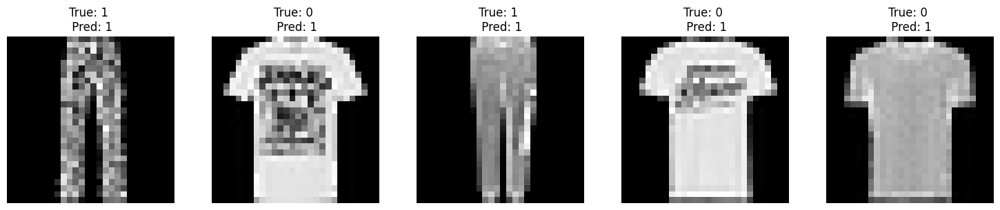

In [9]:
display_images_labels_preds(model, x_test, y_test, 5)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(32, 28, 28, 1))
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 28, 28, 1))
  warnings.warn(msg)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


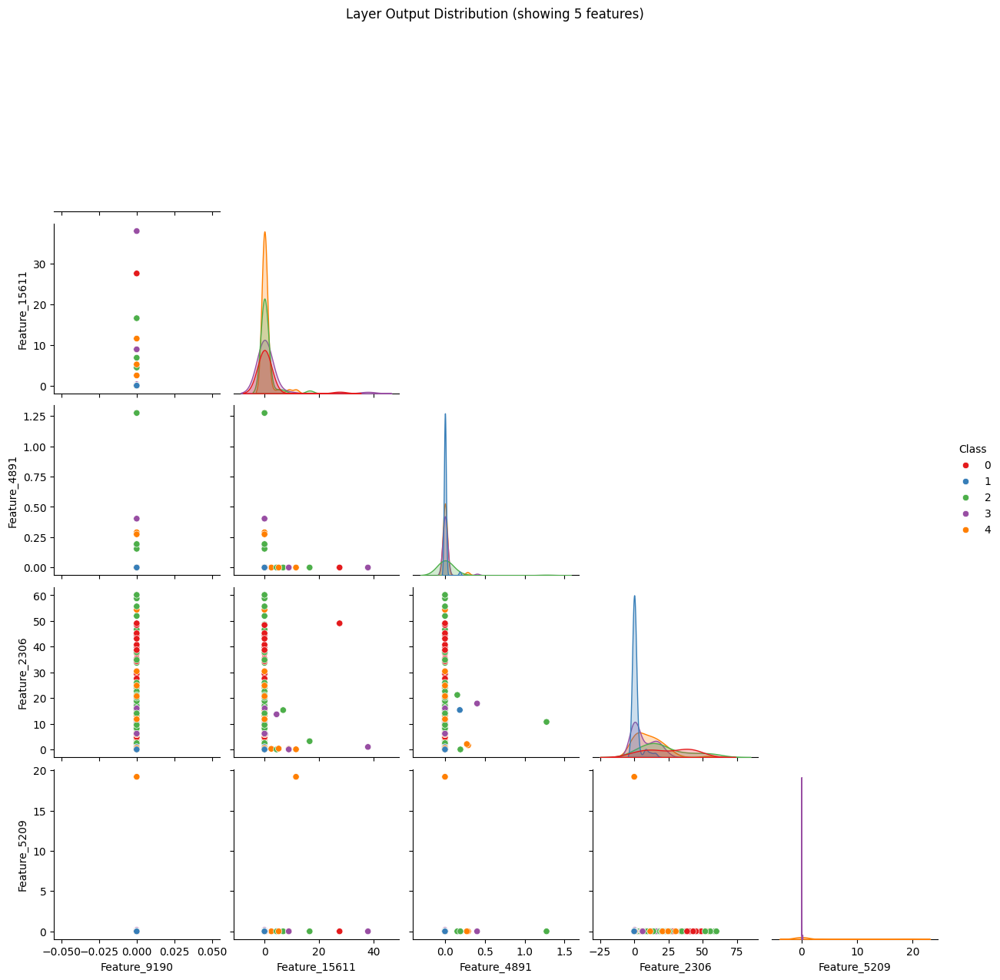

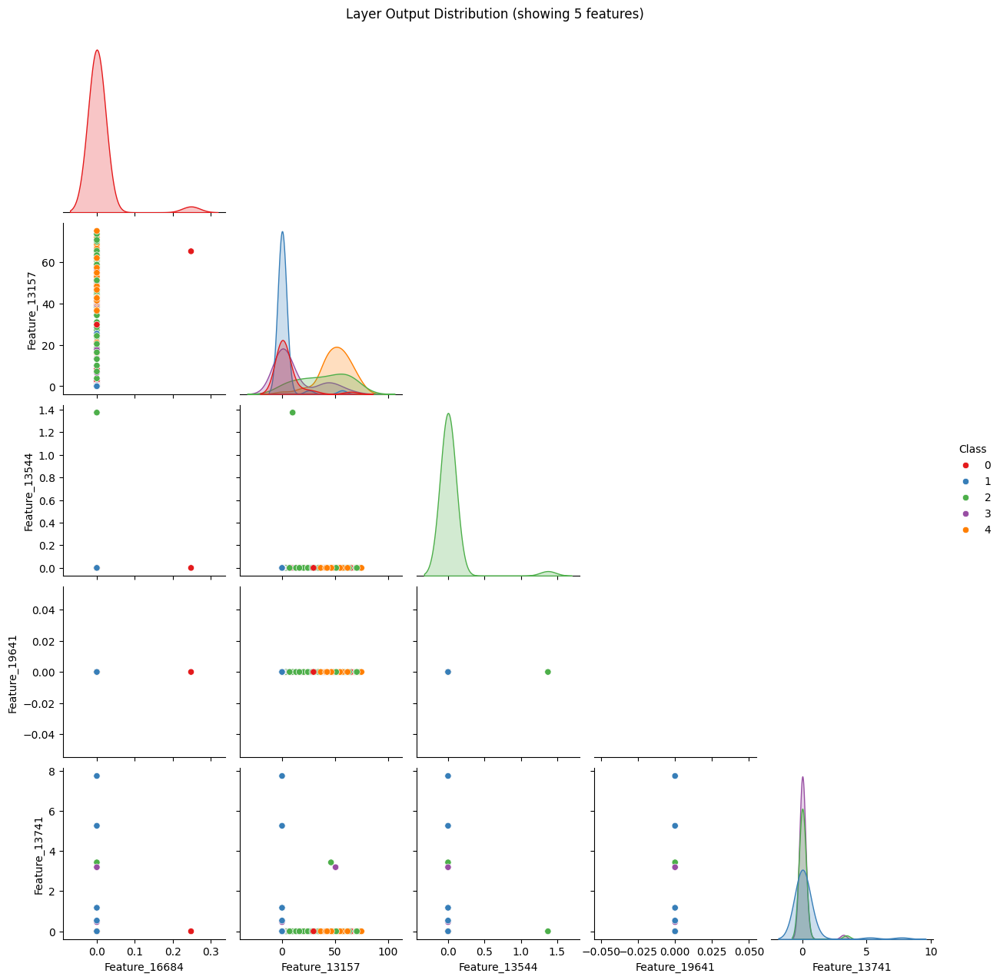

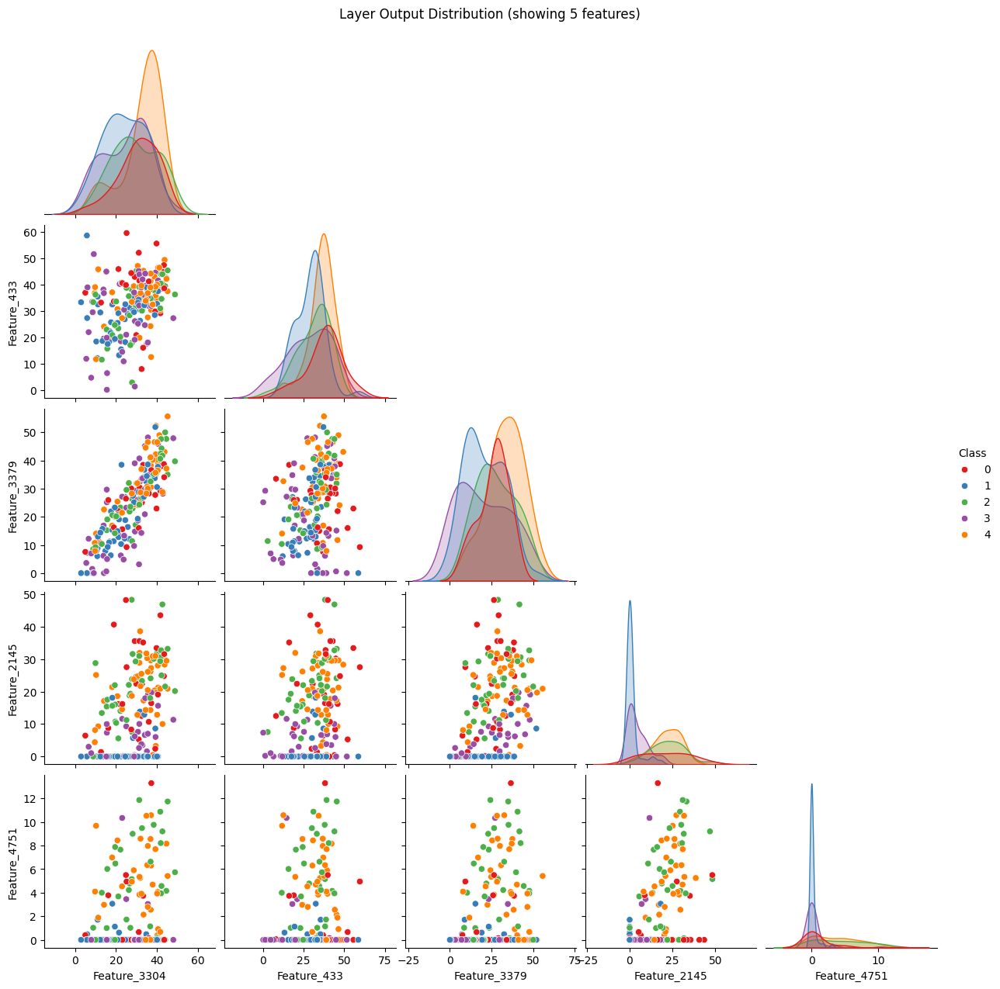

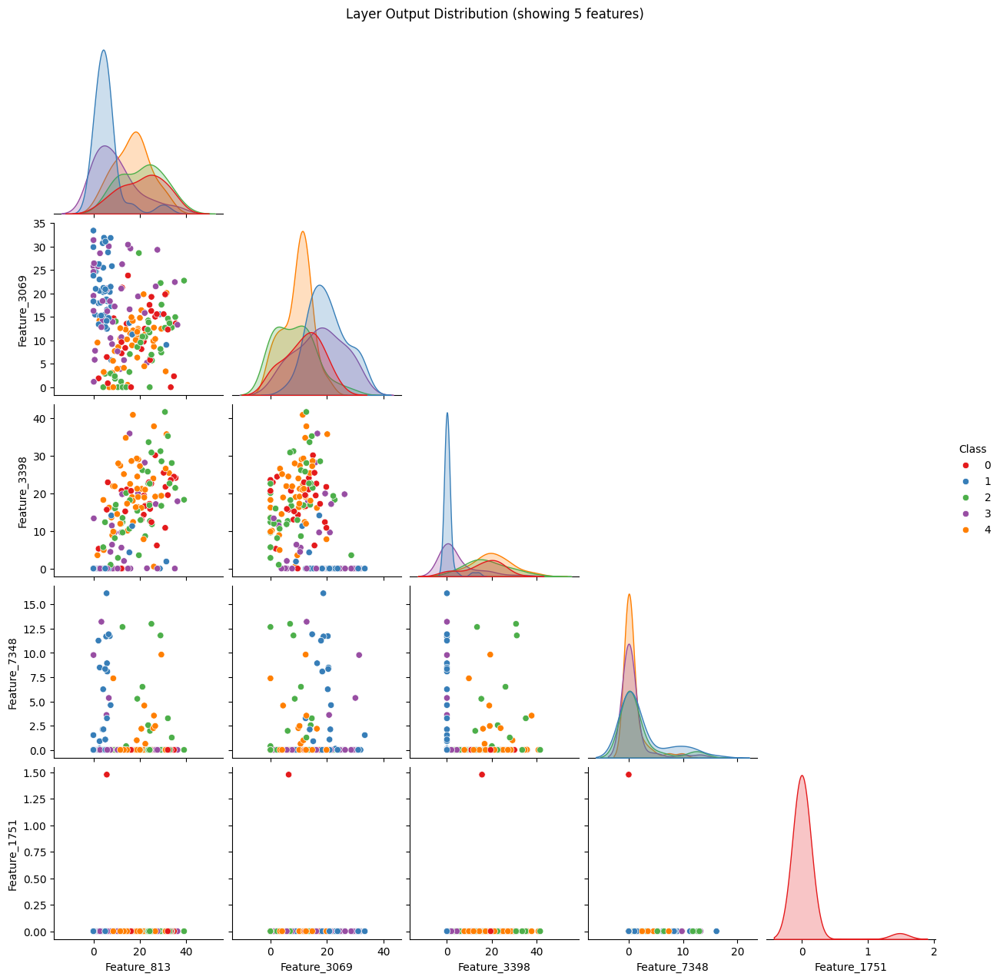

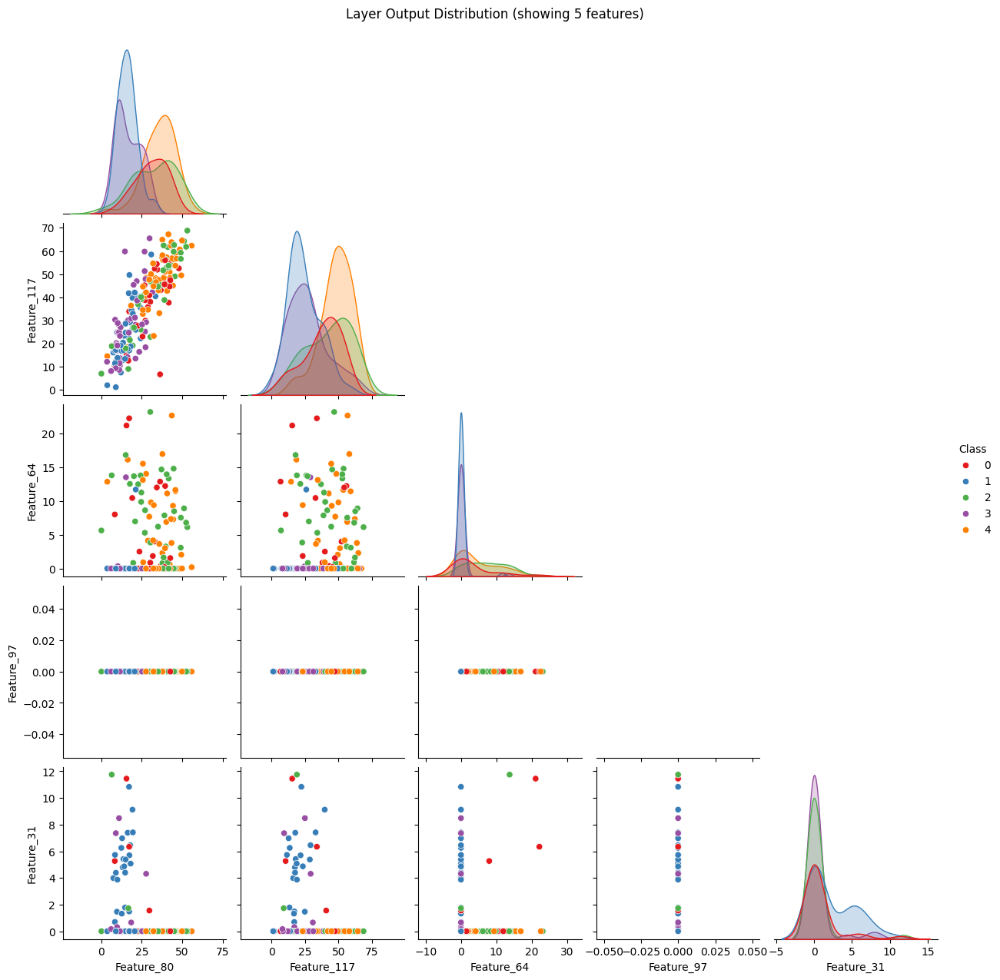

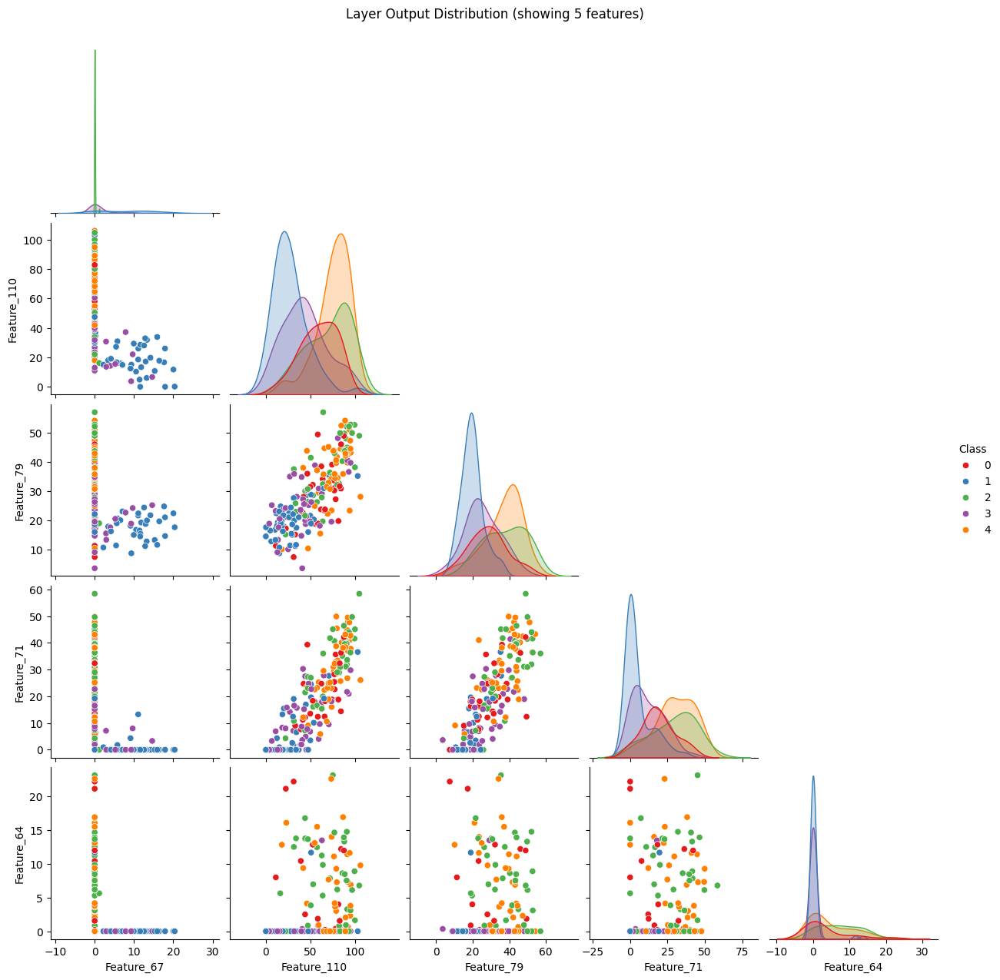

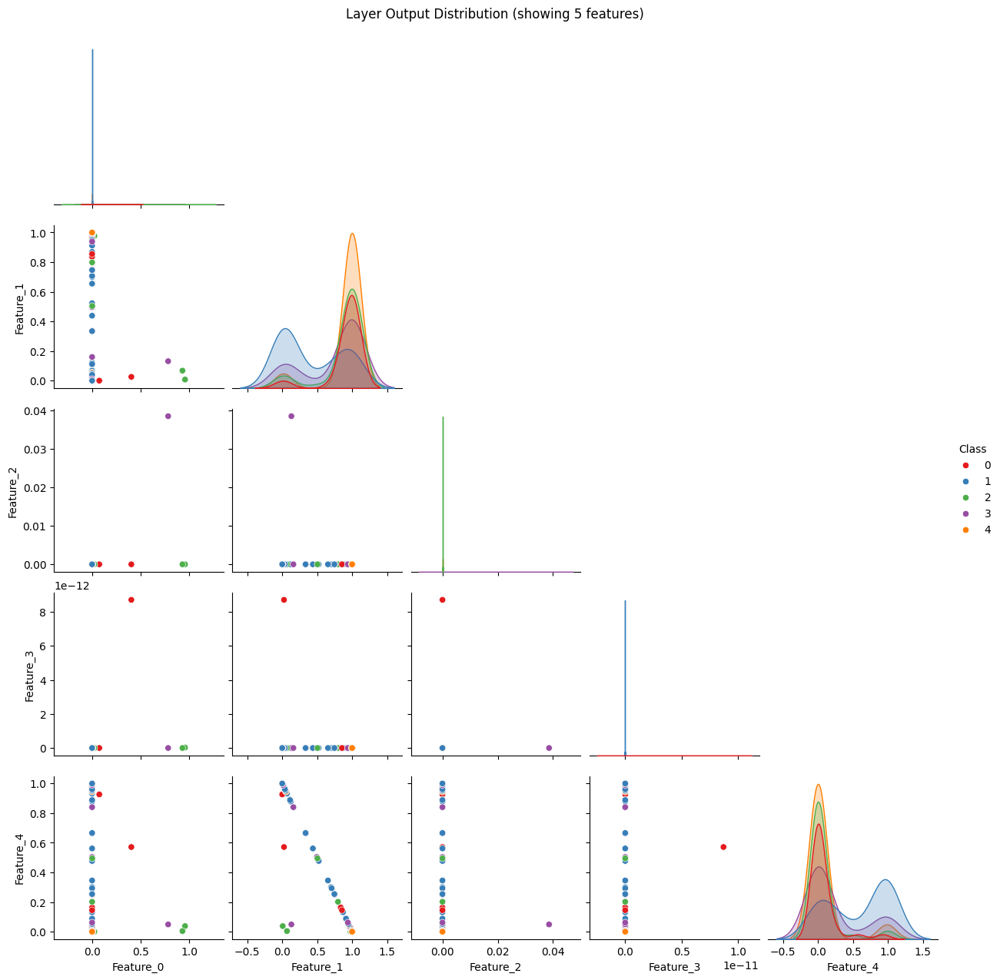

In [10]:
# YOUR CODE HERE. visualise, look at performance, train for some epoch(s), repeat
layer_outputs = extract_layers_outputs(model, x_viz)
for i ,(layer,layer_output) in enumerate(zip(model.layers, layer_outputs)):
  plot = visualize_layer_outputs(layer_output, y_viz)
  plot.savefig(f'layer_{i}.png')
  plt.show()

# visualize_layer_outputs()

# Observations with 1 epoch

In [11]:
# Cell created for training the model
model.fit(x_train, y_train, epochs = 1, validation_data = (x_test, y_test))

63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.6347 - loss: 1.0226 - val_accuracy: 0.8100 - val_loss: 0.5456


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8137 - loss: 0.6145
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
The model accuracy is: 0.8100000023841858


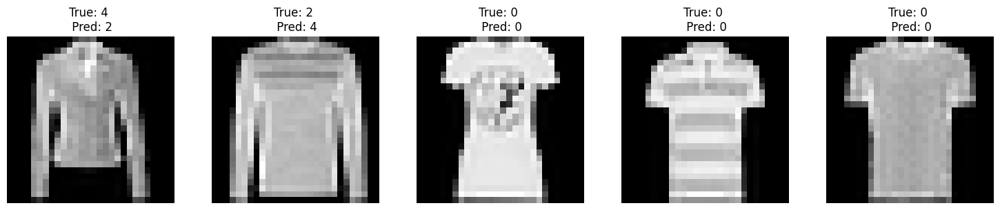

In [12]:
display_images_labels_preds(model, x_test, y_test, 5)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(32, 28, 28, 1))
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 28, 28, 1))
  warnings.warn(msg)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


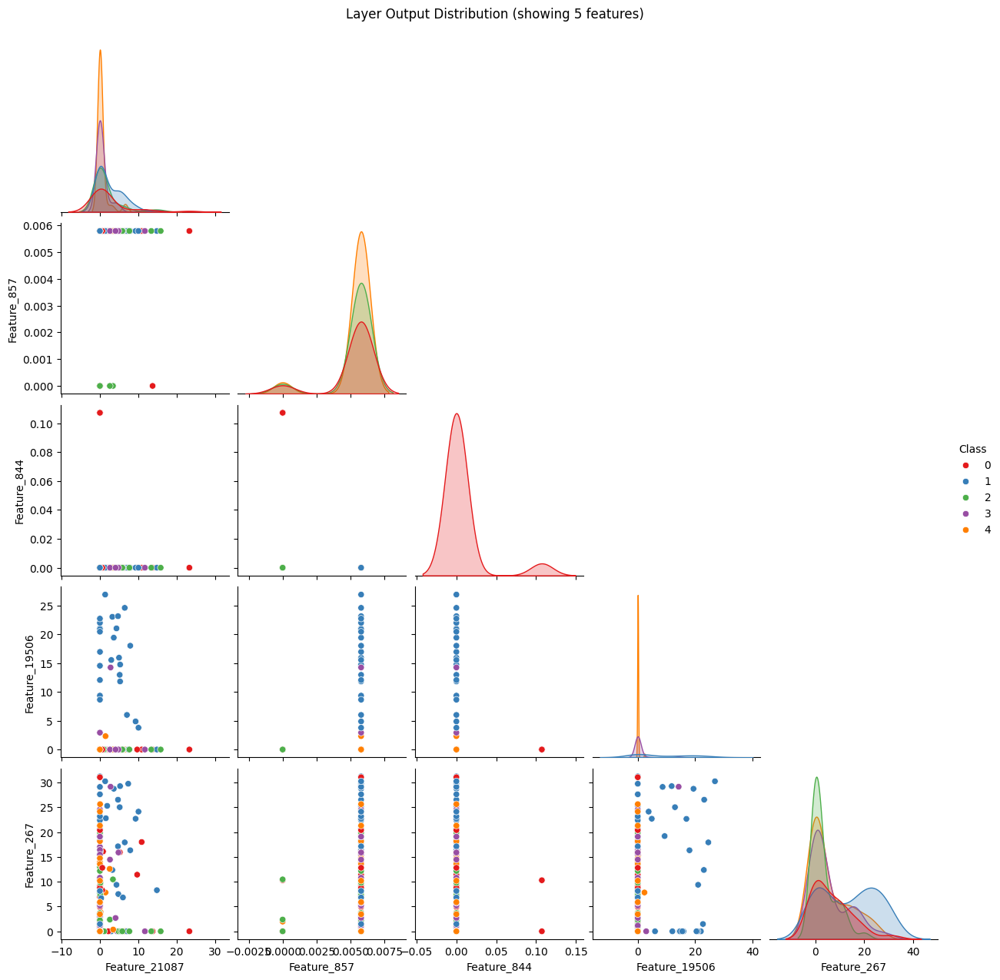

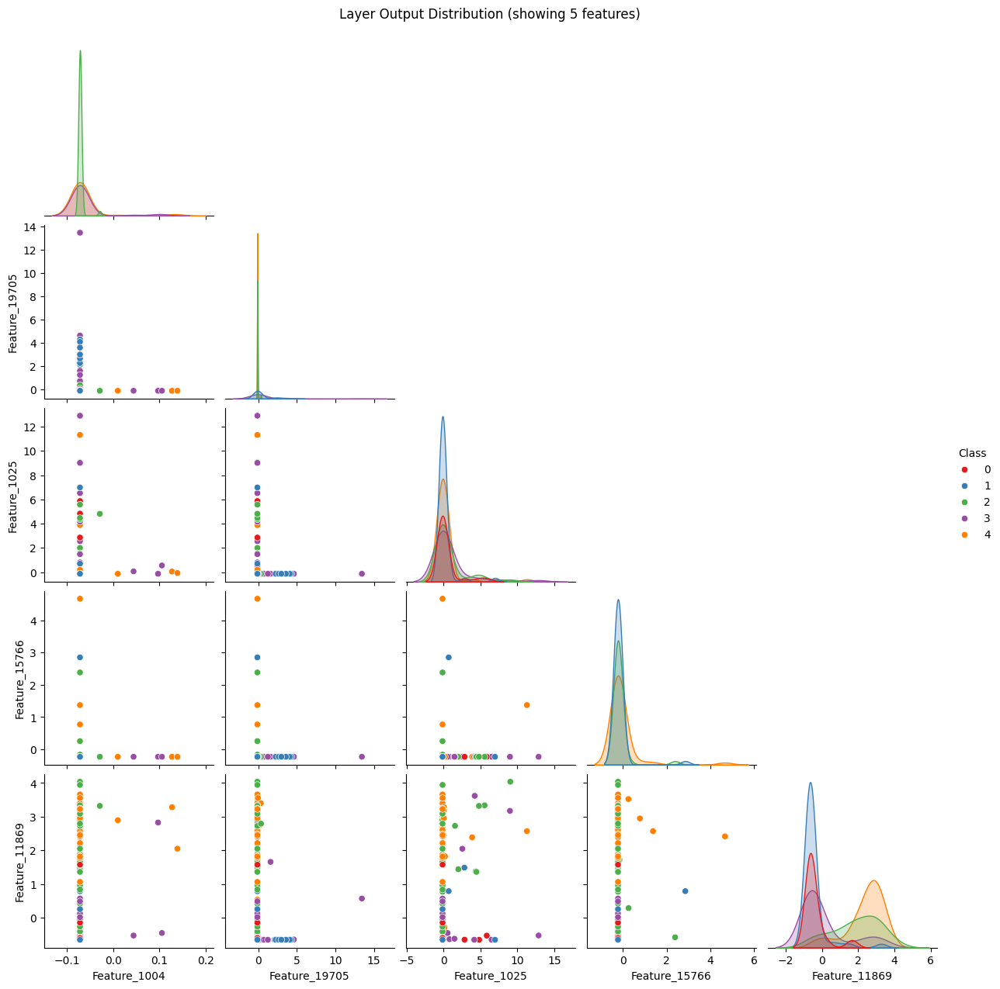

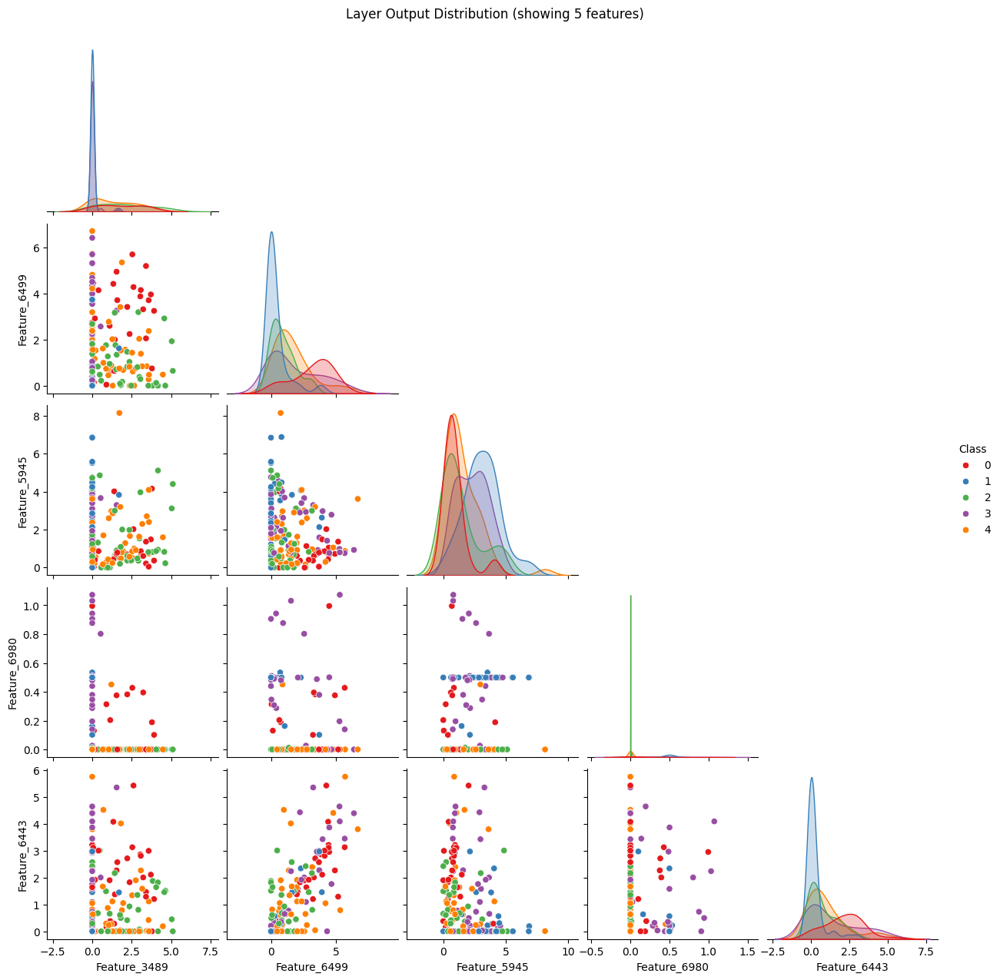

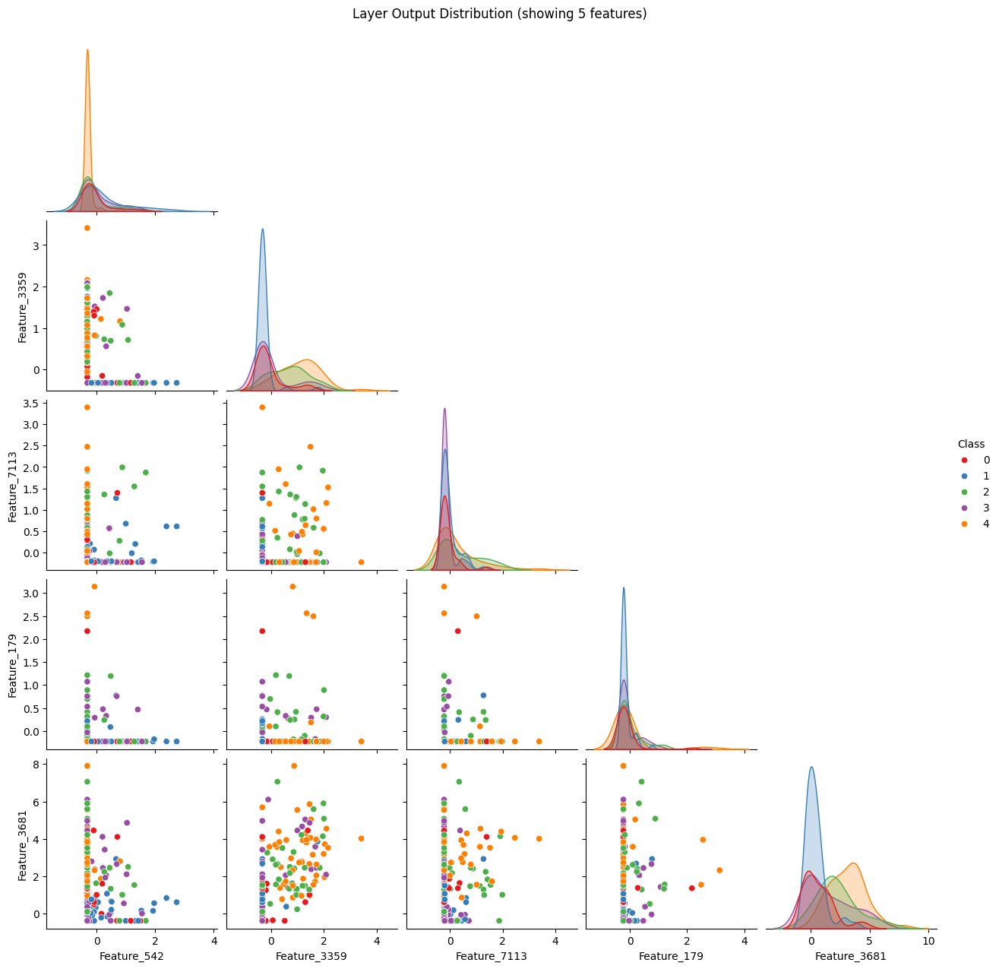

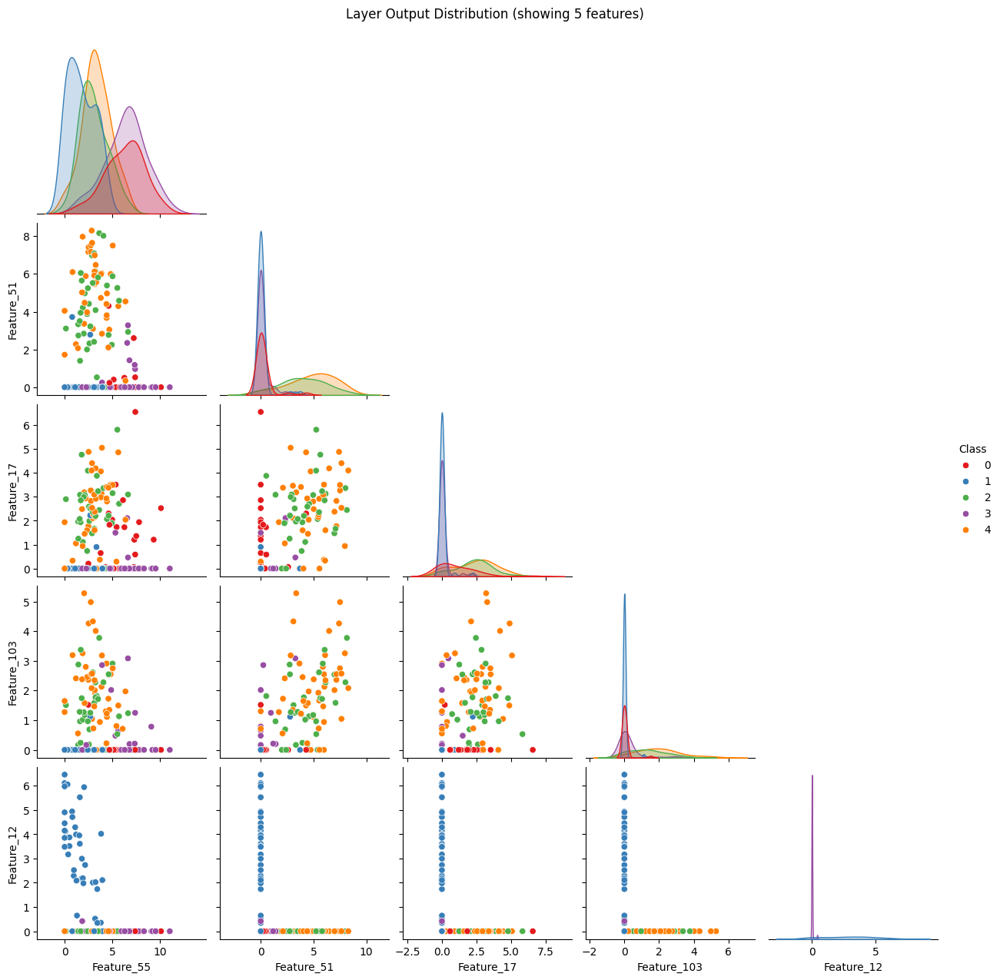

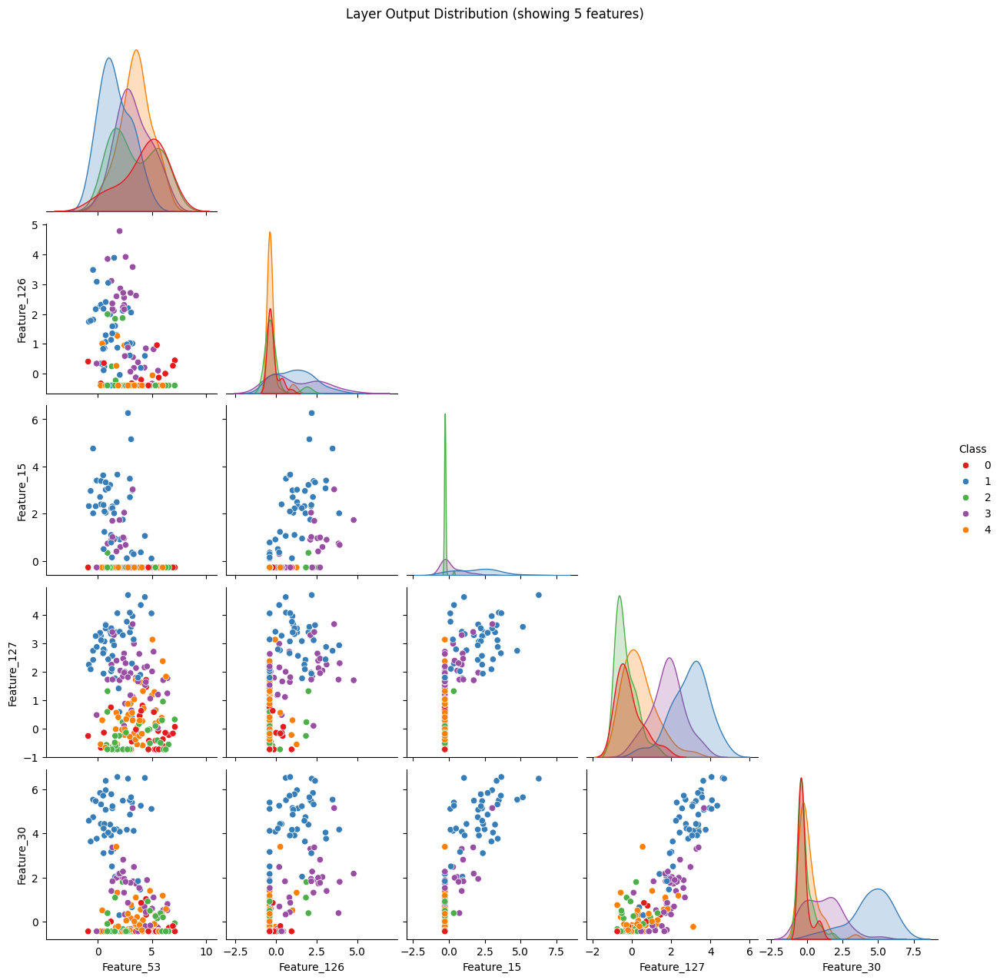

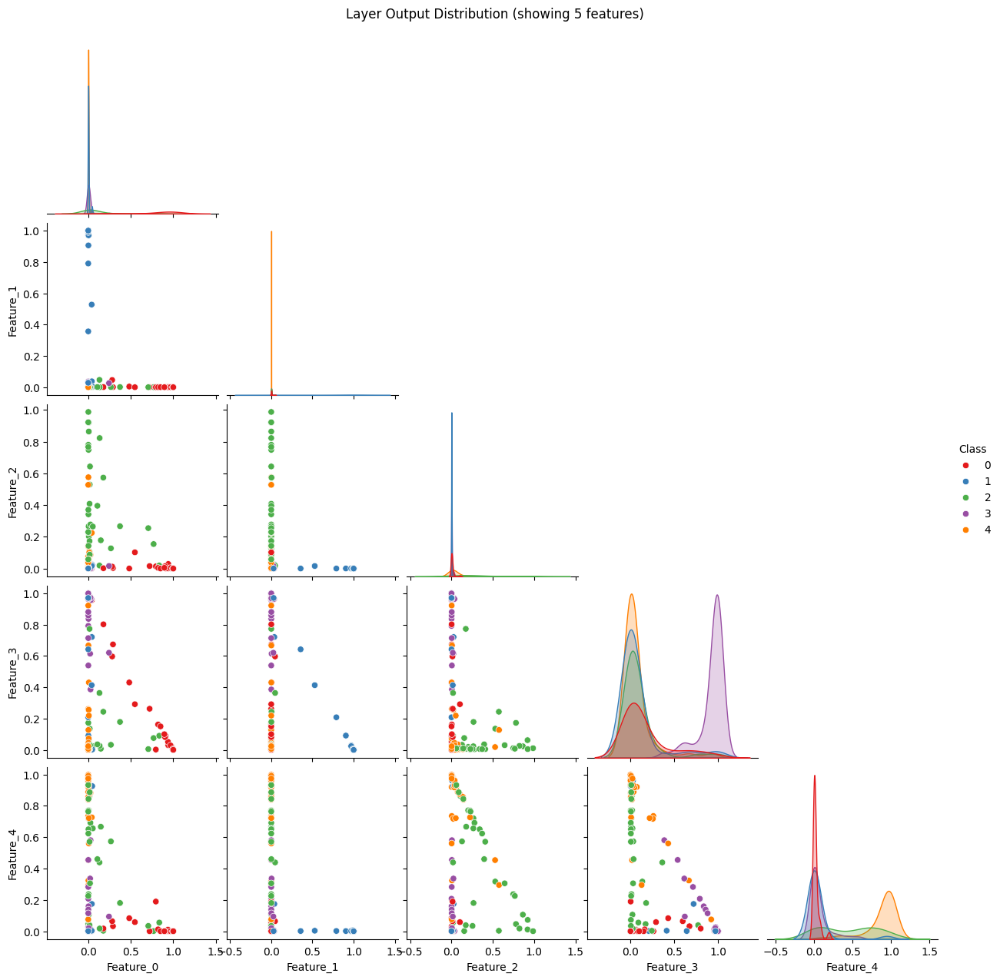

In [13]:
# YOUR CODE HERE. visualise, look at performance, train for some epoch(s), repeat
layer_outputs = extract_layers_outputs(model, x_viz)
for i ,(layer,layer_output) in enumerate(zip(model.layers, layer_outputs)):
  plot = visualize_layer_outputs(layer_output, y_viz)
  plot.savefig(f'layer_{i}.png')
  plt.show()

# visualize_layer_outputs()

# Observations with 2 Epochs

In [14]:
# Cell created for training the model
model.fit(x_train, y_train, epochs = 2, validation_data = (x_test, y_test))

Epoch 1/2
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - accuracy: 0.8373 - loss: 0.4359 - val_accuracy: 0.8600 - val_loss: 0.3620
Epoch 2/2
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.8783 - loss: 0.3384 - val_accuracy: 0.8880 - val_loss: 0.3426


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.8604 - loss: 0.4591
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
The model accuracy is: 0.8880000114440918


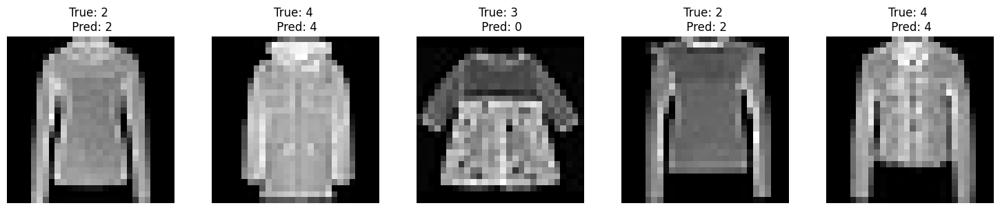

In [15]:
display_images_labels_preds(model, x_test, y_test, 5)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(32, 28, 28, 1))
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 28, 28, 1))
  warnings.warn(msg)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


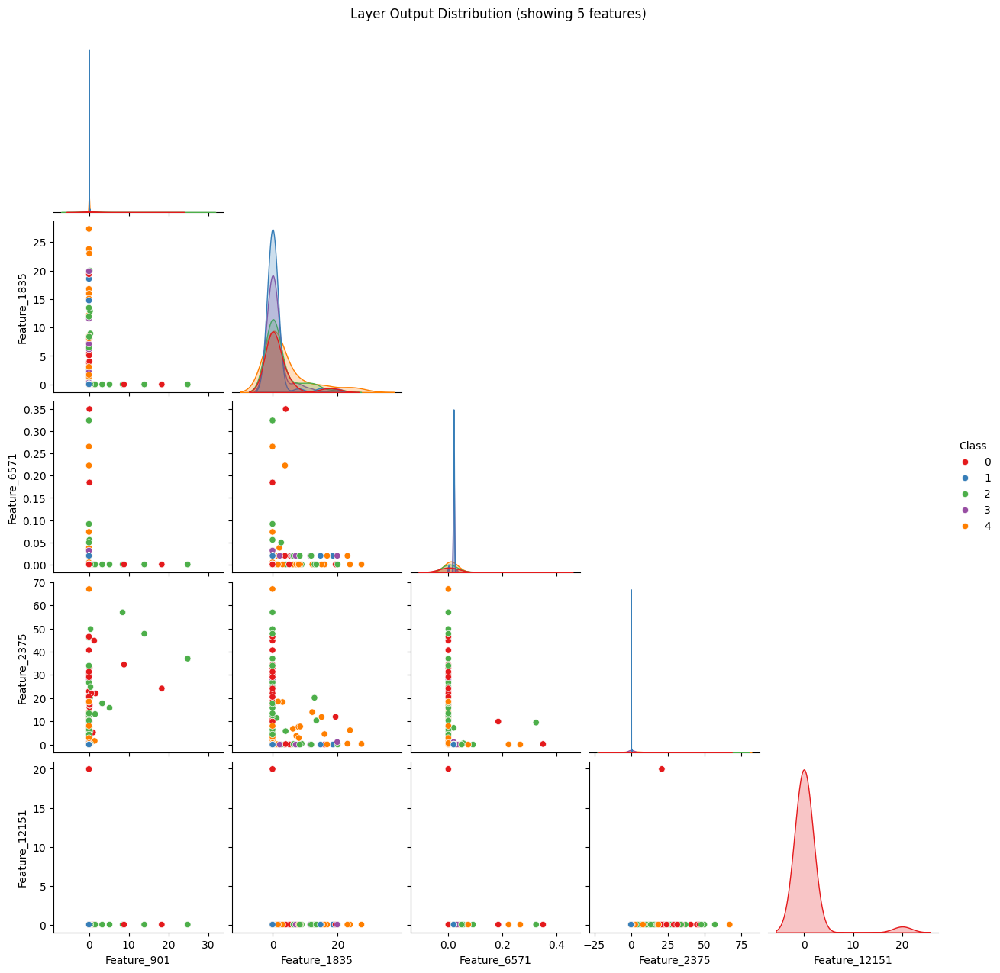

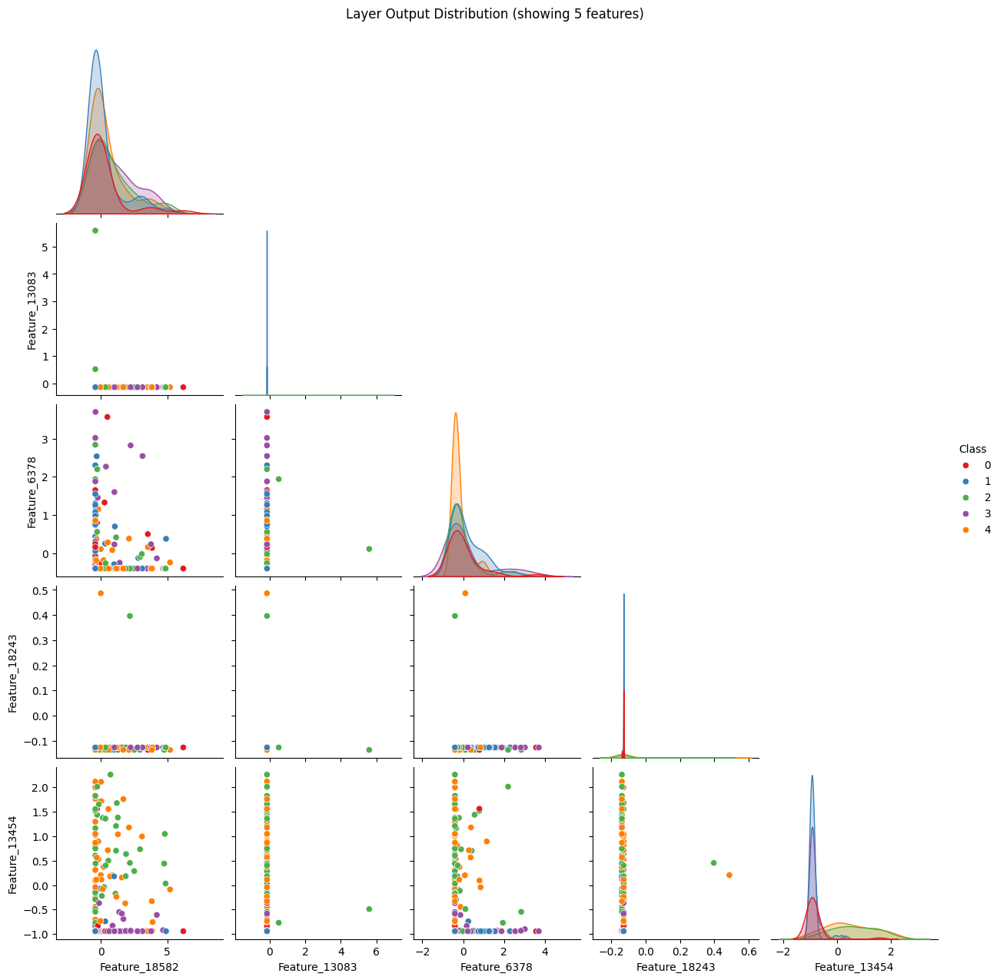

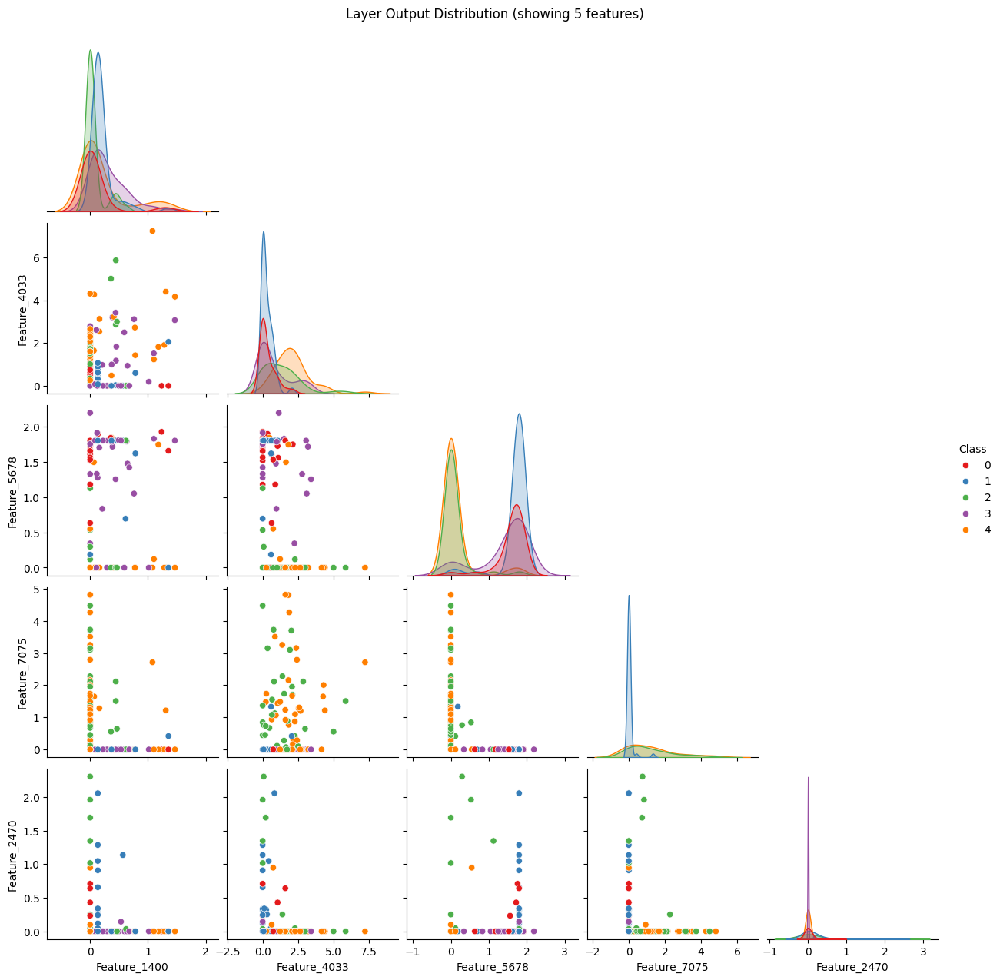

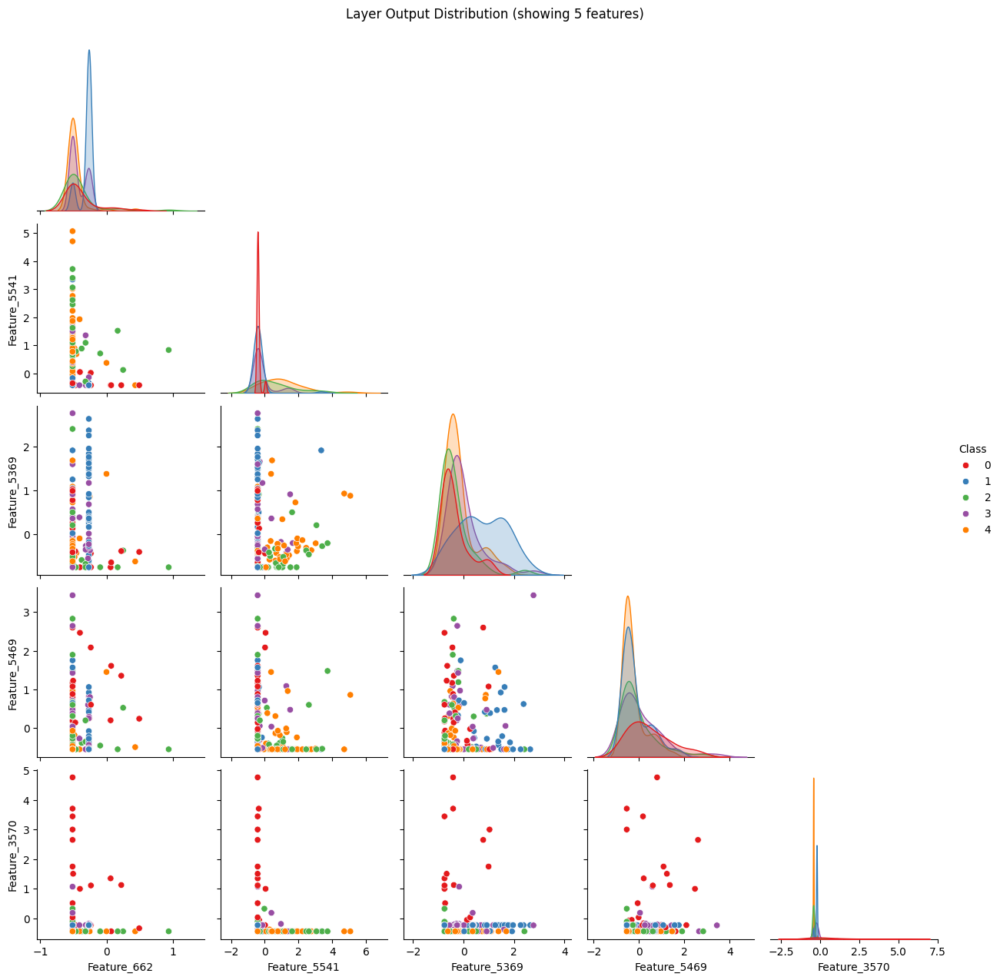

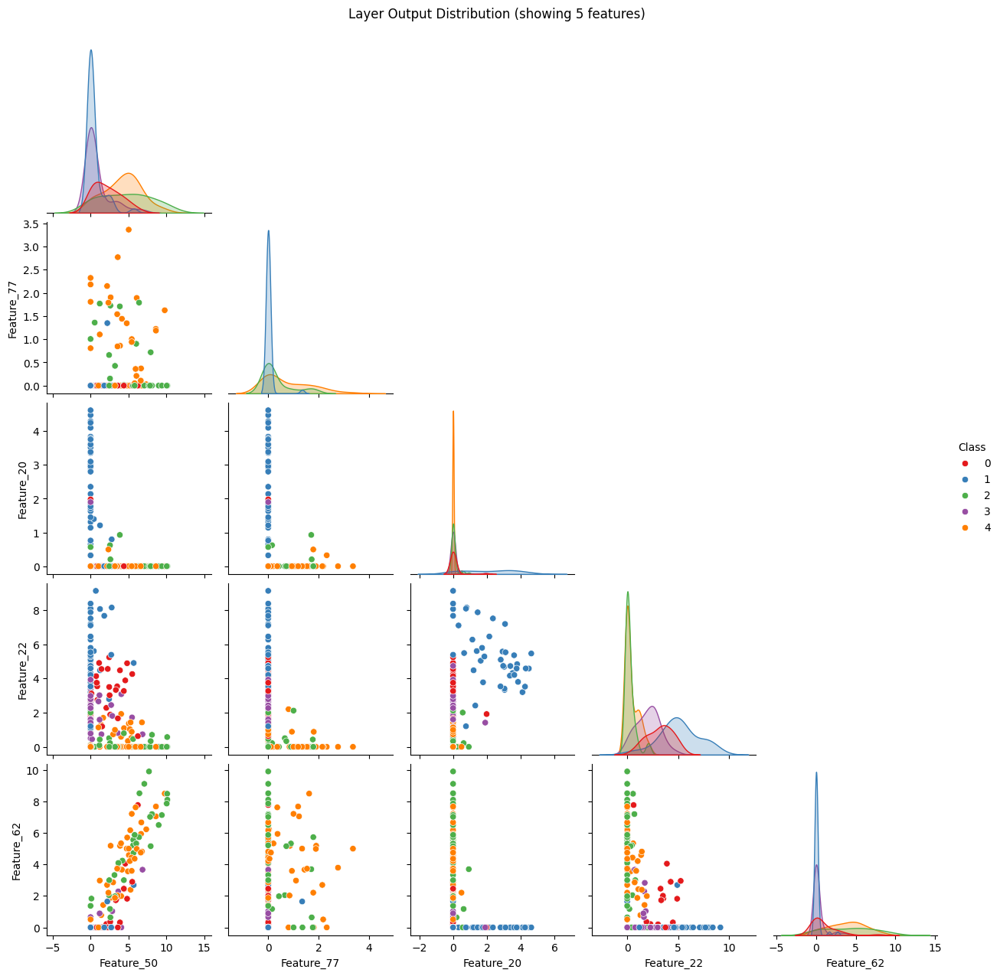

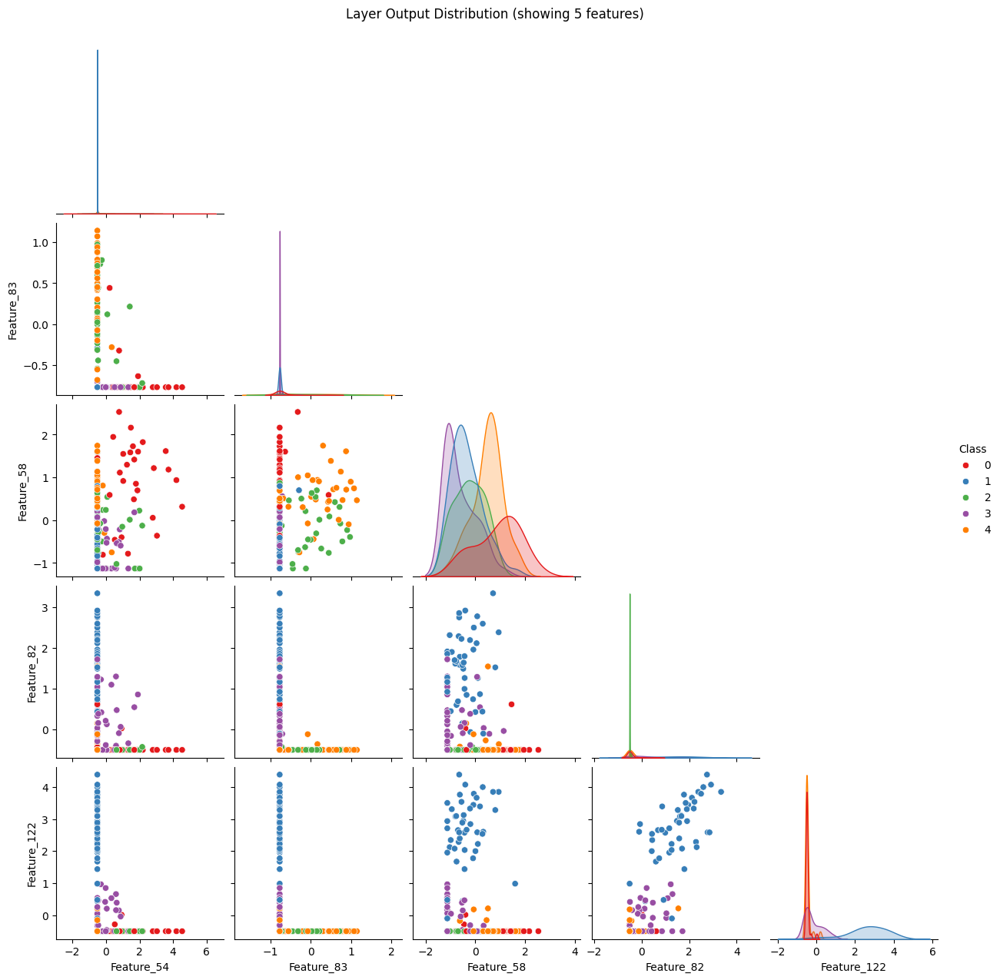

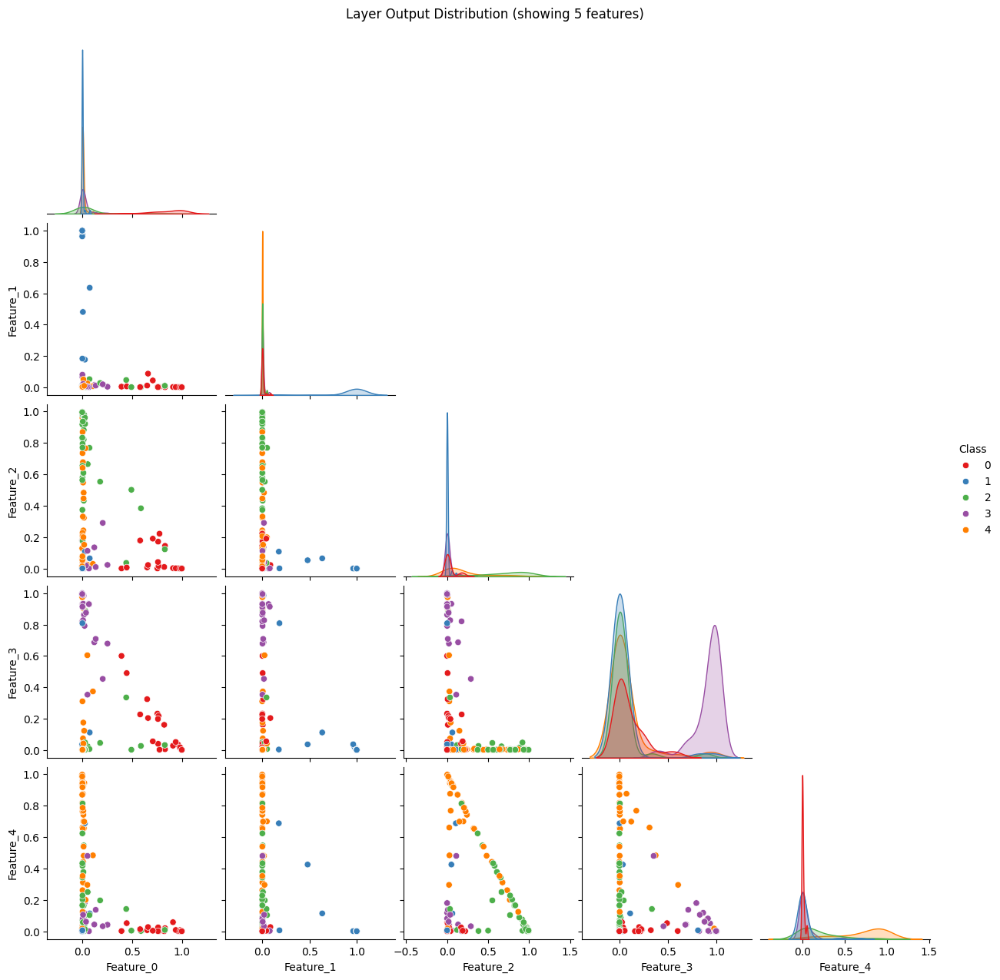

In [16]:
# YOUR CODE HERE. visualise, look at performance, train for some epoch(s), repeat
layer_outputs = extract_layers_outputs(model, x_viz)
for i ,(layer,layer_output) in enumerate(zip(model.layers, layer_outputs)):
  plot = visualize_layer_outputs(layer_output, y_viz)
  plot.savefig(f'layer_{i}.png')
  plt.show()

# visualize_layer_outputs()

# Observations with 3 Epochs

In [17]:
# Cell created for training the model
model.fit(x_train, y_train, epochs = 3, validation_data = (x_test, y_test))

Epoch 1/3
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.8874 - loss: 0.3038 - val_accuracy: 0.8960 - val_loss: 0.3526
Epoch 2/3
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.9060 - loss: 0.2494 - val_accuracy: 0.9080 - val_loss: 0.3150
Epoch 3/3
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.9165 - loss: 0.2408 - val_accuracy: 0.8760 - val_loss: 0.3167


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8340 - loss: 0.4338
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
The model accuracy is: 0.8759999871253967


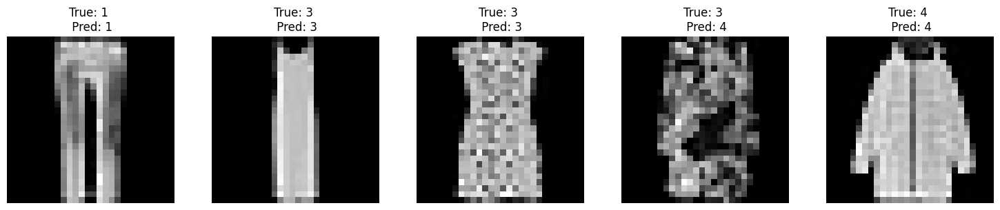

In [18]:
display_images_labels_preds(model, x_test, y_test, 5)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(32, 28, 28, 1))
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 28, 28, 1))
  warnings.warn(msg)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


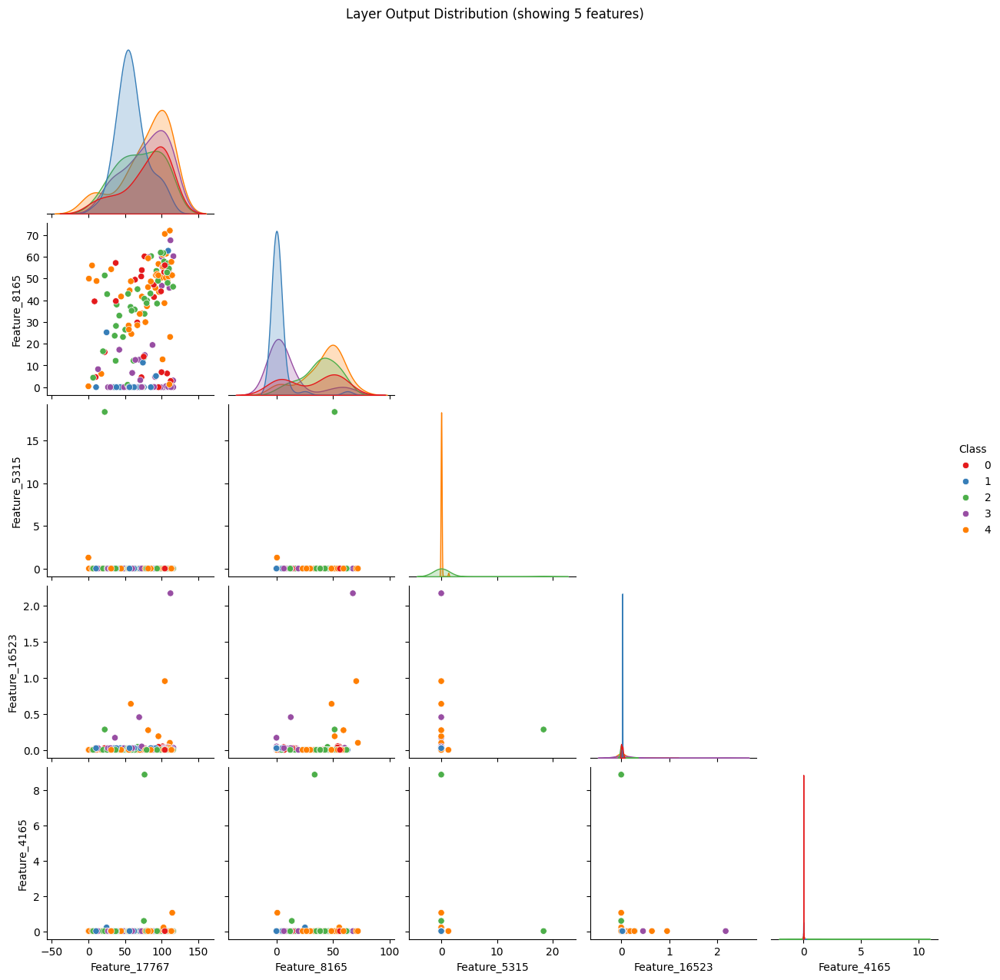

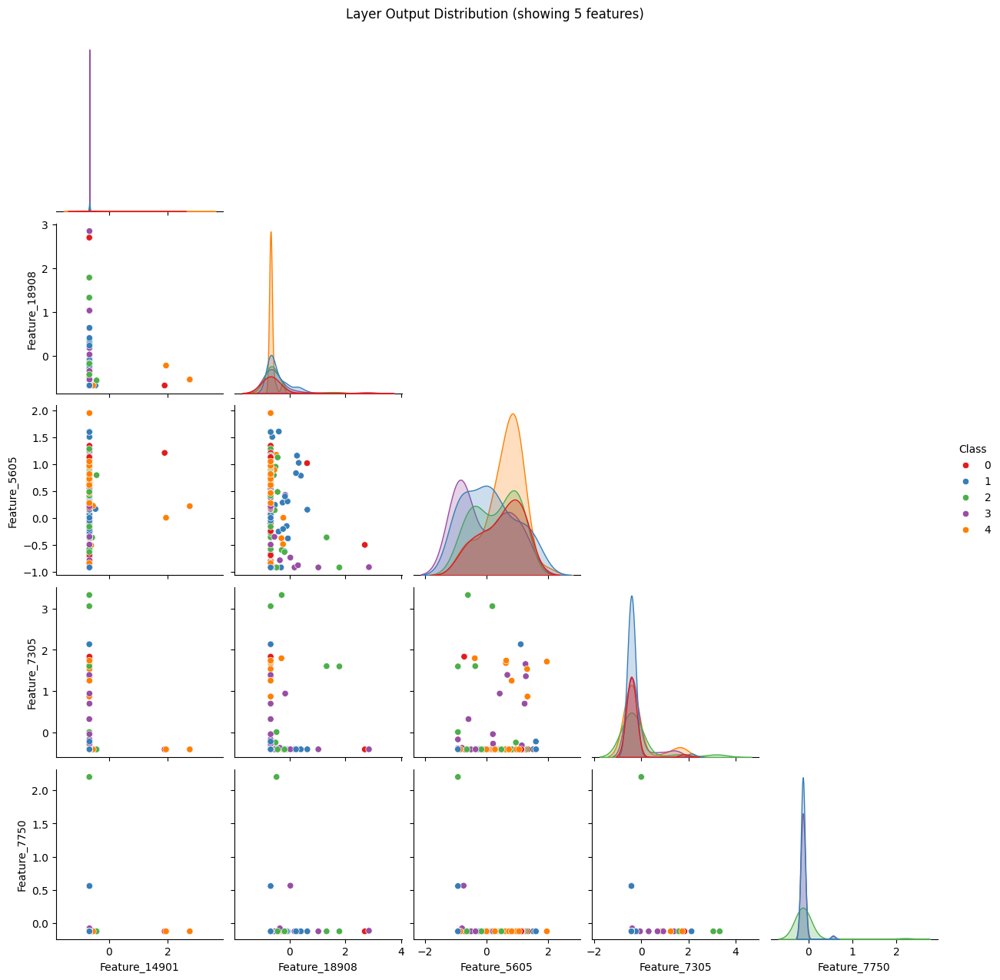

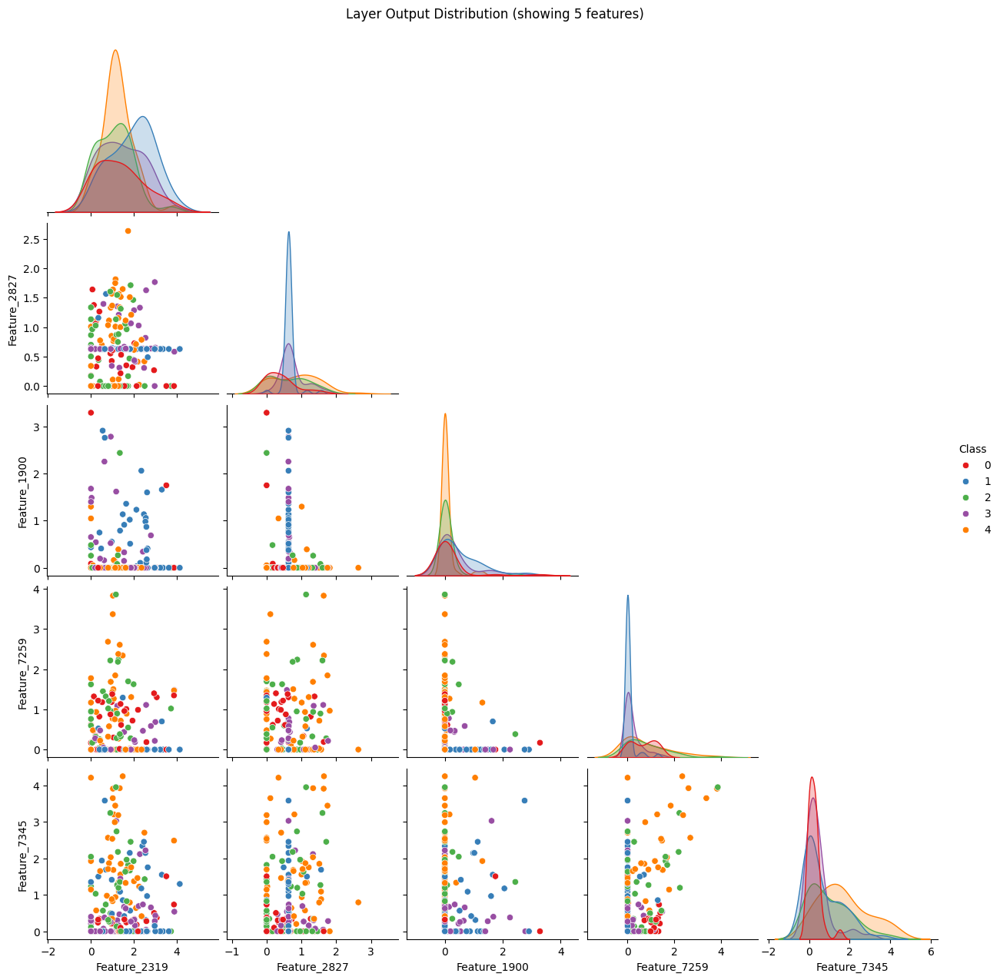

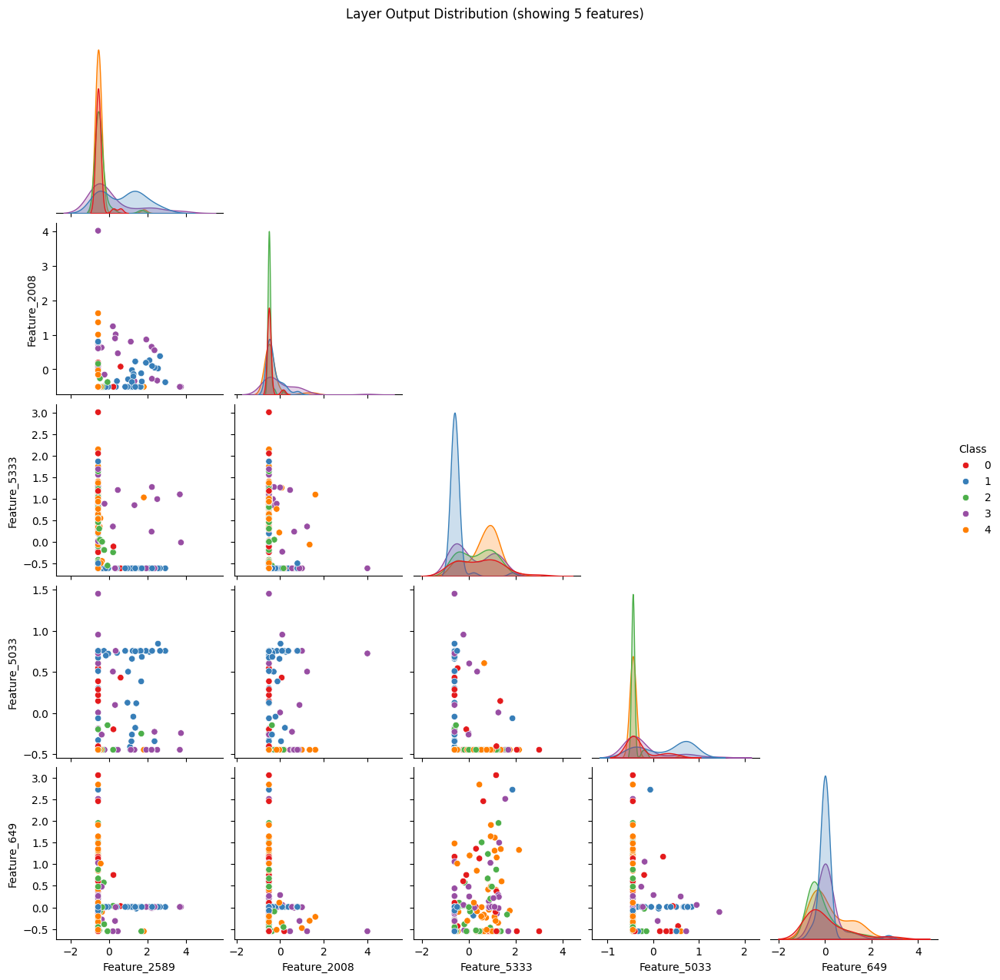

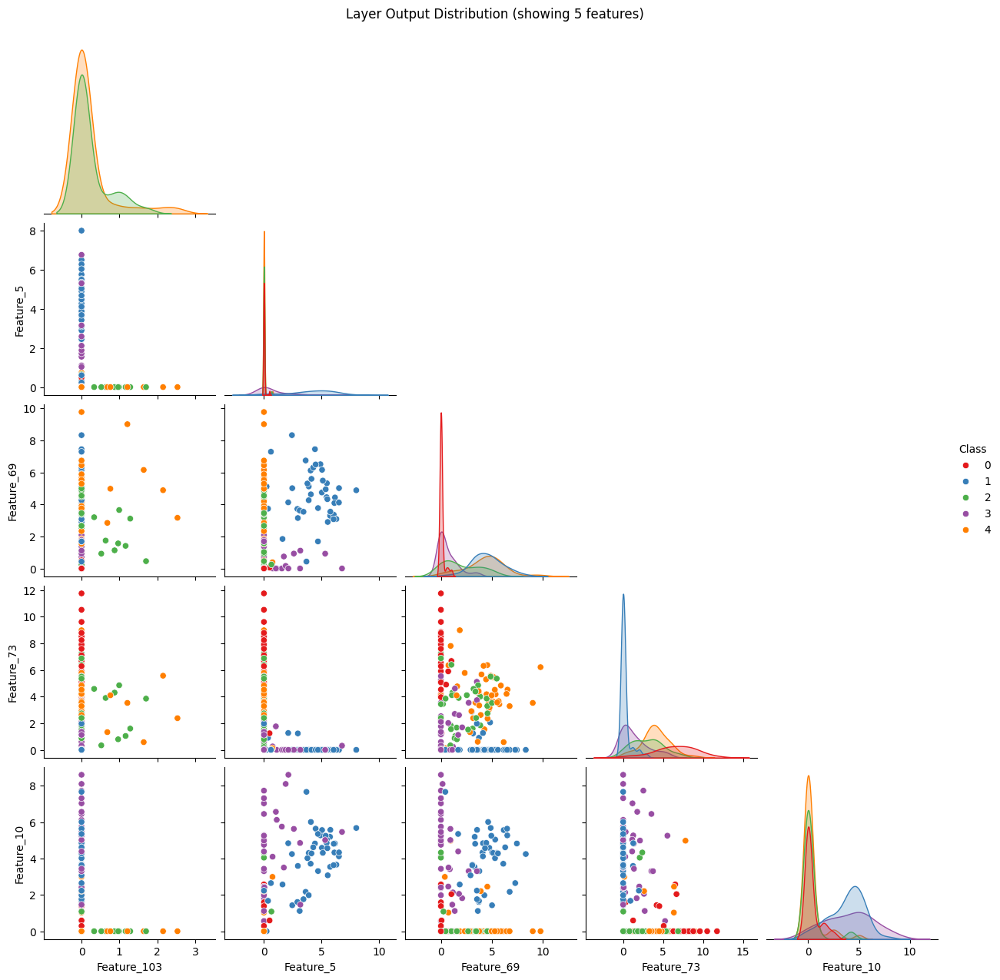

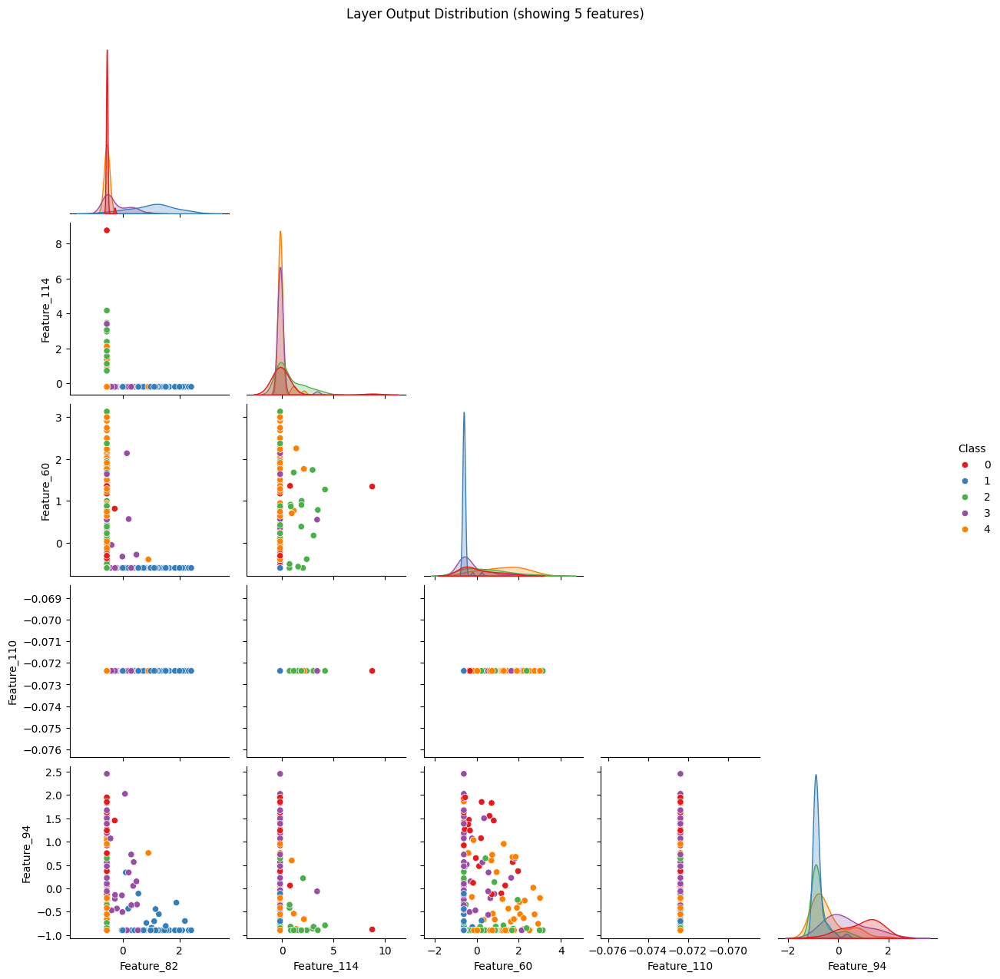

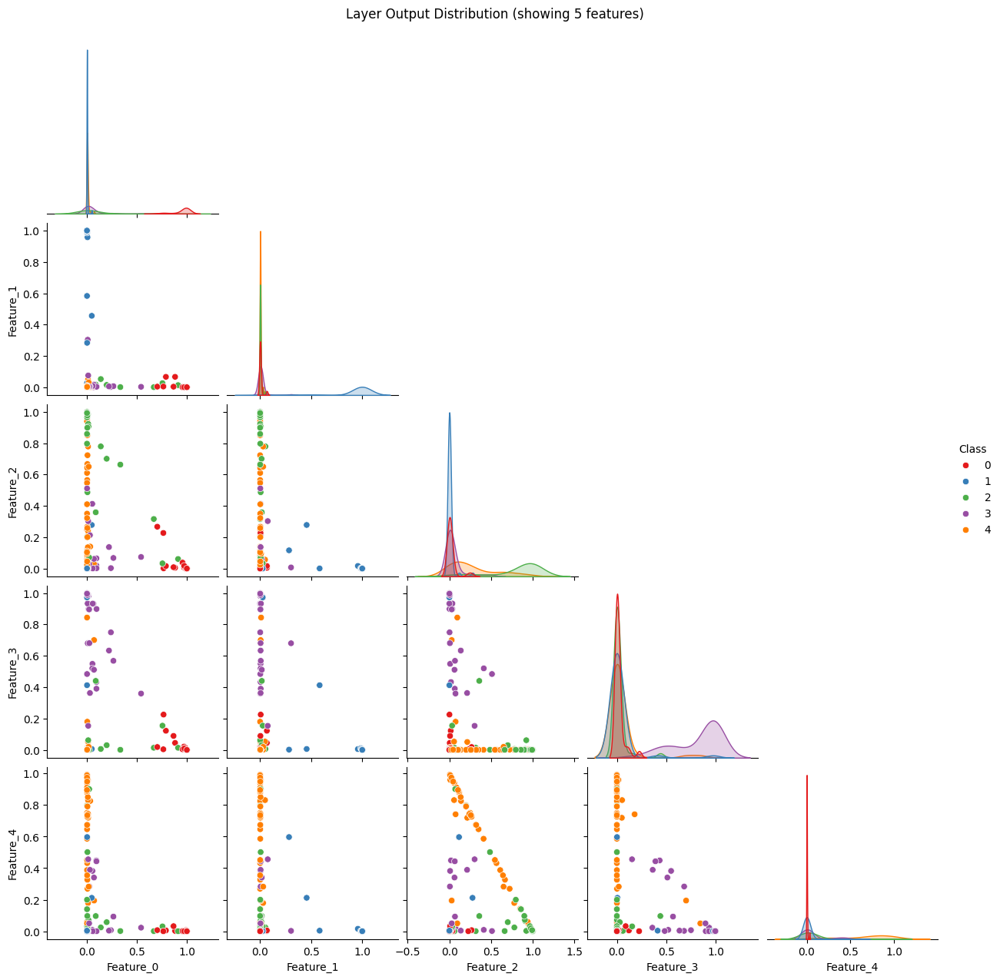

In [19]:
# YOUR CODE HERE. visualise, look at performance, train for some epoch(s), repeat
layer_outputs = extract_layers_outputs(model, x_viz)
for i ,(layer,layer_output) in enumerate(zip(model.layers, layer_outputs)):
  plot = visualize_layer_outputs(layer_output, y_viz)
  plot.savefig(f'layer_{i}.png')
  plt.show()

# visualize_layer_outputs()

# Observations with 4 Epochs

In [20]:
# Cell created for training the model
model.fit(x_train, y_train, epochs = 4, validation_data = (x_test, y_test))

Epoch 1/4
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.9201 - loss: 0.2215 - val_accuracy: 0.8740 - val_loss: 0.3289
Epoch 2/4
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.9118 - loss: 0.2258 - val_accuracy: 0.9020 - val_loss: 0.3294
Epoch 3/4
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.9280 - loss: 0.1824 - val_accuracy: 0.8540 - val_loss: 0.3770
Epoch 4/4
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.9345 - loss: 0.1854 - val_accuracy: 0.9040 - val_loss: 0.3009


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8729 - loss: 0.4346
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
The model accuracy is: 0.9039999842643738


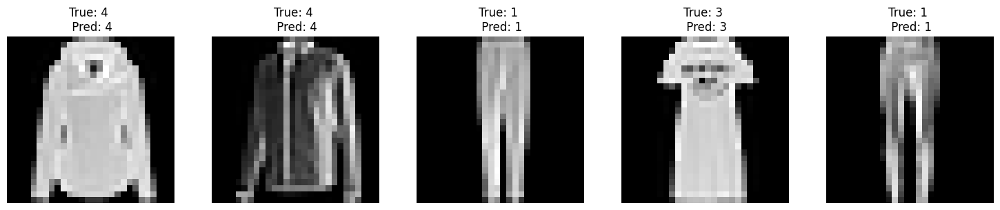

In [21]:
display_images_labels_preds(model, x_test, y_test, 5)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(32, 28, 28, 1))
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 28, 28, 1))
  warnings.warn(msg)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


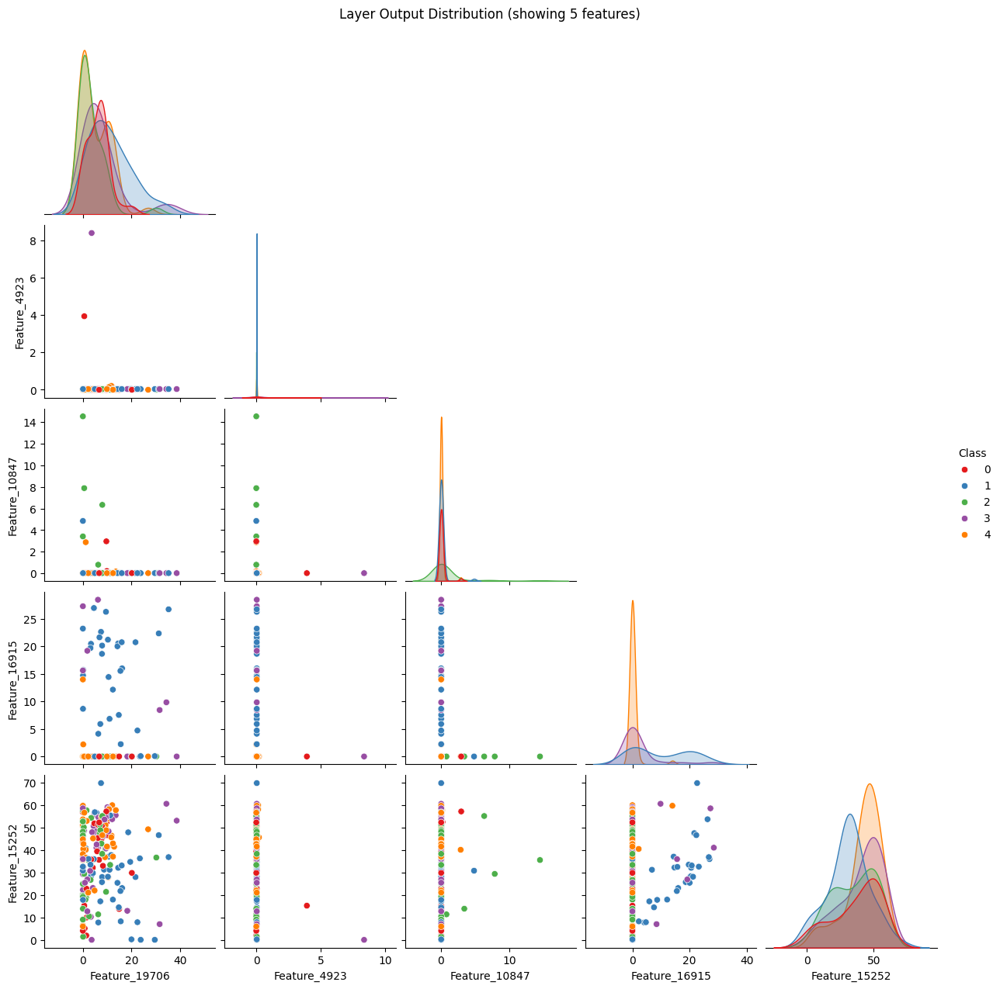

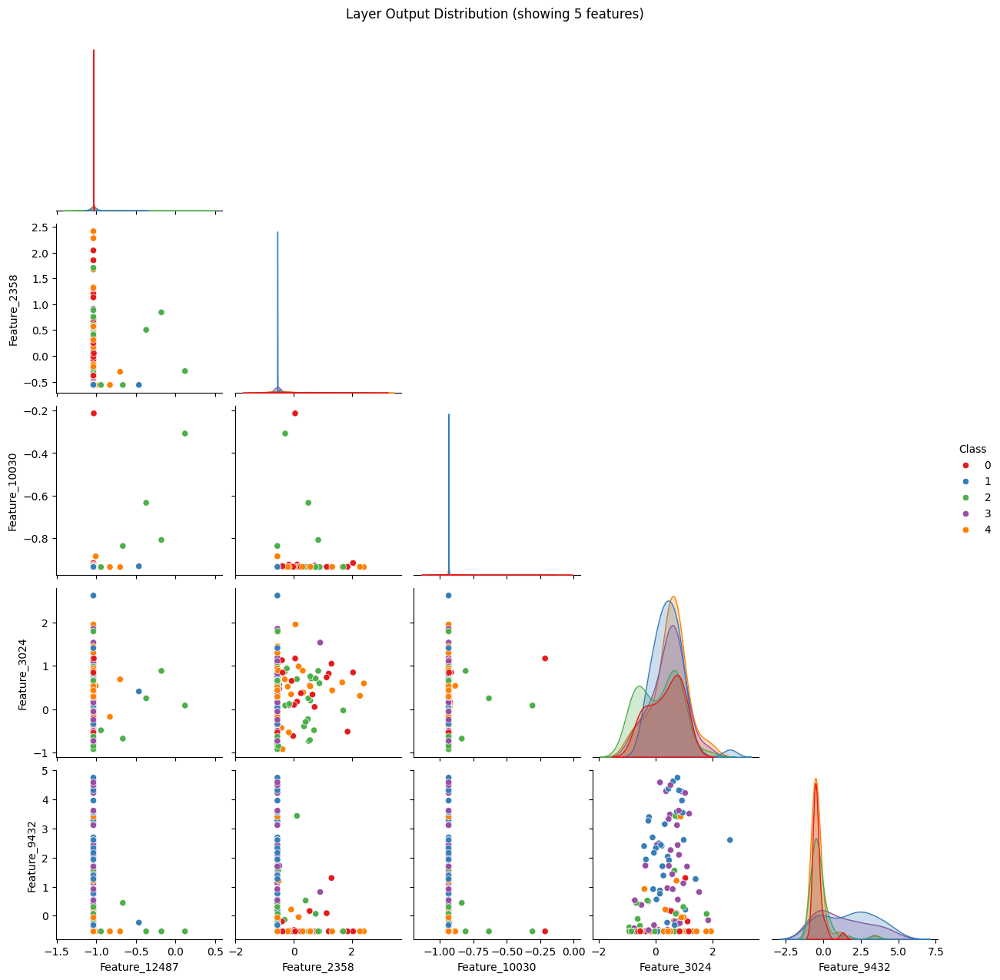

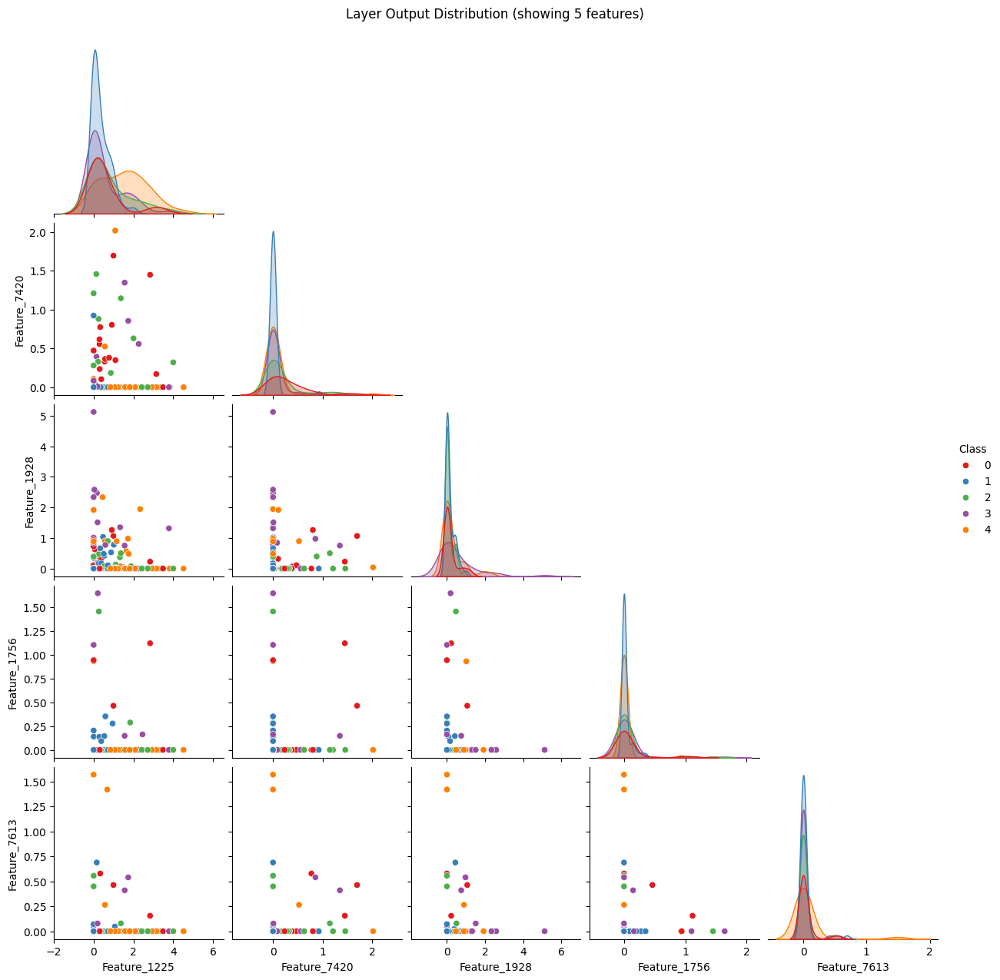

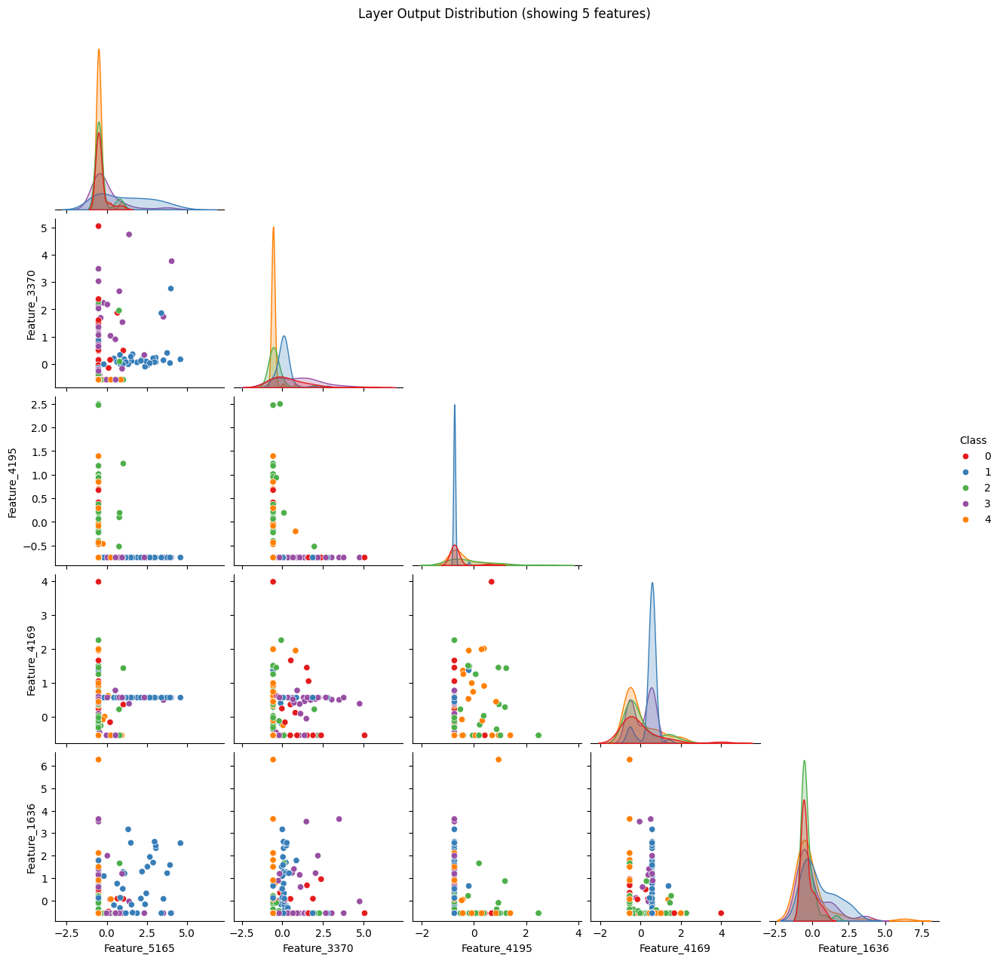

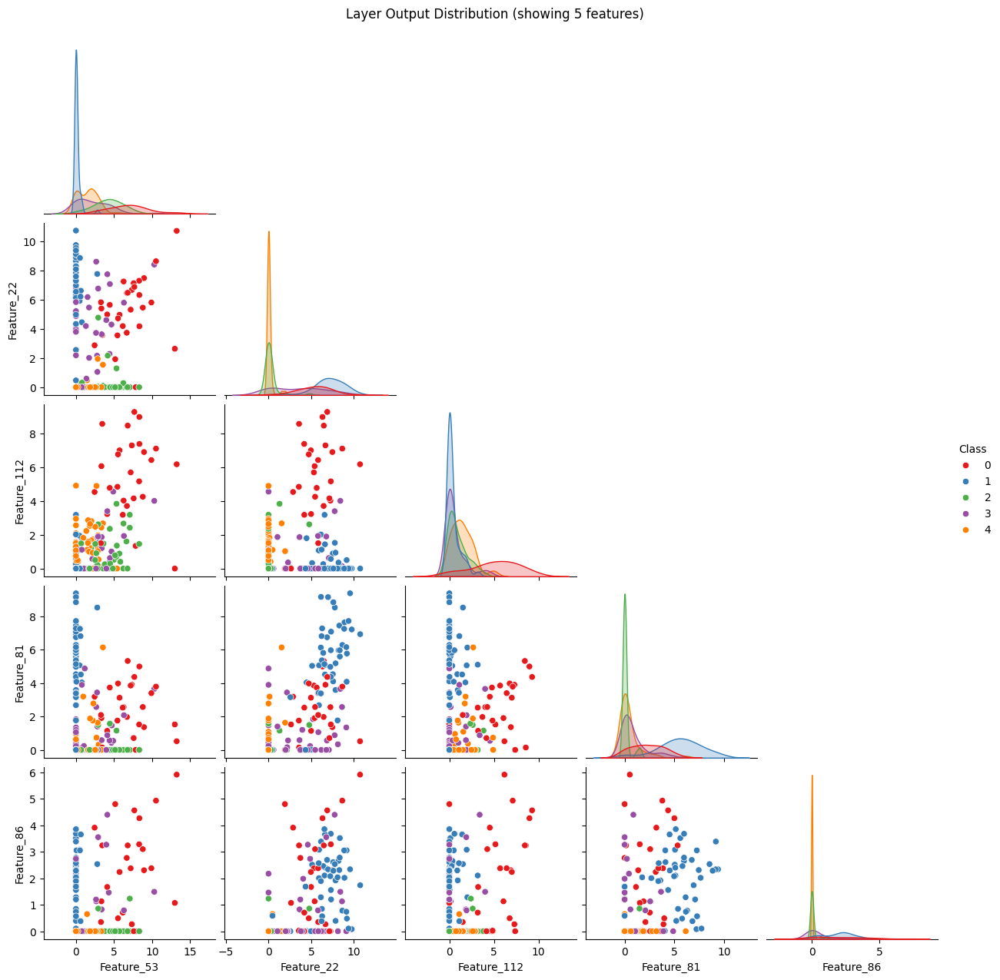

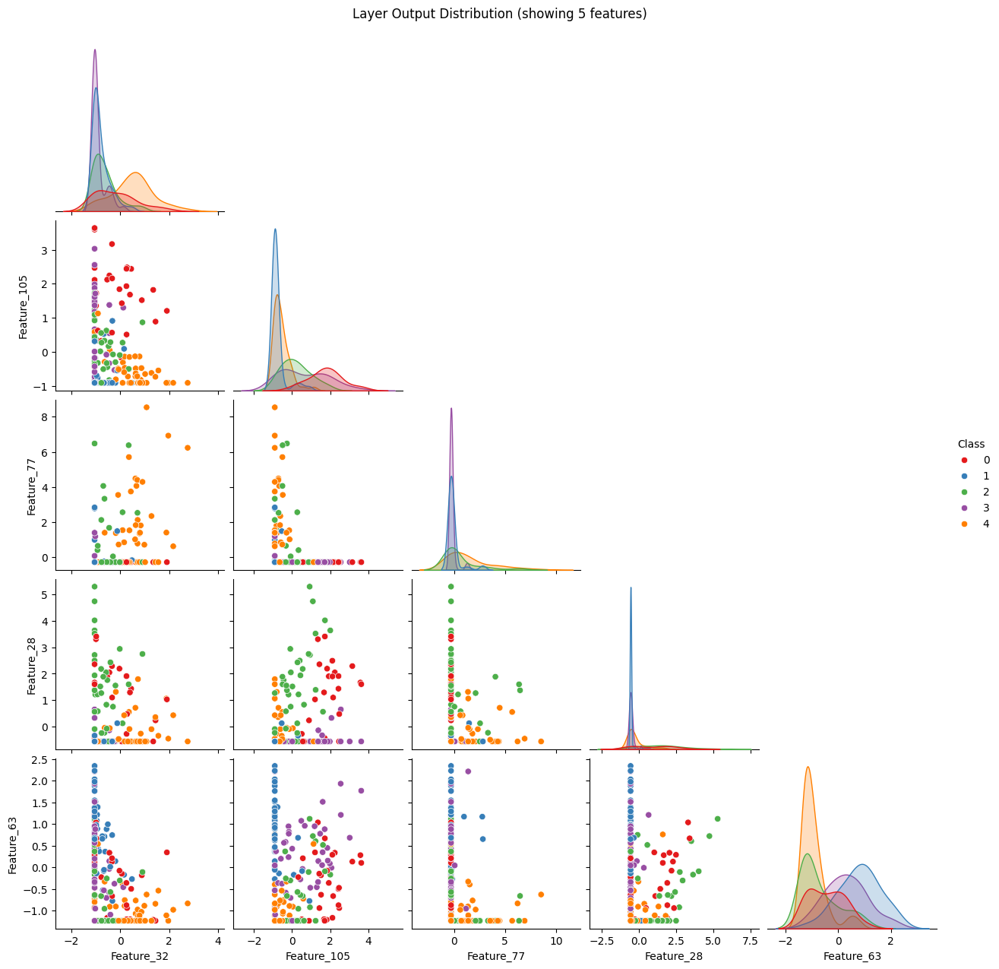

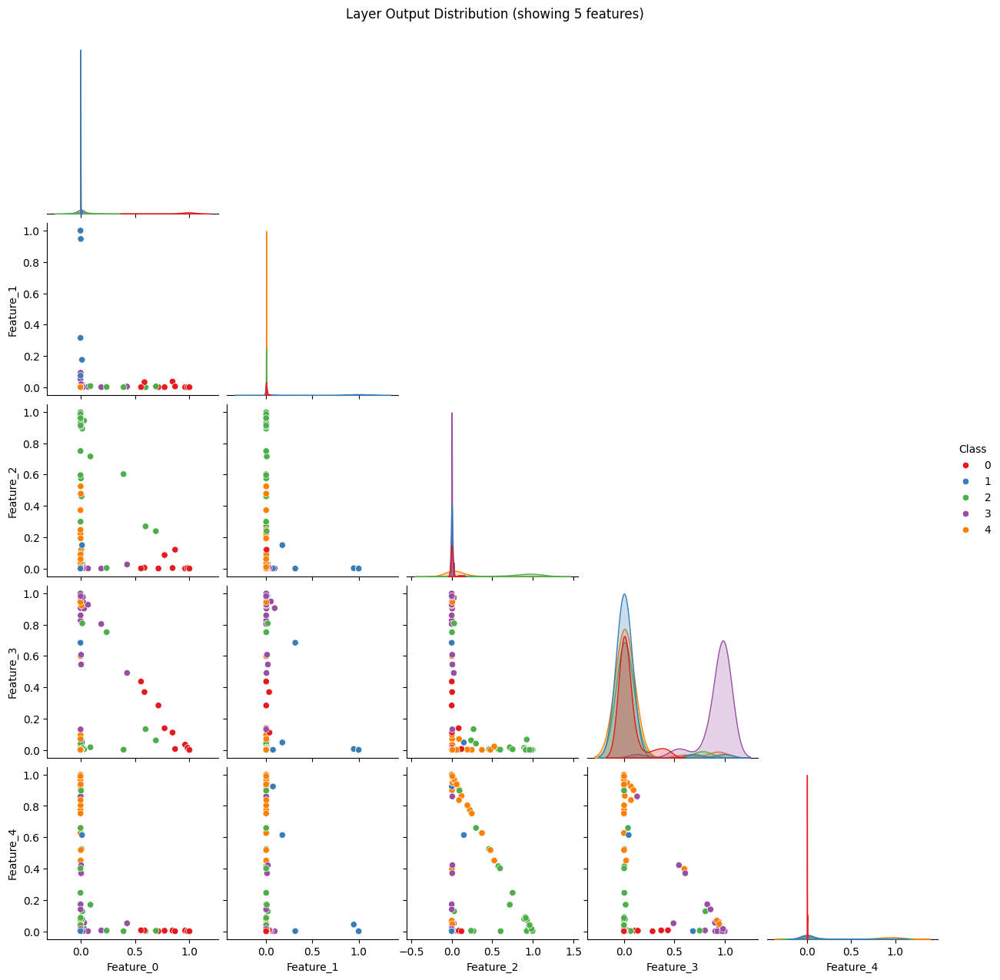

In [22]:
# YOUR CODE HERE. visualise, look at performance, train for some epoch(s), repeat
layer_outputs = extract_layers_outputs(model, x_viz)
for i ,(layer,layer_output) in enumerate(zip(model.layers, layer_outputs)):
  plot = visualize_layer_outputs(layer_output, y_viz)
  plot.savefig(f'layer_{i}.png')
  plt.show()

# visualize_layer_outputs()

# Observation with 5 Epochs

In [23]:
# Cell created for training the model
model.fit(x_train, y_train, epochs = 5, validation_data = (x_test, y_test))

Epoch 1/5
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.9399 - loss: 0.1632 - val_accuracy: 0.8760 - val_loss: 0.3880
Epoch 2/5
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.9508 - loss: 0.1392 - val_accuracy: 0.8920 - val_loss: 0.3361
Epoch 3/5
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.9538 - loss: 0.1202 - val_accuracy: 0.9040 - val_loss: 0.3099
Epoch 4/5
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - accuracy: 0.9324 - loss: 0.1716 - val_accuracy: 0.8640 - val_loss: 0.3799
Epoch 5/5
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.9478 - loss: 0.1205 - val_accuracy: 0.8920 - val_loss: 0.3497


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8616 - loss: 0.4722
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
The model accuracy is: 0.8920000195503235


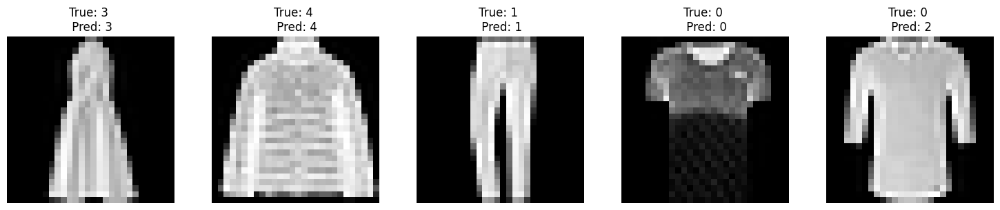

In [24]:
display_images_labels_preds(model, x_test, y_test, 5)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(32, 28, 28, 1))
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 28, 28, 1))
  warnings.warn(msg)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


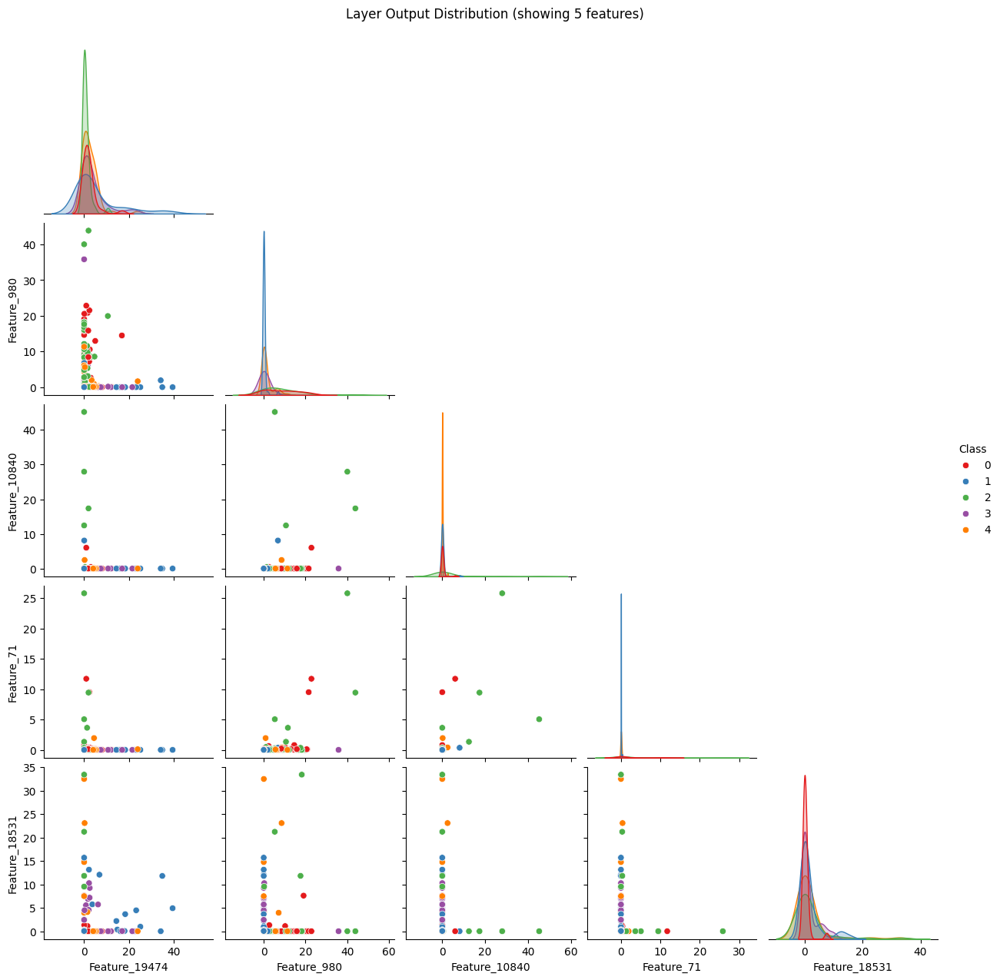

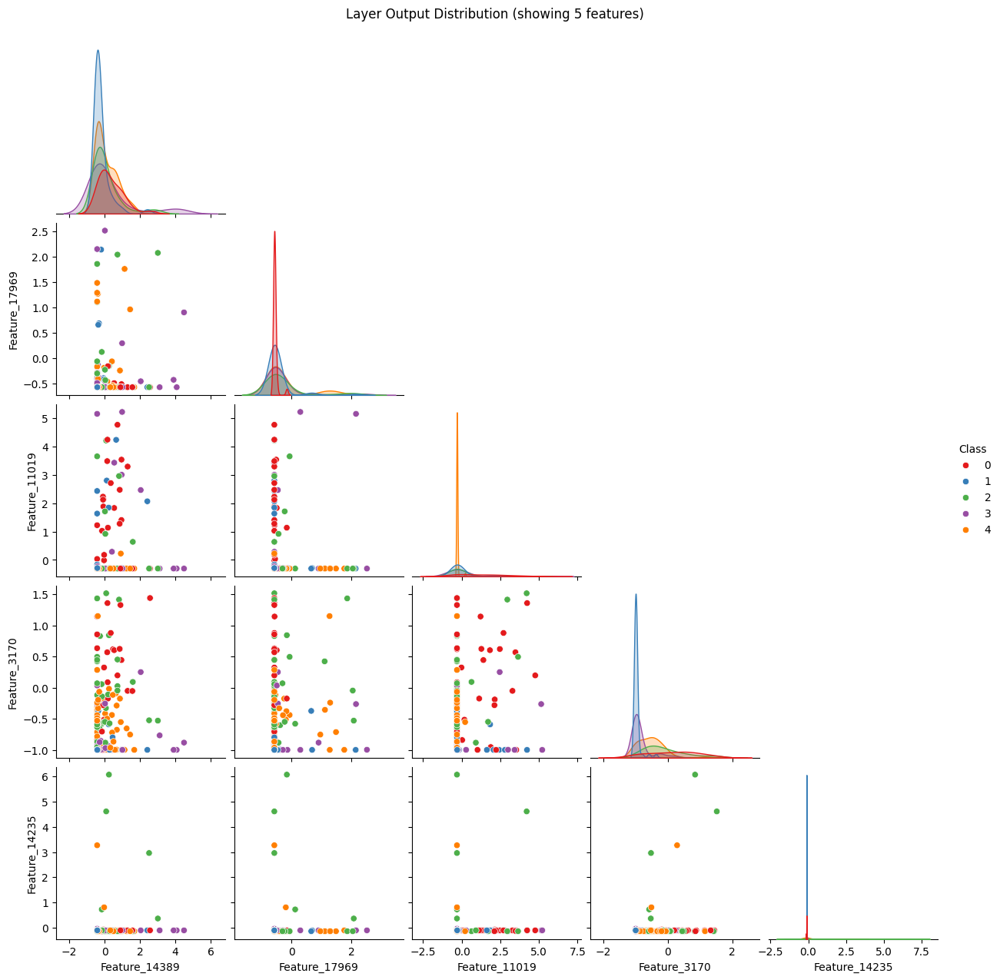

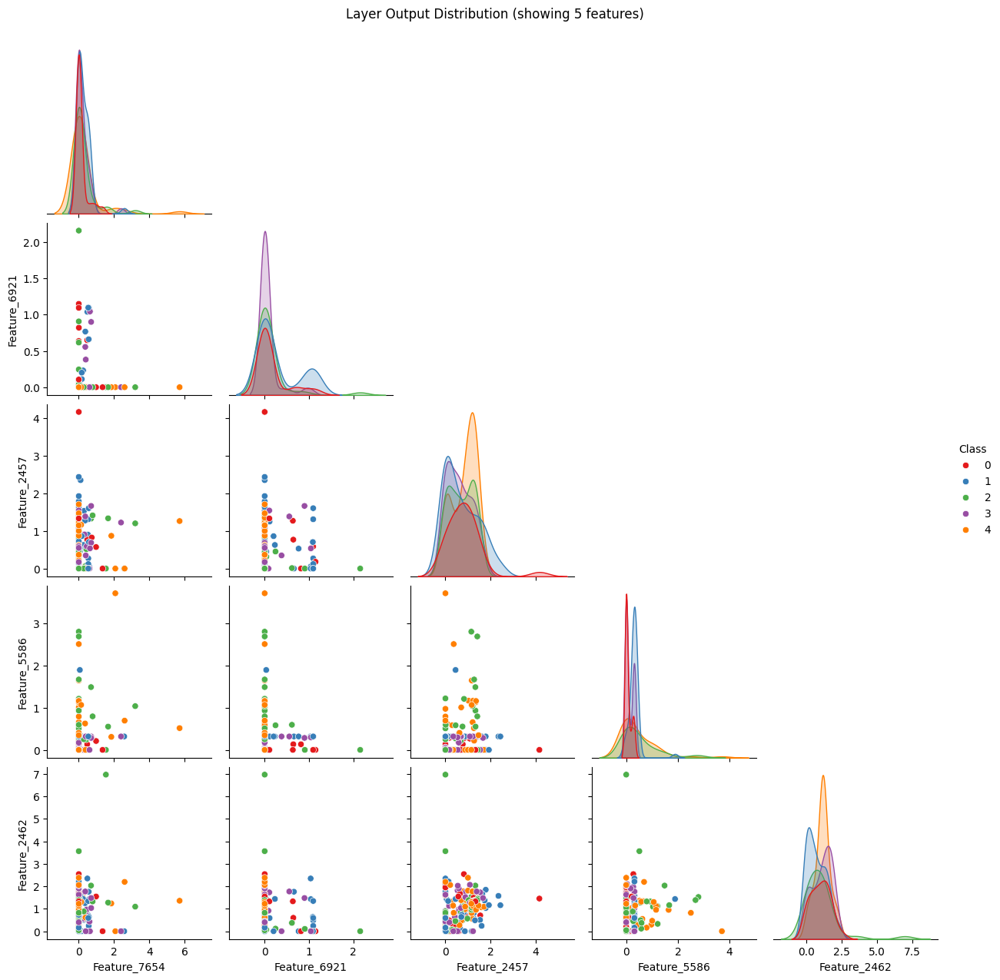

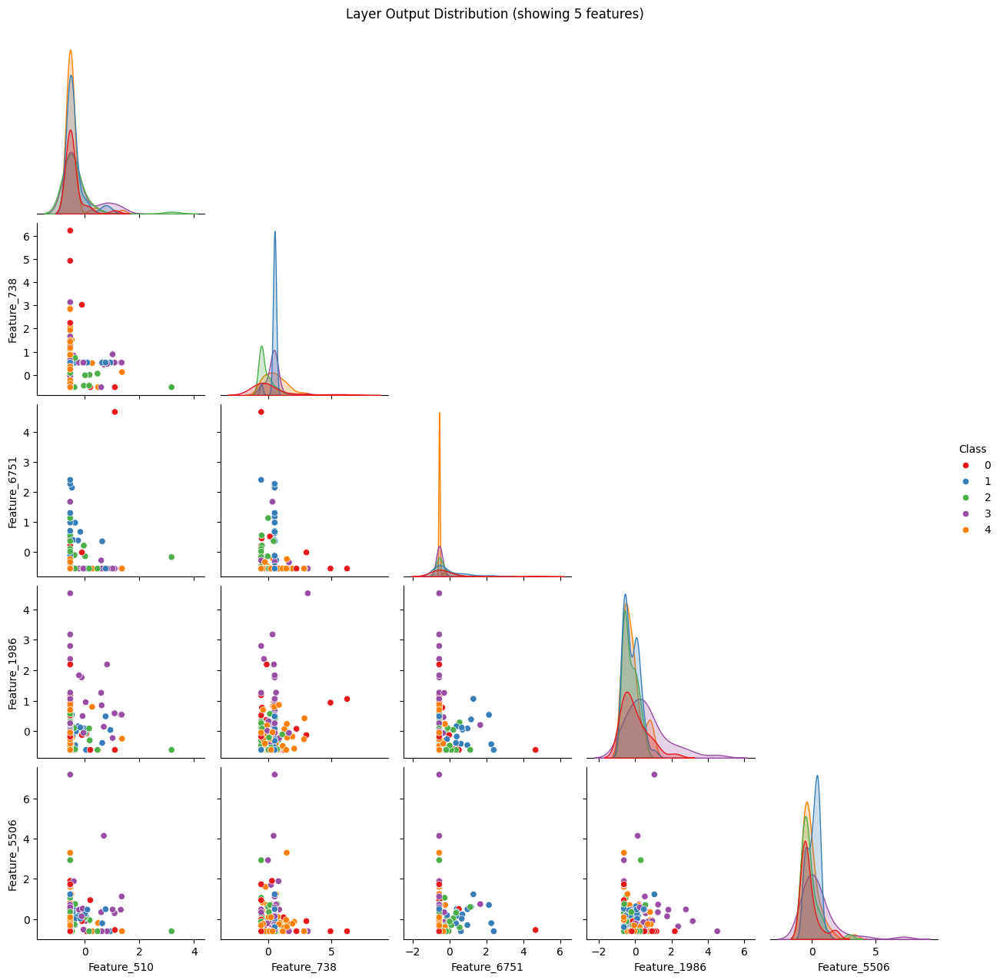

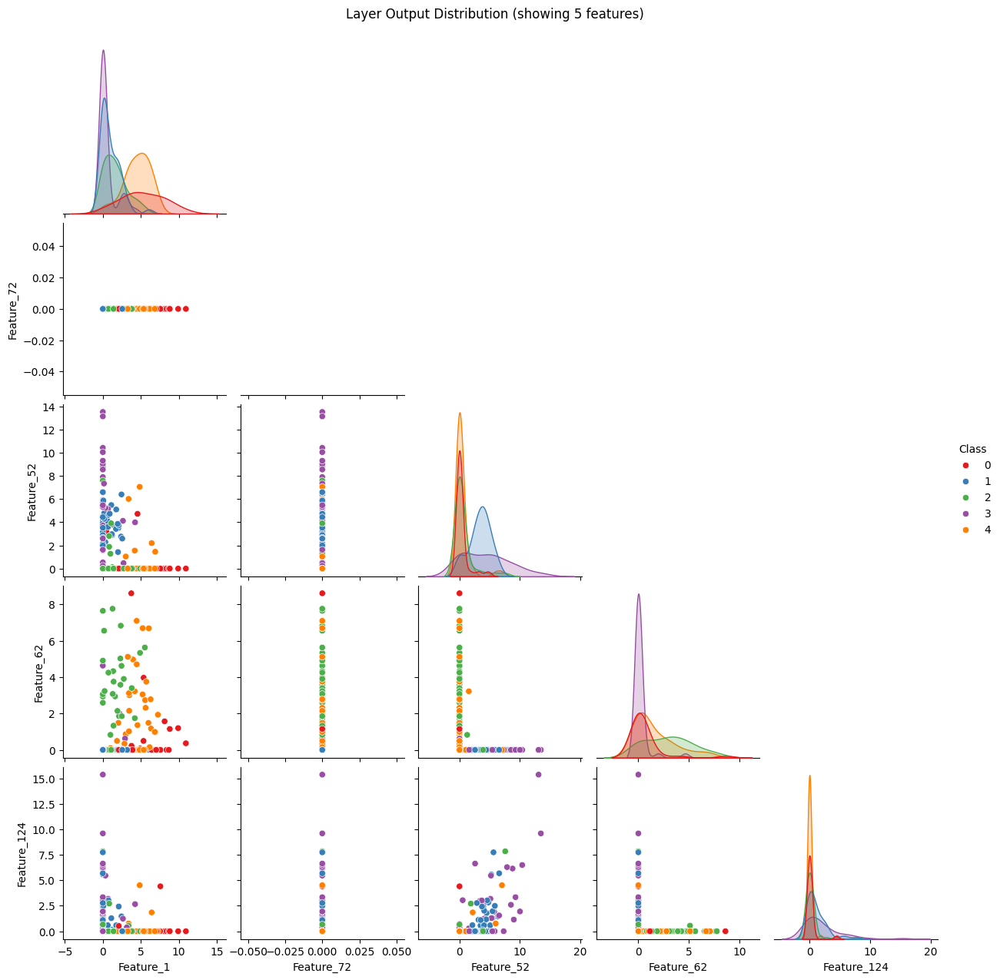

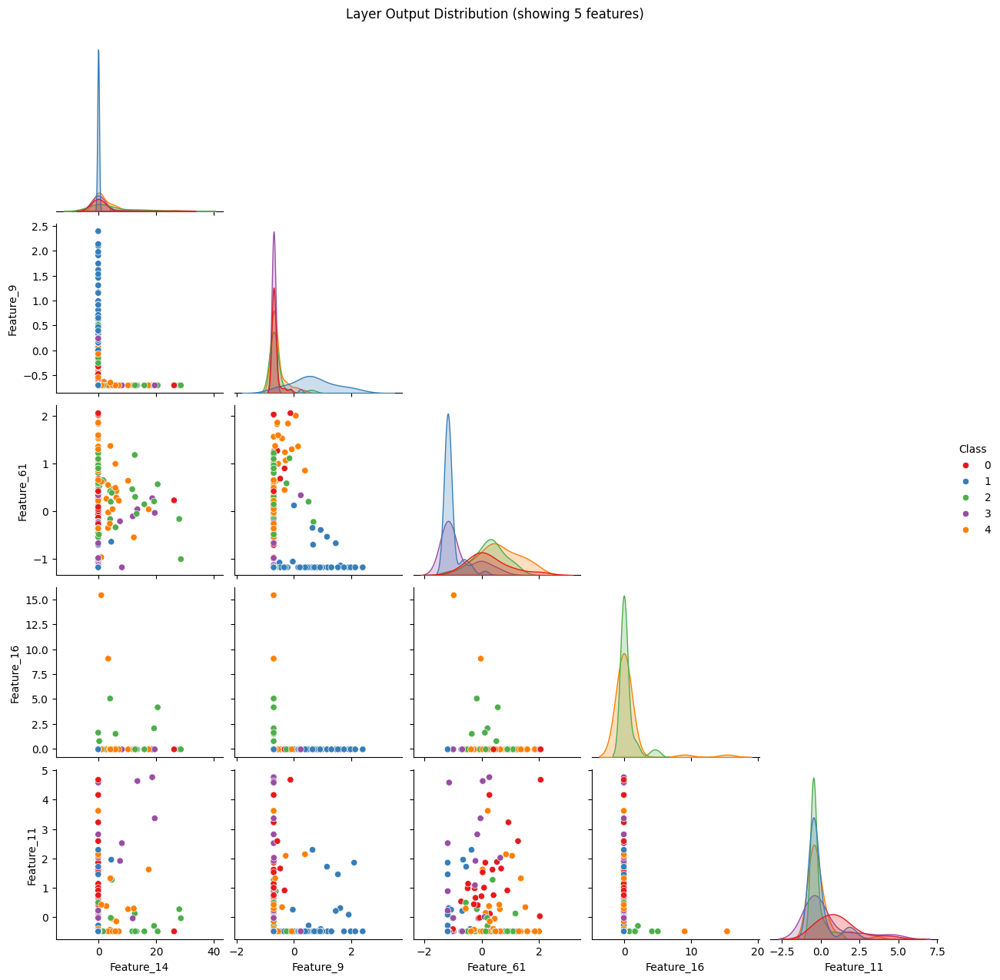

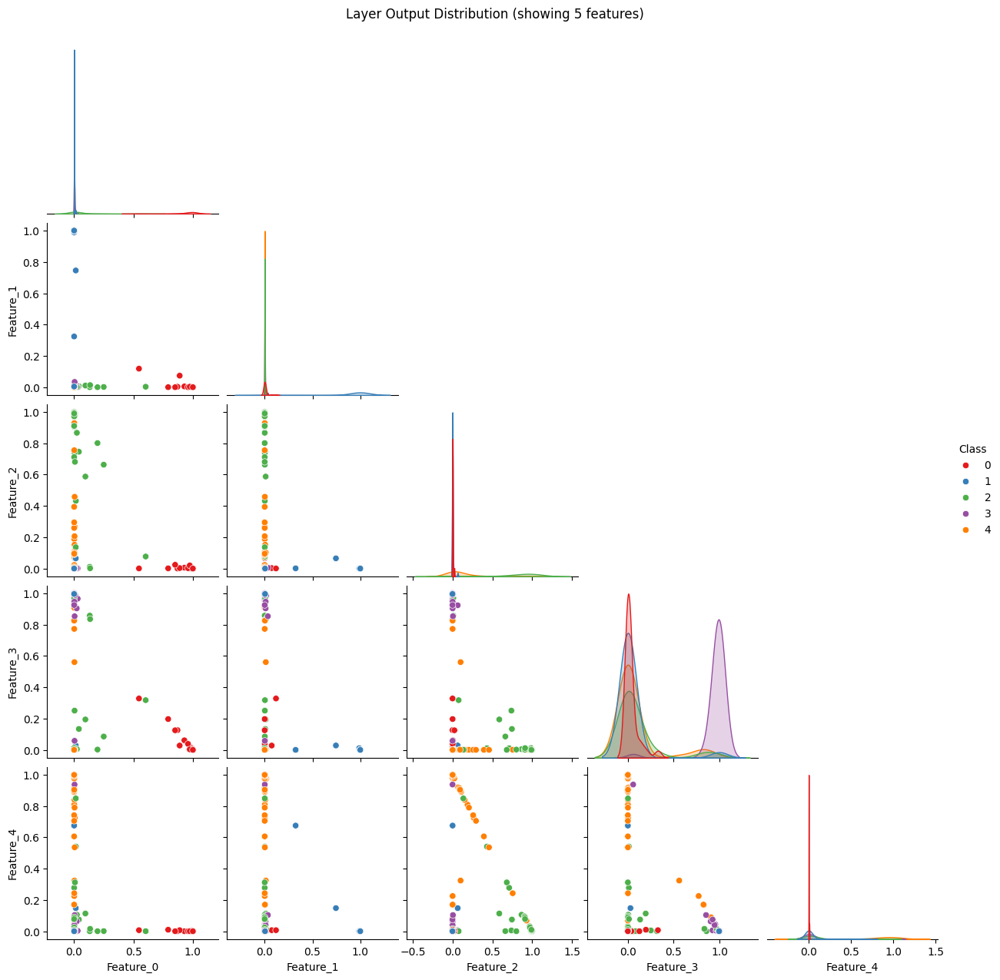

In [25]:
# YOUR CODE HERE. visualise, look at performance, train for some epoch(s), repeat
layer_outputs = extract_layers_outputs(model, x_viz)
for i ,(layer,layer_output) in enumerate(zip(model.layers, layer_outputs)):
  plot = visualize_layer_outputs(layer_output, y_viz)
  plot.savefig(f'layer_{i}.png')
  plt.show()

# visualize_layer_outputs()

# Obsevations with 6 epochs

In [26]:
# Cell created for training the model
model.fit(x_train, y_train, epochs = 6, validation_data = (x_test, y_test))

Epoch 1/6
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.9494 - loss: 0.1252 - val_accuracy: 0.8980 - val_loss: 0.3395
Epoch 2/6
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.9600 - loss: 0.1093 - val_accuracy: 0.9080 - val_loss: 0.3186
Epoch 3/6
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.9696 - loss: 0.0804 - val_accuracy: 0.9020 - val_loss: 0.3655
Epoch 4/6
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.9672 - loss: 0.0970 - val_accuracy: 0.8480 - val_loss: 0.4510
Epoch 5/6
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.9602 - loss: 0.1098 - val_accuracy: 0.9120 - val_loss: 0.3459
Epoch 6/6
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.9642 - loss: 0.1012 - val_accuracy: 0.8900 - val_loss: 0.3475


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8619 - loss: 0.4878
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
The model accuracy is: 0.8899999856948853


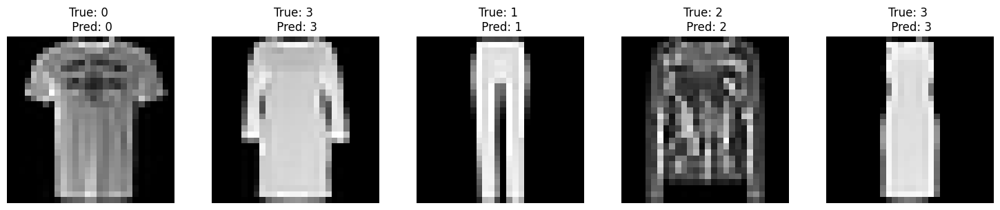

In [27]:
display_images_labels_preds(model, x_test, y_test, 5)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(32, 28, 28, 1))
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 28, 28, 1))
  warnings.warn(msg)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


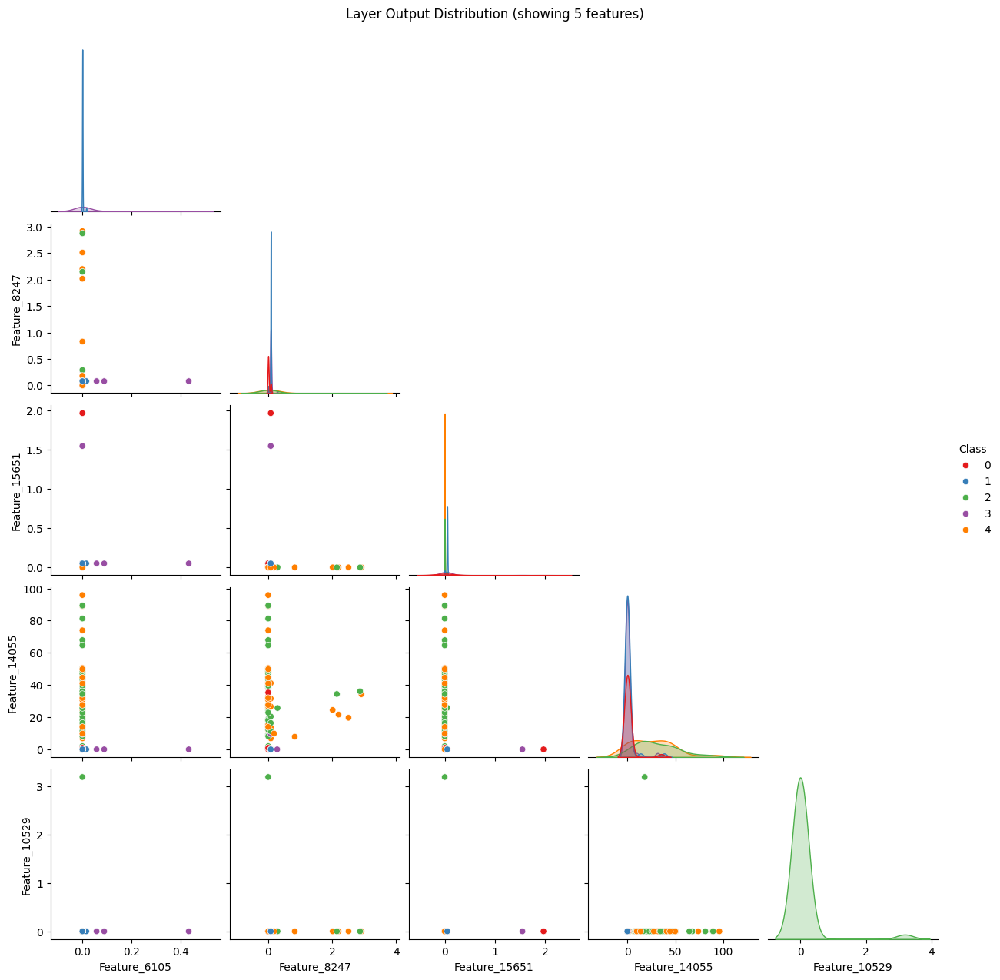

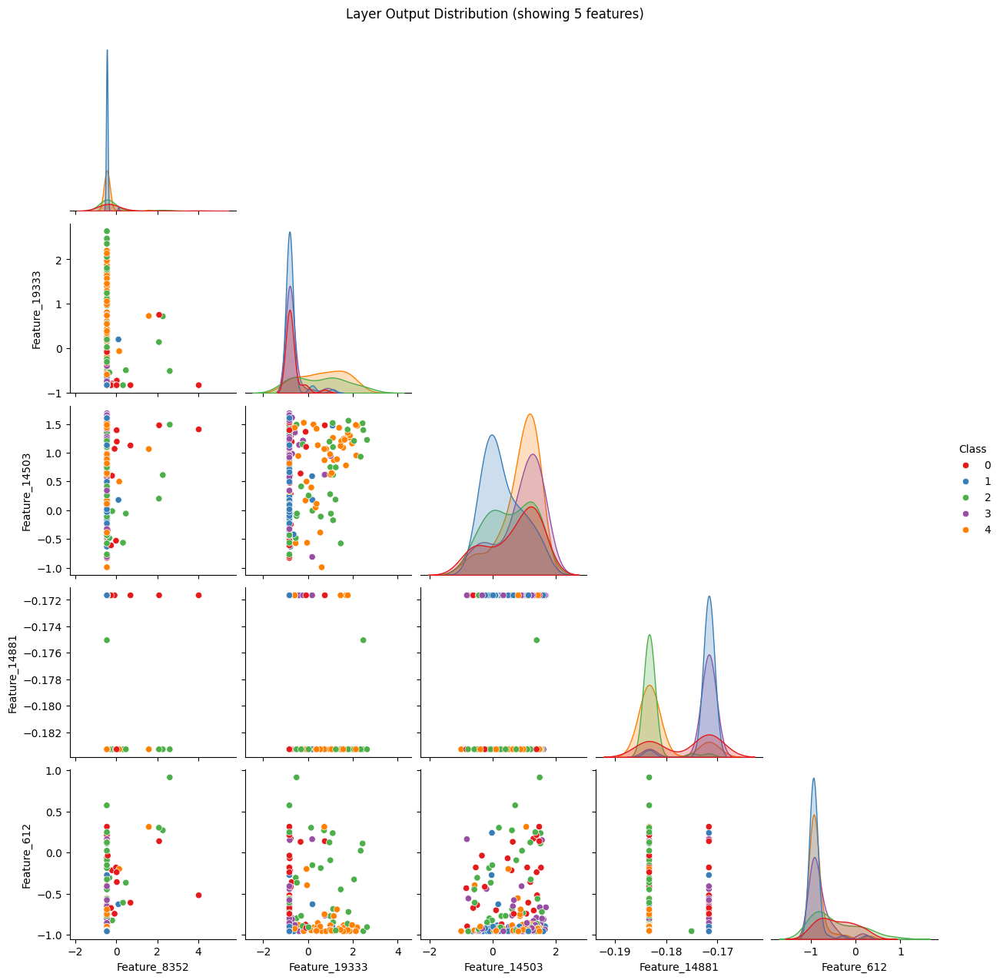

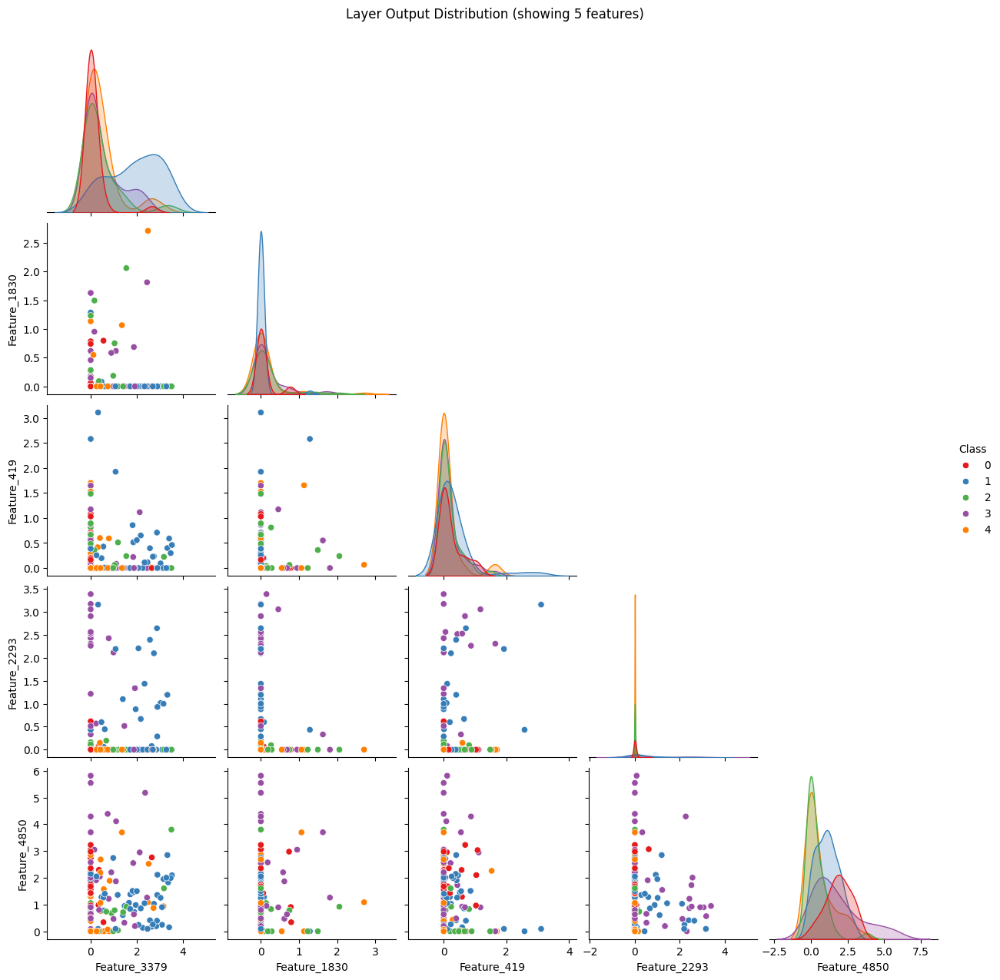

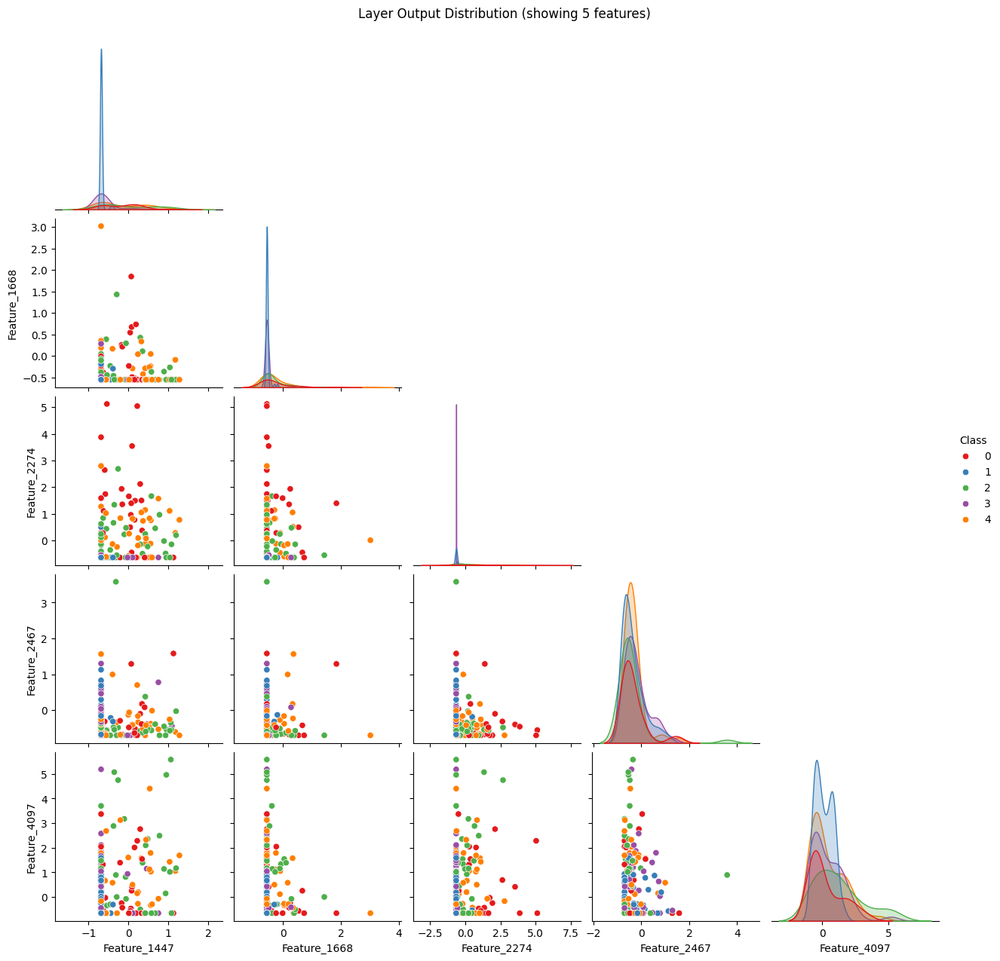

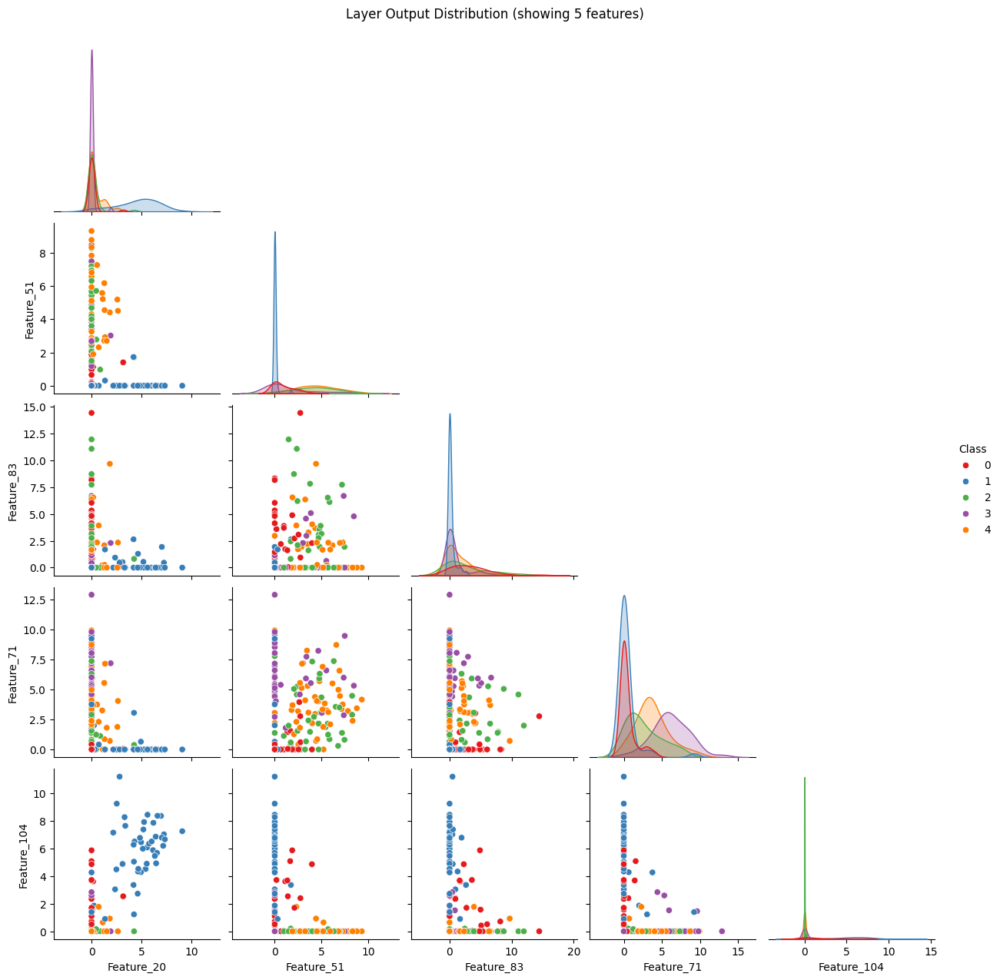

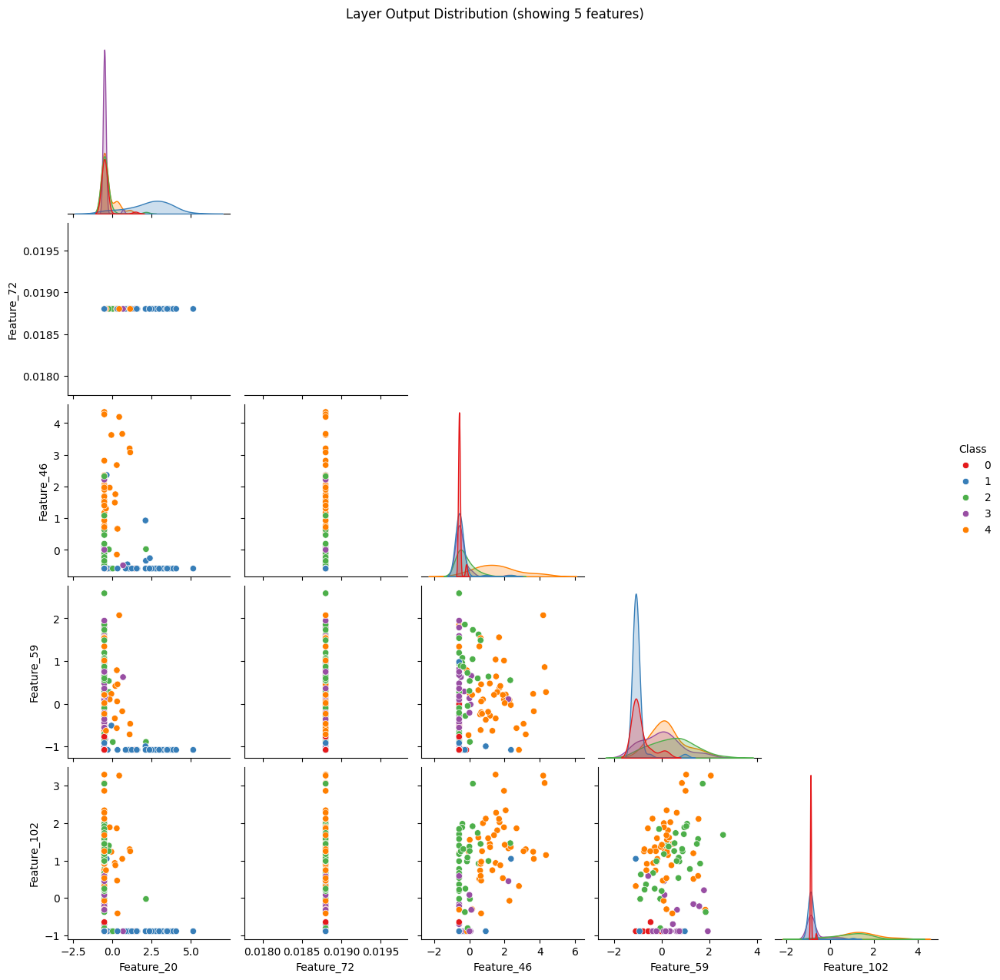

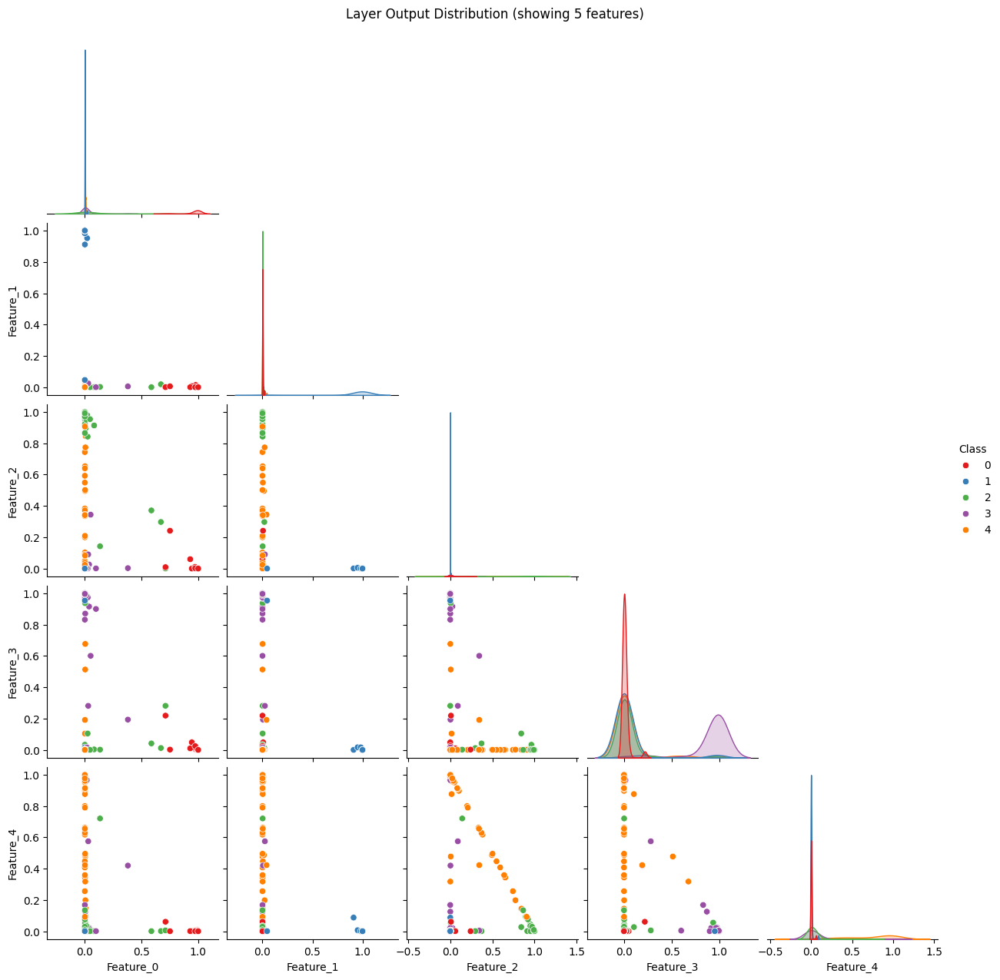

In [28]:
# YOUR CODE HERE. visualise, look at performance, train for some epoch(s), repeat
layer_outputs = extract_layers_outputs(model, x_viz)
for i ,(layer,layer_output) in enumerate(zip(model.layers, layer_outputs)):
  plot = visualize_layer_outputs(layer_output, y_viz)
  plot.savefig(f'layer_{i}.png')
  plt.show()

# visualize_layer_outputs()

# Observations with 7 epochs

In [29]:
# Cell created for training the model
model.fit(x_train, y_train, epochs = 7, validation_data = (x_test, y_test))

Epoch 1/7
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.9749 - loss: 0.0745 - val_accuracy: 0.9100 - val_loss: 0.3832
Epoch 2/7
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.9764 - loss: 0.0704 - val_accuracy: 0.9080 - val_loss: 0.3852
Epoch 3/7
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.9778 - loss: 0.0607 - val_accuracy: 0.9020 - val_loss: 0.3860
Epoch 4/7
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - accuracy: 0.9681 - loss: 0.0875 - val_accuracy: 0.9060 - val_loss: 0.3571
Epoch 5/7
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.9737 - loss: 0.0814 - val_accuracy: 0.8800 - val_loss: 0.5030
Epoch 6/7
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.9788 - loss: 0.0669 - val_accuracy: 0.8860 - val_loss: 0.4619
Epoch 7/7
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.9684 - loss: 0.0775 - val_accuracy: 0.9080 - val_loss: 0.4068


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.8796 - loss: 0.5995
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
The model accuracy is: 0.9079999923706055


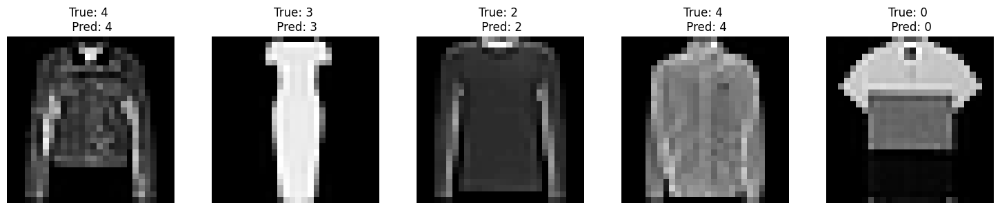

In [30]:
display_images_labels_preds(model, x_test, y_test, 5)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(32, 28, 28, 1))
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 28, 28, 1))
  warnings.warn(msg)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


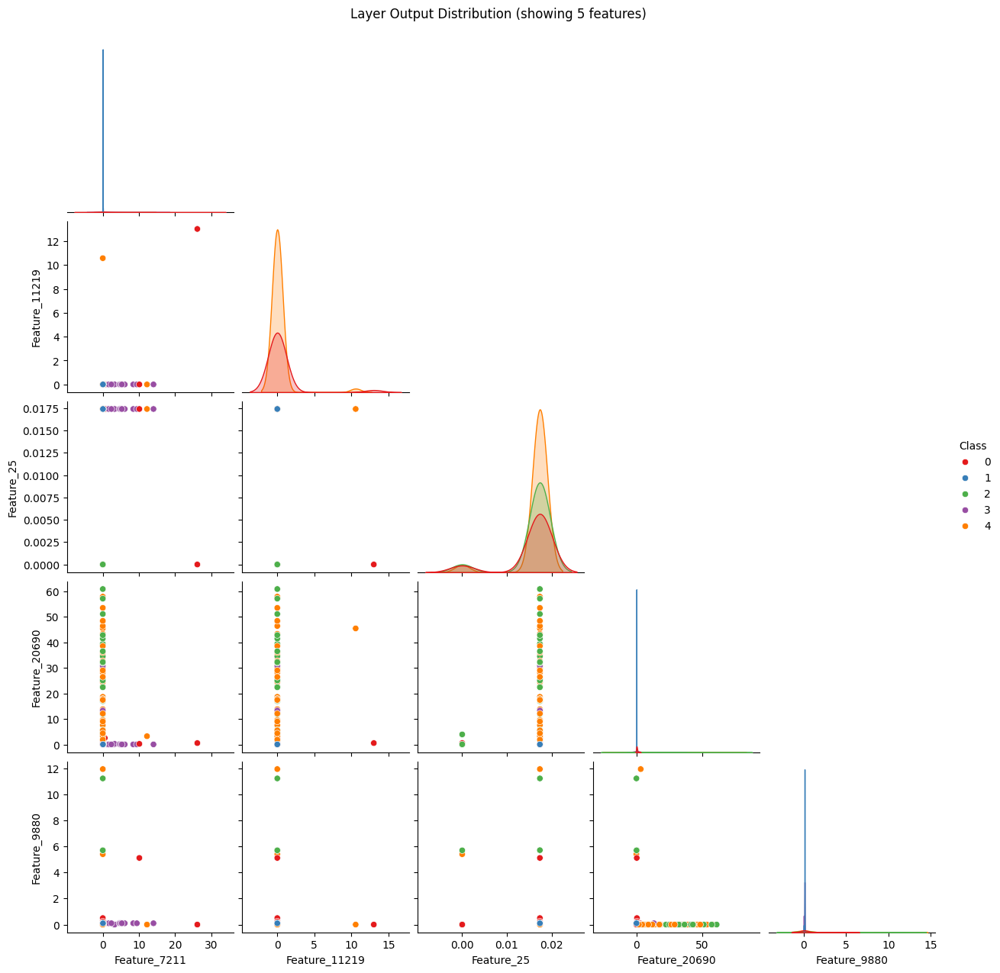

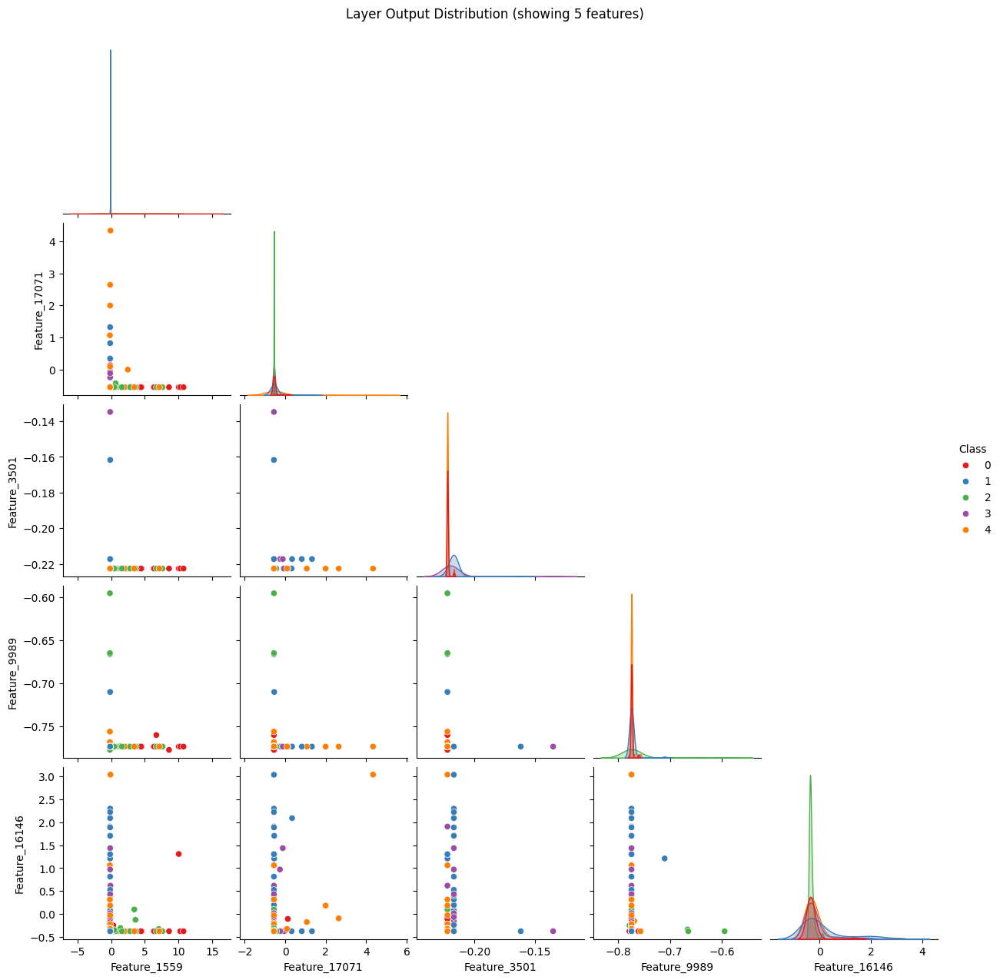

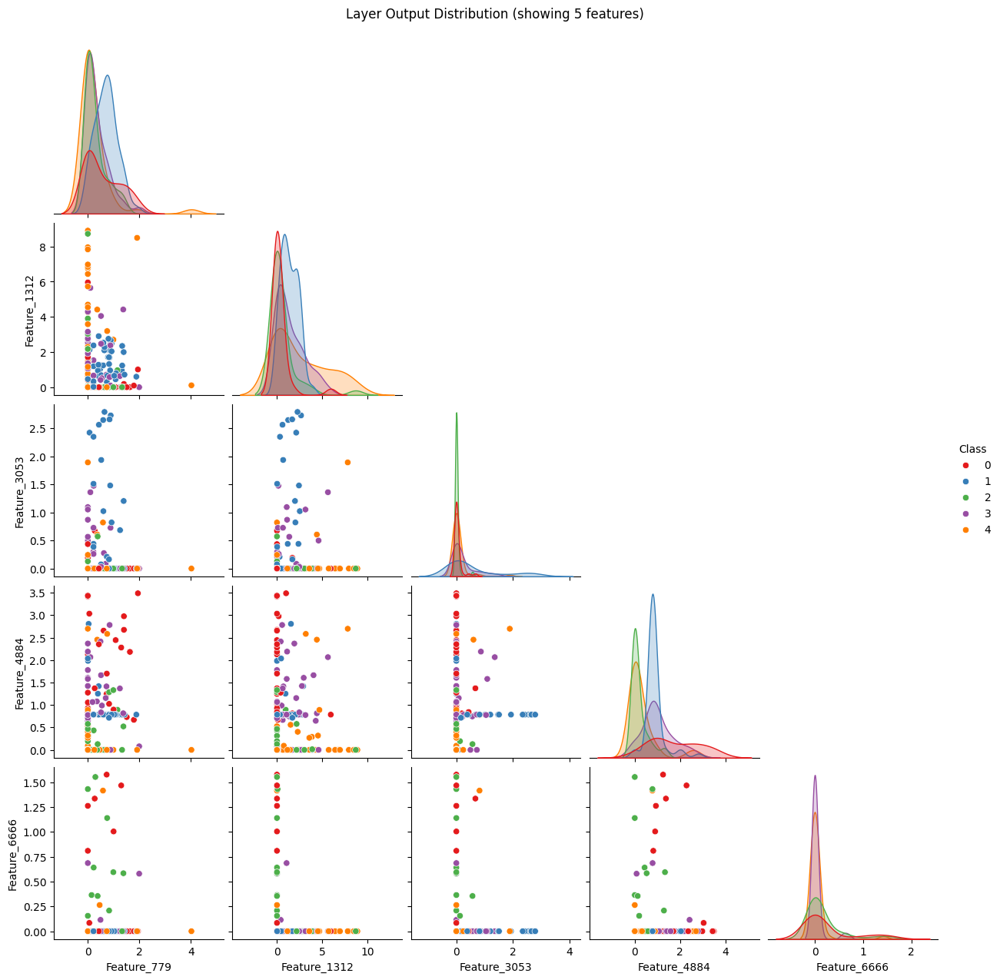

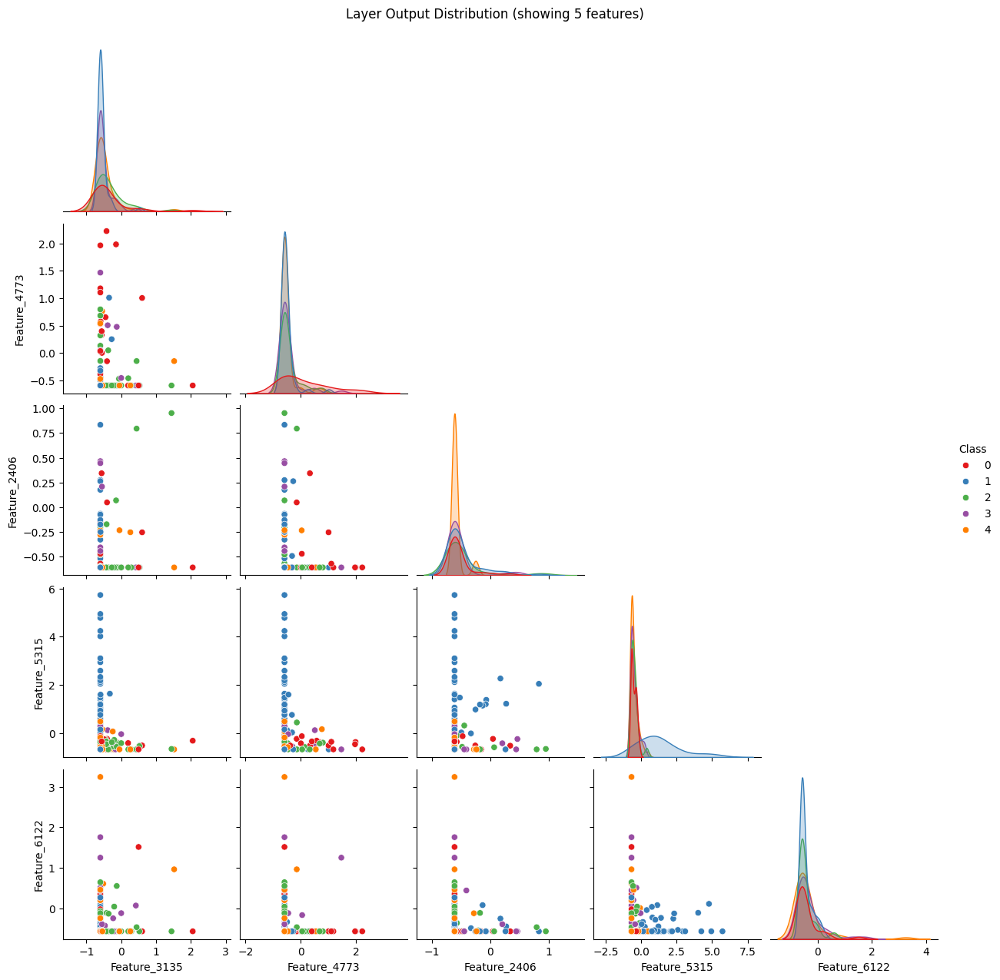

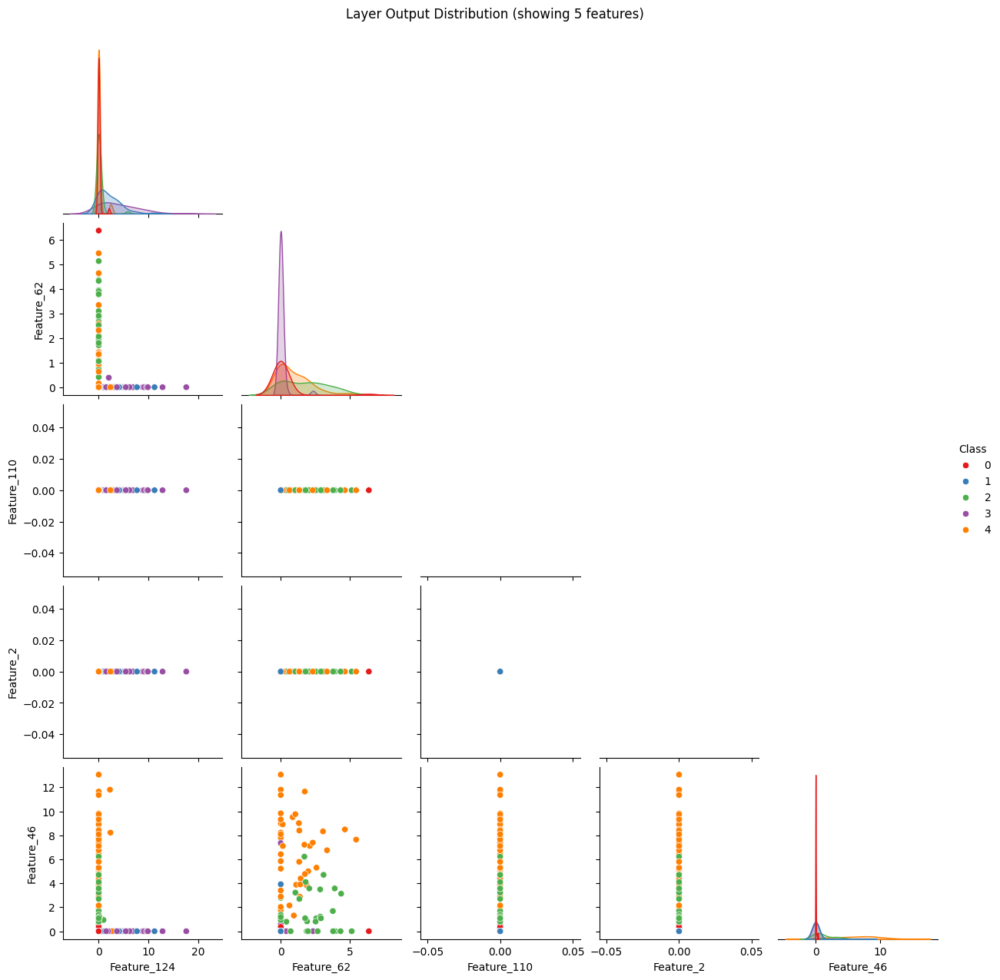

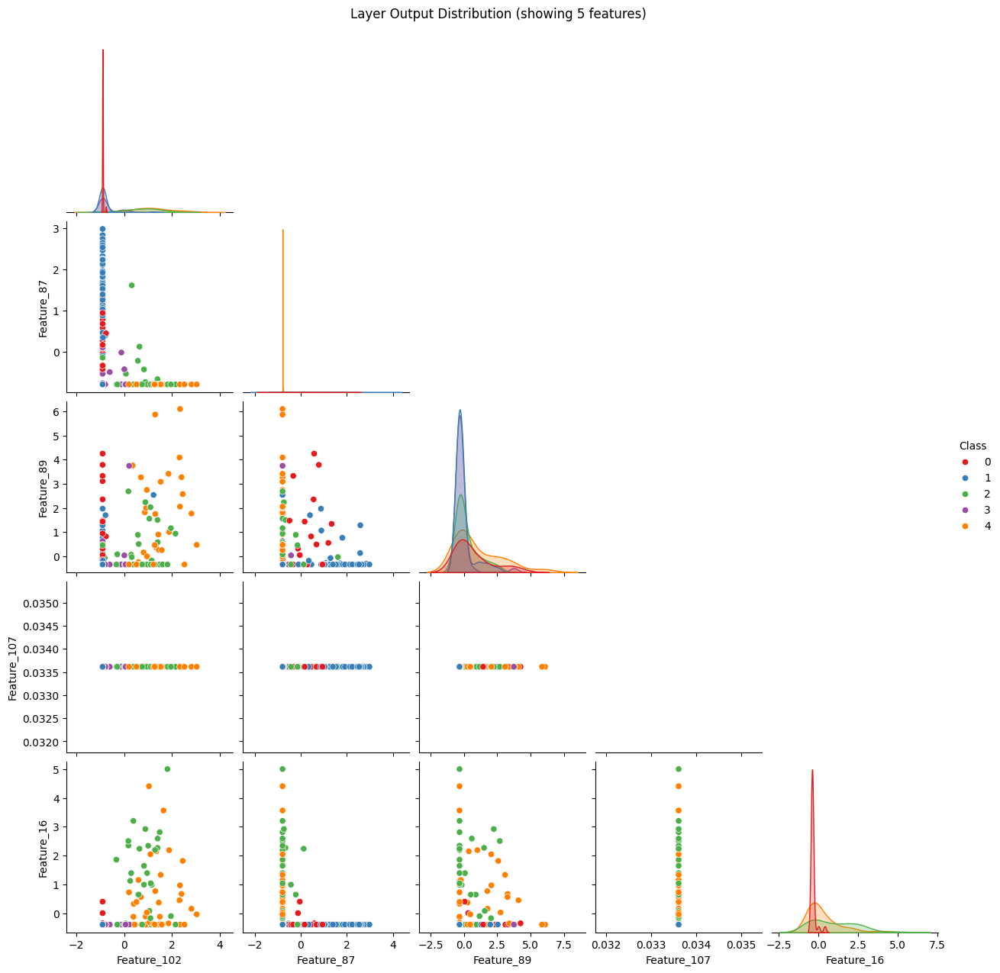

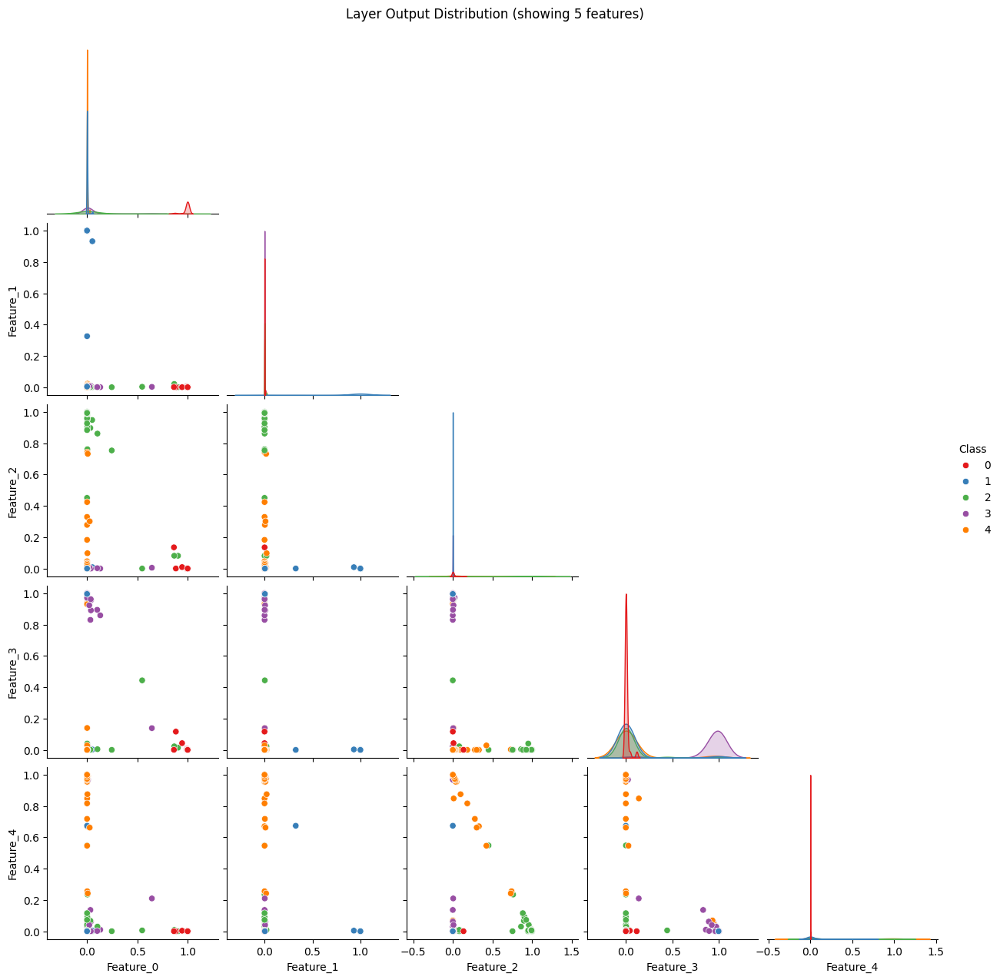

In [31]:
# YOUR CODE HERE. visualise, look at performance, train for some epoch(s), repeat
layer_outputs = extract_layers_outputs(model, x_viz)
for i ,(layer,layer_output) in enumerate(zip(model.layers, layer_outputs)):
  plot = visualize_layer_outputs(layer_output, y_viz)
  plot.savefig(f'layer_{i}.png')
  plt.show()

# visualize_layer_outputs()

# Observations with 8 epochs

In [32]:
# Cell created for training the model
model.fit(x_train, y_train, epochs = 8, validation_data = (x_test, y_test))

Epoch 1/8
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.9725 - loss: 0.0791 - val_accuracy: 0.9120 - val_loss: 0.3821
Epoch 2/8
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.9824 - loss: 0.0528 - val_accuracy: 0.8760 - val_loss: 0.4351
Epoch 3/8
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - accuracy: 0.9782 - loss: 0.0624 - val_accuracy: 0.9100 - val_loss: 0.3872
Epoch 4/8
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.9766 - loss: 0.0581 - val_accuracy: 0.8980 - val_loss: 0.4254
Epoch 5/8
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.9828 - loss: 0.0536 - val_accuracy: 0.8420 - val_loss: 0.5420
Epoch 6/8
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - accuracy: 0.9851 - loss: 0.0473 - val_accuracy: 0.8900 - val_loss: 0.4183
Epoch 7/8
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.9784 - loss: 0.0561 - val_accuracy: 0.9080 - val_loss: 0.4338
Epoch 8/8
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - accuracy: 0.9926 - loss: 0.0333 - val_accuracy: 0.9000 - val_loss:

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8694 - loss: 0.6020
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
The model accuracy is: 0.8999999761581421


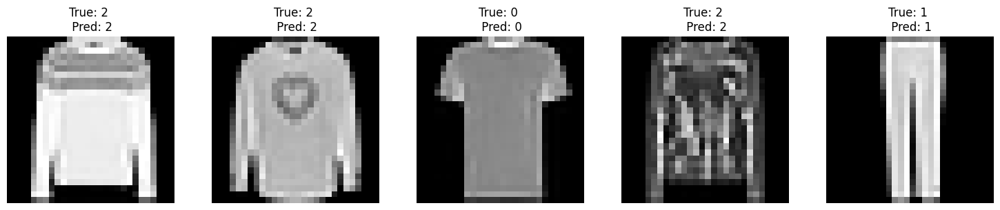

In [33]:
display_images_labels_preds(model, x_test, y_test, 5)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(32, 28, 28, 1))
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 28, 28, 1))
  warnings.warn(msg)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


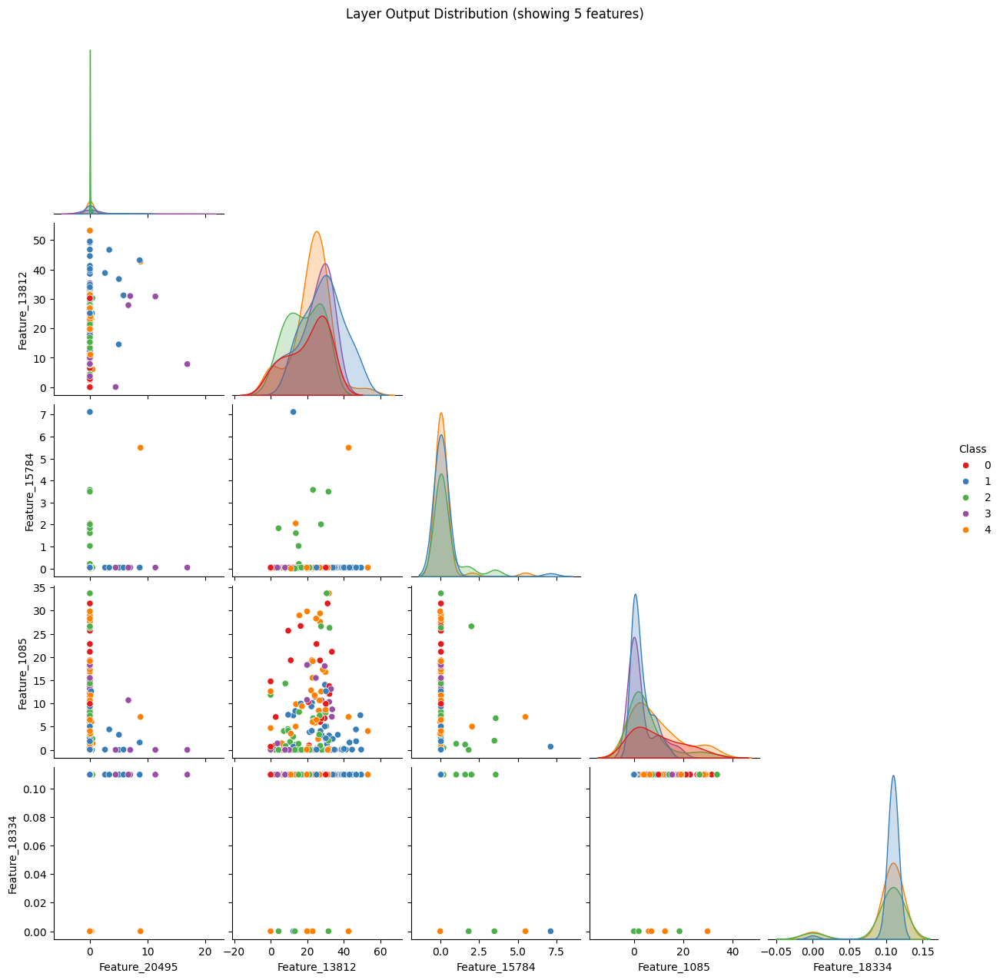

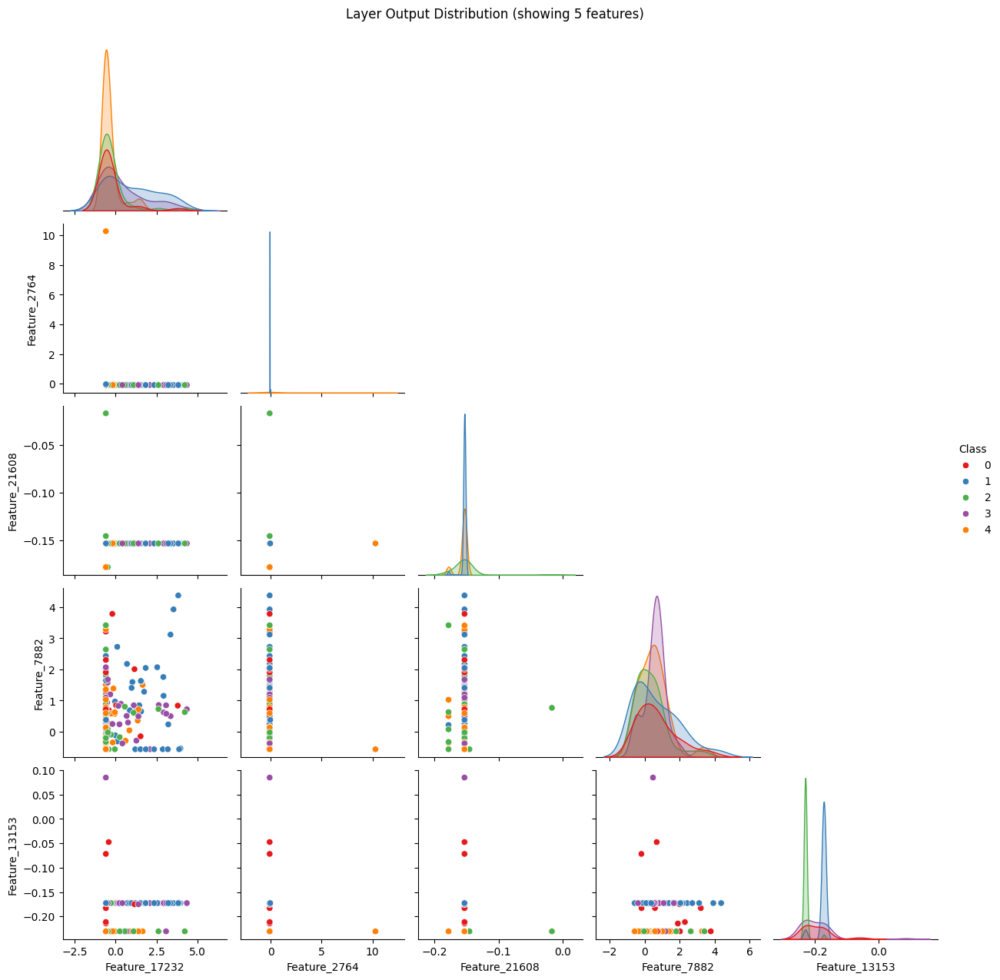

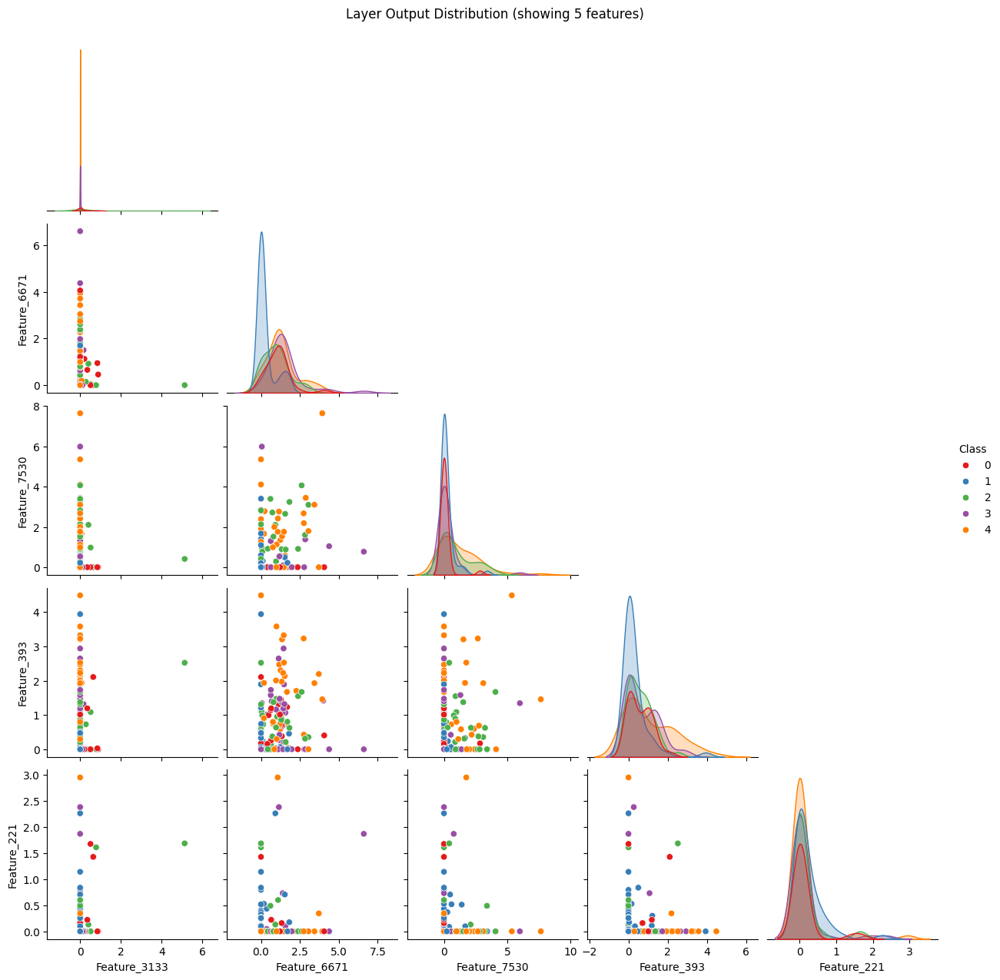

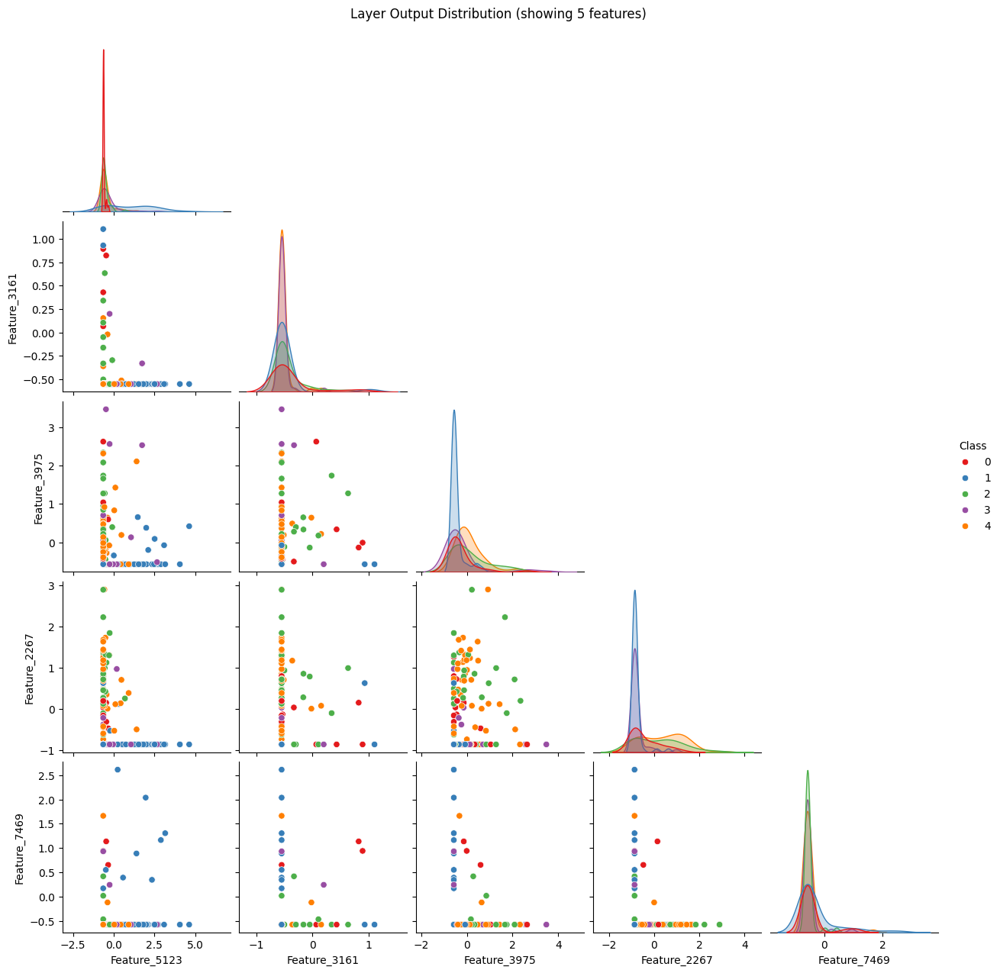

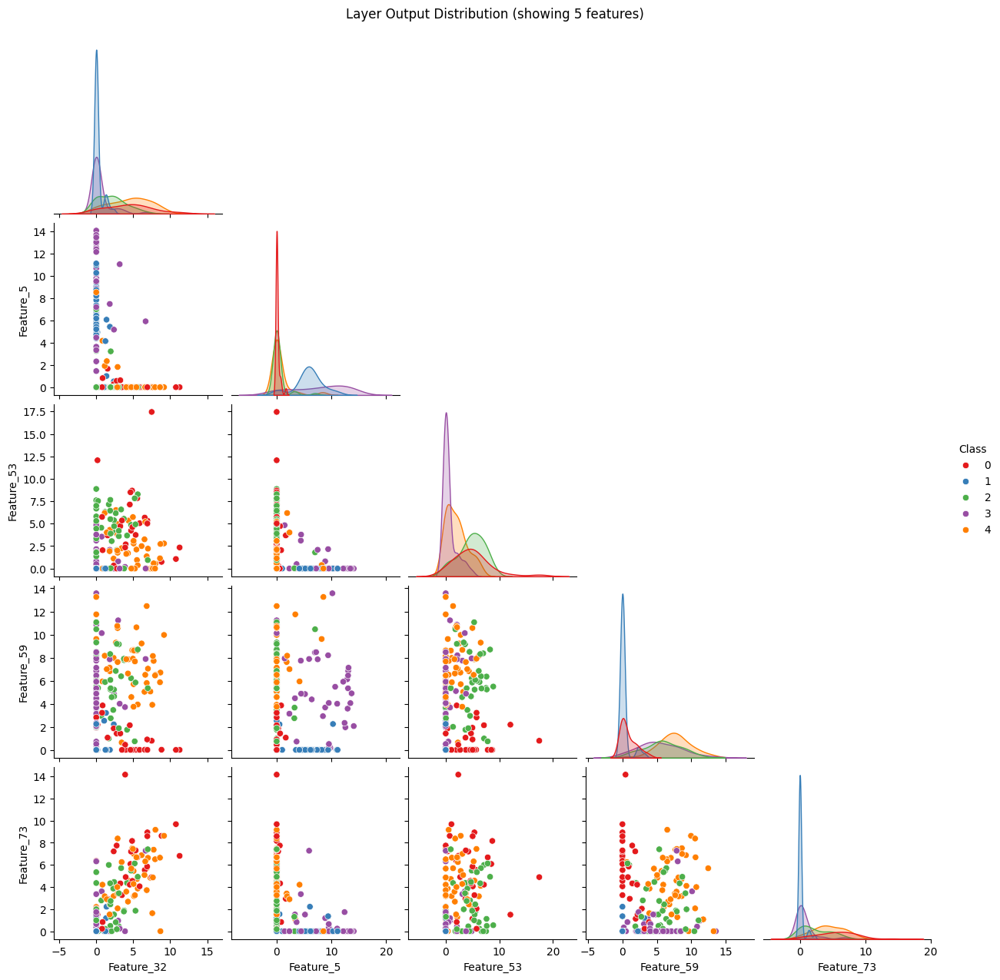

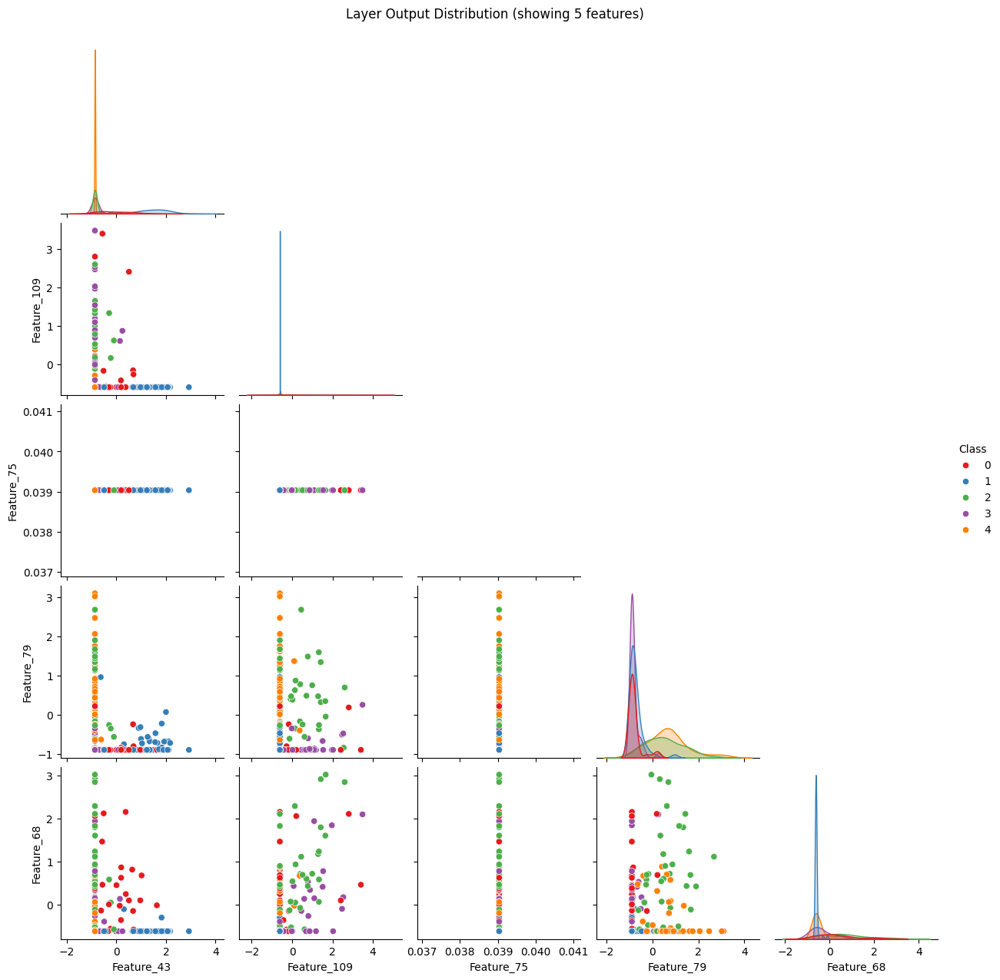

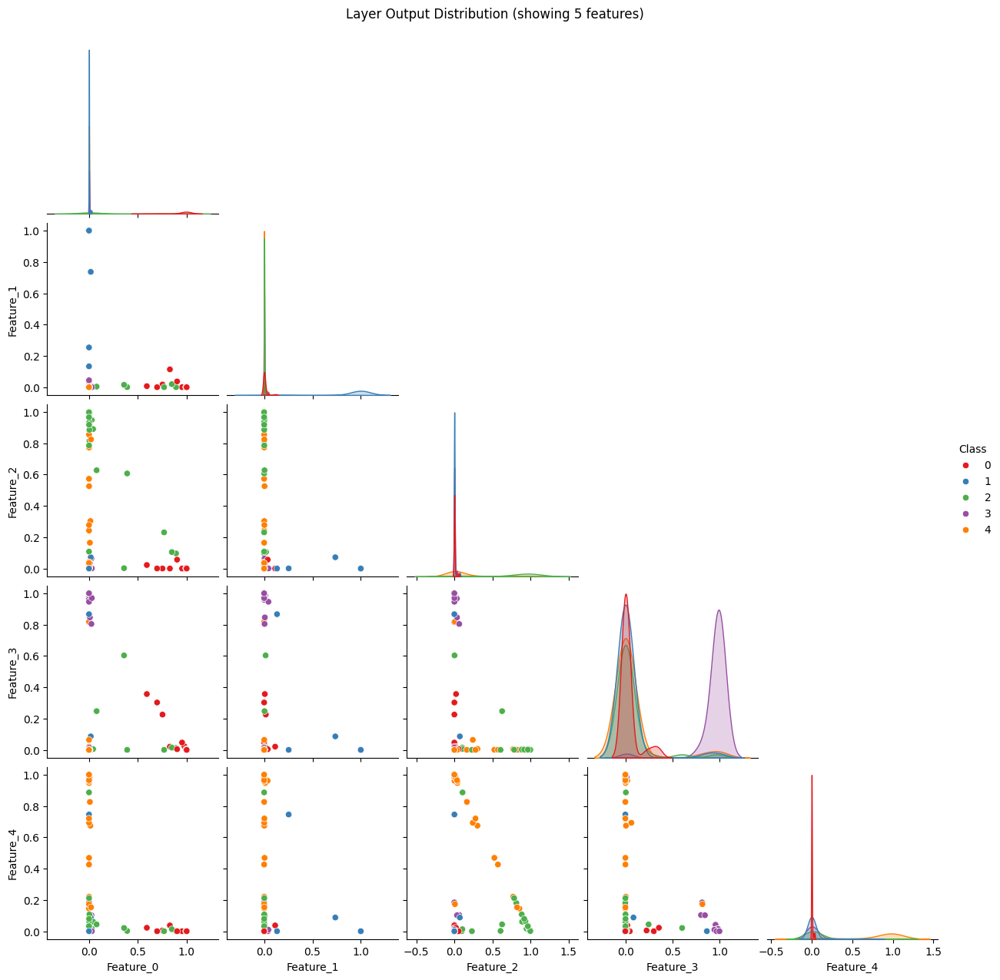

In [34]:
# YOUR CODE HERE. visualise, look at performance, train for some epoch(s), repeat
layer_outputs = extract_layers_outputs(model, x_viz)
for i ,(layer,layer_output) in enumerate(zip(model.layers, layer_outputs)):
  plot = visualize_layer_outputs(layer_output, y_viz)
  plot.savefig(f'layer_{i}.png')
  plt.show()

# visualize_layer_outputs()

# Final Observations:

We can see observe that while we are training the model at 5th-6th epoch we can notice that val_accuracy reaches its peak which around 91% and at later epochs, it continues to saturate around the value of 90% accuracy and although the training accuracy keeps increasing and reaches 99%. This shows the signs of overfitting of the model. Therefore the model should be stopped training after the 6th epoch onwards. I noticed that the value of accuracy keeps on changing, during different runs of the notebook, therefore I came to the conclusion that stopping training around 5 or 6 epochs on an average is better to avoid any overfitting.

# Observations on Pairplots:

* We can see that the pairplots as shown above show the distribution of how well a particular layer in the model can contribute properly in discriminating between the given 5 classes. We can notice that the initial layers are weak learners and doesn't contribute much in learning patterns that could discriminate well between different classes and we see quite a lot of overlaps in the graphs for each feature. But as we move forward towards the last desnse layers, We can see it becomes much clearer and can see a proper segregations between the classes (not completely but still better compared to the initial layers in the architecture of the model).

* The scatterplots tells us about correlation between 2 features, that how well does the two feature together can contribute in discriminating between the classes and the diagonal of the pairplot informs us about how each individual features contributes towards the discrimination of classes.

* We notice when we didn't train the model at all, even the final dense layers also couldn't predict well the correct classes, as from the pariplot visualisations we see a lot of overlaps in each features along the diagonal. But as the number of training of epochs increased this seperability kept on improving. The diagonal of Pairplot is a KDE plot which tells about the density (shape and overlap of activation distributions per feature).

* In the 6th epoch we can see in the final layer along the KDE, we can observe that the feature 0 - predicts class 0, feature 1- predicts class 1, feature 2 - predicts class 2 and so on, quite well as compared to its intial layers.

* From this what i am able to interpret is that the initial Layers in this architecture focuses on low-level, general features, while the fianl layers combine into high-level,task-specific represenations (Good performance meaning network has successfully transformed these low-level features into high-level representations that are tailored to the classification task, effectively seperating classes)


# Ai Usage:
I have taken help of GROK in order to get an understanding and brainstorming about what these pairplot visualizations tell us about and got a proper understanding of it. It was used for just knowledge purpose and all the insights were written by myself on my own understanding. The prompts use for this brainstorming were as follows:


* Help me understand how outputs from each layer of my model when passed on to the visualization code helps me understand about the each activation values provided by each layers.

* Does the scatterplots tell me about correlations between two features in contribution towards seperability and KDE plot at diagonal tells me individual contribution of each layer towards seperability to predict the final classes.


# Citations used:
https://keras.io/getting_started/faq/
https://keras.io/getting_started/faq/#how-can-i-obtain-the-output-of-an-intermediate-layer-feature-extraction